In [1]:
import numpy as np
import scipy
import h5py
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

from simulation_data import get
from simulation_data.galaxies import GalaxyPopulation
my_galaxy_population = GalaxyPopulation()
from simulation_data.galaxies.galaxy import age_profile, get_star_formation_history, get_galaxy_particle_data, get_stellar_assembly_data, metallicity_profile, metals_profile, gasmetals_profile, metals_density_profile, metals_particle_profile, get_insitu, histmetals_density_profile, halfmass_rad_stars

redshift = 2

Load pre-calculated data from file: ```galaxy_population_data_2.hdf5``` for faster execution.

In [2]:
with h5py.File('galaxy_population_data_'+str(2)+'.hdf5', 'r') as f:
    ids = f['ids'][:]
    median_age = f['median_age'][:]
    halfmass_radius = f['halfmass_radius'][:]
    total_mass = f['total_mass'][:]
    halflight_radius_U = f['halflight_radius_U'][:]
    halflight_radius_V = f['halflight_radius_V'][:]
    halflight_radius_I = f['halflight_radius_I'][:]
    newbin_current_SFR = f['newbin_current_SFR'][:]
    maximum_merger_ratio_30kpc_current_fraction = f['maximum_merger_ratio_30kpc_current_fraction'][:]
    FeH_Re = f['FeH_Re'][:]
    MgFe_Re = f['MgFe_Re'][:]
    MgH_Re = f['MgH_Re'][:]
    FeH_1kpc = f['FeH_1kpc'][:]
    MgFe_1kpc = f['MgFe_1kpc'][:]
    MgH_1kpc = f['MgH_1kpc'][:]

Now apply the selection criteria for star-forming, young quiescent (post-starburst), intermediate, and old quiescent galaxies at $z=2$.

In [3]:
import warnings
warnings.filterwarnings('ignore')

PSB_selection = (median_age<=1.2)&(np.log10(newbin_current_SFR/10**(total_mass))<=-10.5)
intermediate_quiescent_selection = (median_age>1.2)&(median_age<=1.5)&(np.log10(newbin_current_SFR/10**(total_mass))<=-10.5)
old_quiescent_selection = (median_age>1.5)&(np.log10(newbin_current_SFR/10**(total_mass))<=-10.5)
starforming_selection = (np.log10(newbin_current_SFR/10**(total_mass))>-10.5)
quiescent_selection = (np.log10(newbin_current_SFR/10**(total_mass))<=-10.5)

### Figure 1 (test figure)

Star formation histories for the four galaxy populations. For the star-forming population we only show 80 randomly drawn galaxies, for clarity.  The curves are binned over 100 Myr and normalized by the total mass formed.  In each panel a bold curve marks the median trend.

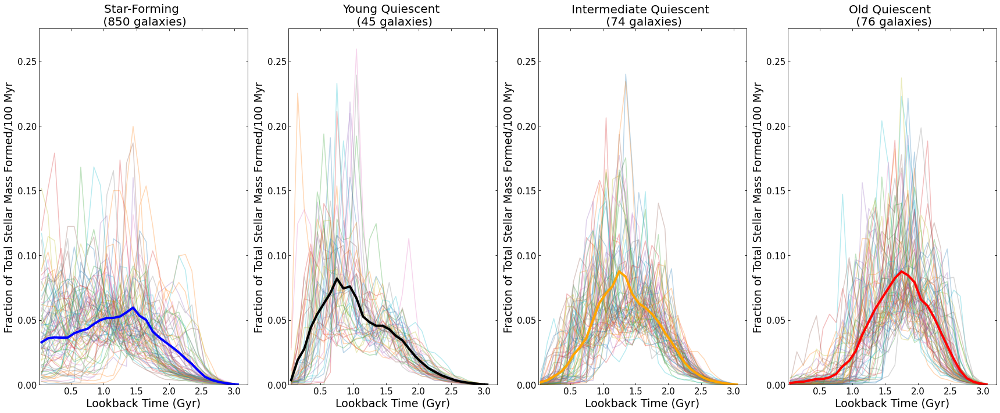

In [4]:
# SFH of all 4 galaxy classes
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')

redshift=2
binwidth=0.1 #Gyr

#panel 1: 80 star-forming galaxies
HistWeights = np.zeros(0)
LookbackTime = np.zeros(0)
np.random.seed(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    id_SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth)[1]
    ax1.plot(get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth)[0], id_SFH/np.sum(id_SFH), alpha = 0.3)
    stellar_data = get_galaxy_particle_data(id=id , redshift=redshift, populate_dict=True)
    HistWeights = np.concatenate((HistWeights, stellar_data['stellar_initial_masses']), axis = None) #units: logMsol/yr
    LookbackTime = np.concatenate((LookbackTime, stellar_data['LookbackTime']), axis = None)
SFH, BE = np.histogram(LookbackTime, bins=np.arange(0, max(LookbackTime), binwidth), weights=HistWeights, density = True)
bincenters = [(BE[i]+BE[i+1])/2. for i in range(len(BE)-1)]
ax1.plot(bincenters, SFH/np.sum(SFH), color = 'b', lw=4)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=20)
ax1.set_xlim(0.01, 3.2)
ax1.set_ylim(0, 0.275)
ax1.set_ylabel("Fraction of Total Stellar Mass Formed/100 Myr", fontsize=19)
ax1.set_xlabel("Lookback Time (Gyr)", fontsize=19)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)

#panel 2: young quiescent galaxies
HistWeights = np.zeros(0)
LookbackTime = np.zeros(0)
for id in ids[PSB_selection]:
    id_SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth)[1]
    ax2.plot(get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth)[0], id_SFH/np.sum(id_SFH), alpha = 0.3)
    stellar_data = get_galaxy_particle_data(id=id , redshift=redshift, populate_dict=True)
    HistWeights = np.concatenate((HistWeights, stellar_data['stellar_initial_masses']), axis = None) #units: logMsol/yr
    LookbackTime = np.concatenate((LookbackTime, stellar_data['LookbackTime']), axis = None)
SFH, BE = np.histogram(LookbackTime, bins=np.arange(0, max(LookbackTime), binwidth), weights=HistWeights, density = True)
bincenters = [(BE[i]+BE[i+1])/2. for i in range(len(BE)-1)]
ax2.plot(bincenters, SFH/np.sum(SFH), color = 'k', lw=4)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=20)
ax2.set_xlim(0.01, 3.2)
ax2.set_ylim(0, 0.275)
ax2.set_ylabel("Fraction of Total Stellar Mass Formed/100 Myr", fontsize=19)
ax2.set_xlabel("Lookback Time (Gyr)", fontsize=19)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)

#panel 3: intermediate quiescent galaxies
HistWeights = np.zeros(0)
LookbackTime = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    id_SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth)[1]
    ax3.plot(get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth)[0], id_SFH/np.sum(id_SFH), alpha = 0.3)
    stellar_data = get_galaxy_particle_data(id=id , redshift=redshift, populate_dict=True)
    HistWeights = np.concatenate((HistWeights, stellar_data['stellar_initial_masses']), axis = None) #units: logMsol/yr
    LookbackTime = np.concatenate((LookbackTime, stellar_data['LookbackTime']), axis = None)
SFH, BE = np.histogram(LookbackTime, bins=np.arange(0, max(LookbackTime), binwidth), weights=HistWeights, density = True)
bincenters = [(BE[i]+BE[i+1])/2. for i in range(len(BE)-1)]
ax3.plot(bincenters, SFH/np.sum(SFH), color = 'orange', lw=4)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=20)
ax3.set_xlim(0.01, 3.2)
ax3.set_ylim(0, 0.275)
ax3.set_xlabel("Lookback Time (Gyr)", fontsize=19)
ax3.set_ylabel("Fraction of Total Stellar Mass Formed/100 Myr", fontsize=19)
ax3.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)

#panel 4: old quiescent galaxies
HistWeights = np.zeros(0)
LookbackTime = np.zeros(0)
for id in ids[old_quiescent_selection]:
    id_SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth)[1]
    ax4.plot(get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth)[0], id_SFH/np.sum(id_SFH), alpha = 0.3)
    stellar_data = get_galaxy_particle_data(id=id , redshift=redshift, populate_dict=True)
    HistWeights = np.concatenate((HistWeights, stellar_data['stellar_initial_masses']), axis = None) #units: logMsol/yr
    LookbackTime = np.concatenate((LookbackTime, stellar_data['LookbackTime']), axis = None)
SFH, BE = np.histogram(LookbackTime, bins=np.arange(0, max(LookbackTime), binwidth), weights=HistWeights, density = True)
bincenters = [(BE[i]+BE[i+1])/2. for i in range(len(BE)-1)]
ax4.plot(bincenters, SFH/np.sum(SFH), color = 'red', lw=4)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=20)
ax4.set_xlim(0.01, 3.2)
ax4.set_ylim(0, 0.275)
ax4.set_xlabel("Lookback Time (Gyr)", fontsize=19)
ax4.set_ylabel("Fraction of Total Stellar Mass Formed/100 Myr", fontsize=19)
ax4.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)

f.tight_layout()
#f.show()
#Note that the sum of the histogram values will not be equal to 1 unless bins of unity width are chosen; 
#it is not a probability mass function.

# [Z]

### Figure 3

Radial metallicity profiles for the four galaxy populations (thin lines). For the star-forming population we only show 80 randomly drawn galaxies, for clarity. The running median for each population is shown in thick unbroken lines.

[0.00000000e+00 1.57439999e-01 2.12183491e-01 2.54279501e-01
 2.89692739e-01 3.21685884e-01 3.51862371e-01 3.80496740e-01
 4.08357492e-01 4.35830049e-01 4.63064379e-01 4.90359574e-01
 5.18115369e-01 5.46125619e-01 5.74723625e-01 6.04248888e-01
 6.34810581e-01 6.66429234e-01 6.99529853e-01 7.34558475e-01
 7.71577925e-01 8.11055729e-01 8.53819467e-01 9.00180610e-01
 9.50841347e-01 1.00690316e+00 1.07023708e+00 1.14319146e+00
 1.22859014e+00 1.33060185e+00 1.45434440e+00 1.60391020e+00
 1.78295852e+00 2.00072879e+00 2.26575244e+00 2.58336677e+00
 2.96479968e+00 3.41622488e+00 3.94356565e+00 4.55483587e+00
 5.27677208e+00 6.16556522e+00 7.29923660e+00 8.81213029e+00
 1.09313666e+01 1.41123649e+01 1.91168453e+01 2.70152970e+01
 3.97304111e+01 6.92086656e+01 8.68943678e+02]


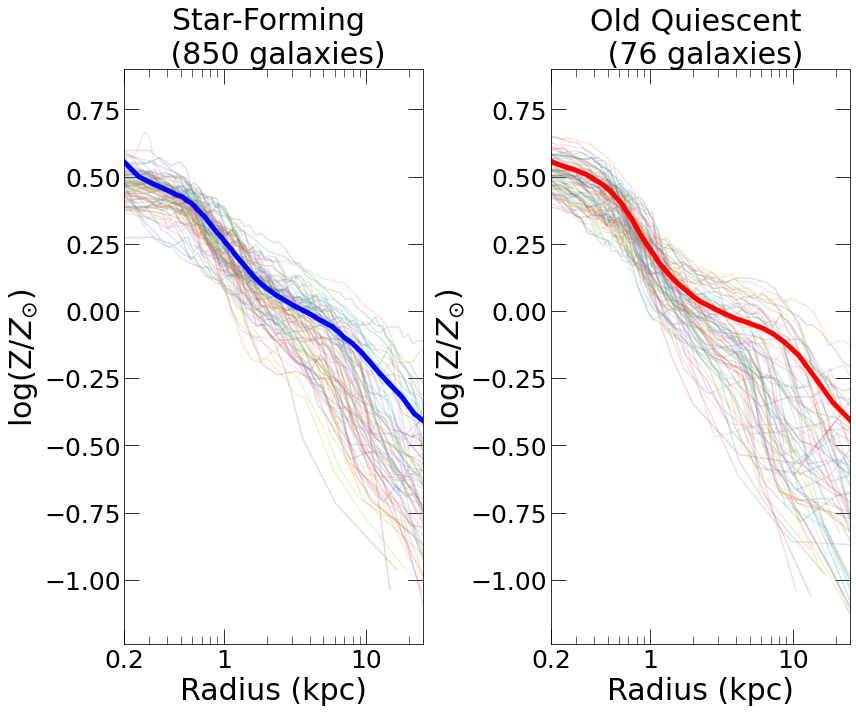

In [5]:
#metallicity profiles
f, (ax1, ax4) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(12, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
fts = 30
ftss = 25

#z=2 star-forming galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins)
    big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax1.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='blue', linewidth=5, label='median')

# fit line to star-forming galaxies
# def func(x, a, b, c):
#     return a*np.log10(x+b) + c
# popt, pcov = curve_fit(func, radial_percentiles[1:], statistic)
# label = str(popt[0]) + '*log(x+' + str(popt[1]) + ') + ' + str(popt[2])
# ax1.plot(np.array(radial_percentiles[1:]), np.log10(func(radial_percentiles[1:], *popt)), 'b--', linewidth=2, label=label)
# ax1.legend()

ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(-1.24, 0.9)
ax1.set_xlabel("Radius (kpc)", fontsize=fts)
ax1.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=fts)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

# #z=2 young quiescent galaxies
# distance = np.zeros(0)
# big_metallicity = np.zeros(0)
# for id in ids[PSB_selection]:
#     yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins)
#     big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
#     ax2.plot(xx, np.log10(yy), alpha = 0.2)
#     distance = np.concatenate((distance, R), axis = None)
# radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
# for i in range(1, (n_bins+1)):
#     radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
# statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
# ax2.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='black', linewidth=5)
# ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=fts) #
# ax2.set_xlim(0.2, 25)
# ax2.set_ylim(-1.24, 0.9)
# ax2.set_xlabel("Radius (kpc)", fontsize=fts)
# ax2.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=fts)
# ax2.set_xscale('log')
# ax2.tick_params(which='major', length=15)
# ax2.tick_params(which='minor', length=8)
# ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax2.set_xticks([0.2, 1, 10], minor=False)
# ax2.set_xticklabels(['0.2', '1', '10'])

# #z=2 intermediate quiescent galaxies
# distance = np.zeros(0)
# big_metallicity = np.zeros(0)
# for id in ids[intermediate_quiescent_selection]:
#     yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins)
#     big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
#     ax3.plot(xx, np.log10(yy), alpha = 0.2)
#     distance = np.concatenate((distance, R), axis = None)
# radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
# for i in range(1, (n_bins+1)):
#     radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
# statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
# ax3.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='orange', linewidth=5)
# ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=fts) #
# ax3.set_xlim(0.2, 25)
# ax3.set_ylim(-1.24, 0.9)
# ax3.set_xlabel("Radius (kpc)", fontsize=fts)
# ax3.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=fts)
# ax3.set_xscale('log')
# ax3.tick_params(which='major', length=15)
# ax3.tick_params(which='minor', length=8)
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax3.set_xticks([0.2, 1, 10], minor=False)
# ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[old_quiescent_selection]:
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins)
    big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax4.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
print(radial_percentiles)
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax4.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='red', linewidth=5)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=fts)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(-1.24, 0.9)
ax4.set_xlabel("Radius (kpc)", fontsize=fts)
ax4.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=fts)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

plt.savefig('REU\profiles.png', dpi=400)

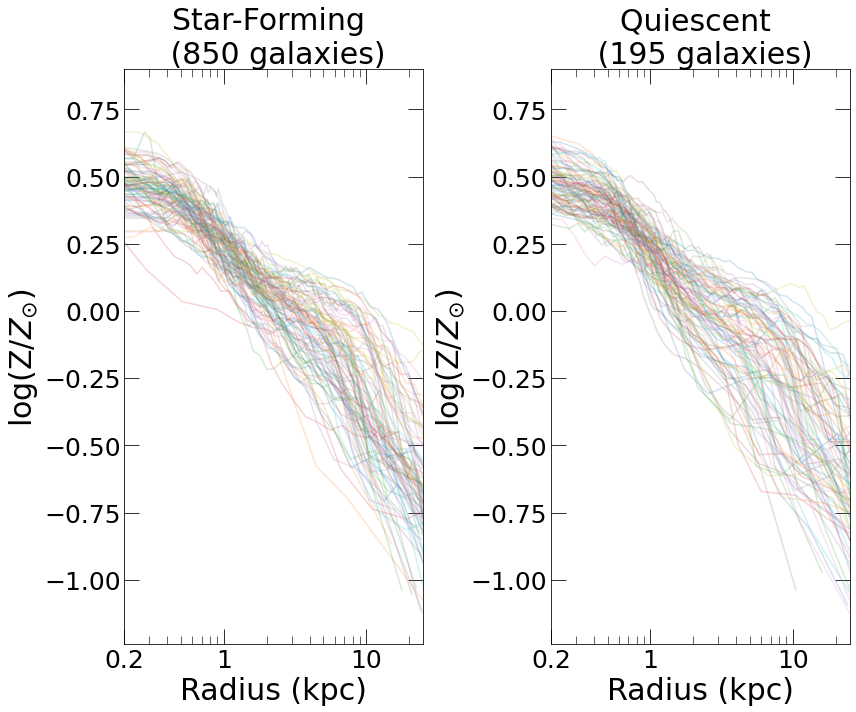

In [103]:
#metallicity profiles
f, (ax1, ax4) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(12, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
fts = 30
ftss = 25

#z=2 star-forming galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins)
    big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax1.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
# for i in range(1, (n_bins+1)):
#     radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
# statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
# ax1.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='blue', linewidth=5, label='median')

# fit line to star-forming galaxies
# def func(x, a, b, c):
#     return a*np.log10(x+b) + c
# popt, pcov = curve_fit(func, radial_percentiles[1:], statistic)
# label = str(popt[0]) + '*log(x+' + str(popt[1]) + ') + ' + str(popt[2])
# ax1.plot(np.array(radial_percentiles[1:]), np.log10(func(radial_percentiles[1:], *popt)), 'b--', linewidth=2, label=label)
# ax1.legend()

ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(-1.24, 0.9)
ax1.set_xlabel("Radius (kpc)", fontsize=fts)
ax1.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=fts)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[PSB_selection], 30, replace=False):
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins)
    big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax4.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
# radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
# for i in range(1, (n_bins+1)):
#     radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
# statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
# ax2.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='black', linewidth=5)
# ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=fts) #
# ax2.set_xlim(0.2, 25)
# ax2.set_ylim(-1.24, 0.9)
# ax2.set_xlabel("Radius (kpc)", fontsize=fts)
# ax2.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=fts)
# ax2.set_xscale('log')
# ax2.tick_params(which='major', length=15)
# ax2.tick_params(which='minor', length=8)
# ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax2.set_xticks([0.2, 1, 10], minor=False)
# ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[intermediate_quiescent_selection], 30, replace=False):
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins)
    big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax4.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
# radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
# for i in range(1, (n_bins+1)):
#     radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
# statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
# ax3.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='orange', linewidth=5)
# ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=fts) #
# ax3.set_xlim(0.2, 25)
# ax3.set_ylim(-1.24, 0.9)
# ax3.set_xlabel("Radius (kpc)", fontsize=fts)
# ax3.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=fts)
# ax3.set_xscale('log')
# ax3.tick_params(which='major', length=15)
# ax3.tick_params(which='minor', length=8)
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax3.set_xticks([0.2, 1, 10], minor=False)
# ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[old_quiescent_selection], 30, replace=False):
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins)
    big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax4.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
# radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
# for i in range(1, (n_bins+1)):
#     radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
# statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
# ax4.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='red', linewidth=5)
ax4.set_title('Quiescent \n ('+str(len(ids[old_quiescent_selection])+len(ids[intermediate_quiescent_selection])+len(ids[PSB_selection]))+' galaxies)', fontsize=fts)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(-1.24, 0.9)
ax4.set_xlabel("Radius (kpc)", fontsize=fts)
ax4.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=fts)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

#plt.savefig('REU\profiles.png', dpi=400)

[0.00000000e+00 1.57439999e-01 2.12183491e-01 2.54279501e-01
 2.89692739e-01 3.21685884e-01 3.51862371e-01 3.80496740e-01
 4.08357492e-01 4.35830049e-01 4.63064379e-01 4.90359574e-01
 5.18115369e-01 5.46125619e-01 5.74723625e-01 6.04248888e-01
 6.34810581e-01 6.66429234e-01 6.99529853e-01 7.34558475e-01
 7.71577925e-01 8.11055729e-01 8.53819467e-01 9.00180610e-01
 9.50841347e-01 1.00690316e+00 1.07023708e+00 1.14319146e+00
 1.22859014e+00 1.33060185e+00 1.45434440e+00 1.60391020e+00
 1.78295852e+00 2.00072879e+00 2.26575244e+00 2.58336677e+00
 2.96479968e+00 3.41622488e+00 3.94356565e+00 4.55483587e+00
 5.27677208e+00 6.16556522e+00 7.29923660e+00 8.81213029e+00
 1.09313666e+01 1.41123649e+01 1.91168453e+01 2.70152970e+01
 3.97304111e+01 6.92086656e+01 8.68943678e+02]


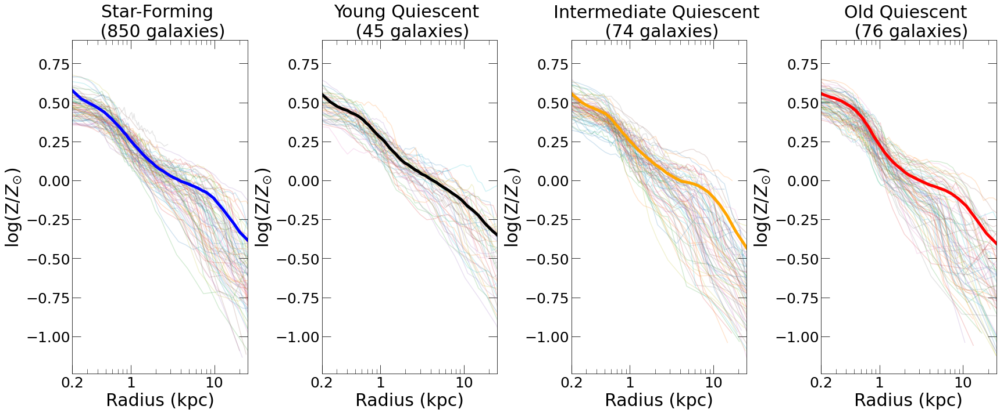

In [8]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
fts = 30
ftss = 25

#z=2 star-forming galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins)
    big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax1.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='blue', linewidth=5, label='median')

# fit line to star-forming galaxies
# def func(x, a, b, c):
#     return a*np.log10(x+b) + c
# popt, pcov = curve_fit(func, radial_percentiles[1:], statistic)
# label = str(popt[0]) + '*log(x+' + str(popt[1]) + ') + ' + str(popt[2])
# ax1.plot(np.array(radial_percentiles[1:]), np.log10(func(radial_percentiles[1:], *popt)), 'b--', linewidth=2, label=label)
# ax1.legend()

ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(-1.24, 0.9)
ax1.set_xlabel("Radius (kpc)", fontsize=fts)
ax1.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=fts)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB_selection]:
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins)
    big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax2.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='black', linewidth=5)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=fts) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(-1.24, 0.9)
ax2.set_xlabel("Radius (kpc)", fontsize=fts)
ax2.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=fts)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins)
    big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax3.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax3.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='orange', linewidth=5)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=fts) #
ax3.set_xlim(0.2, 25)
ax3.set_ylim(-1.24, 0.9)
ax3.set_xlabel("Radius (kpc)", fontsize=fts)
ax3.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=fts)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[old_quiescent_selection]:
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins)
    big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax4.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax4.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='red', linewidth=5)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=fts)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(-1.24, 0.9)
ax4.set_xlabel("Radius (kpc)", fontsize=fts)
ax4.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=fts)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

#plt.savefig('FIGURES\Zprofile.png', dpi=400)

### Figure 4

The metallicity profiles of young quiescent galaxies, with separate panels for galaxies with at least one significant merger that contributes at least $10\%$ of the $z=2$ stellar mass (with mergers: left panel) and those without such a merger (right panel).

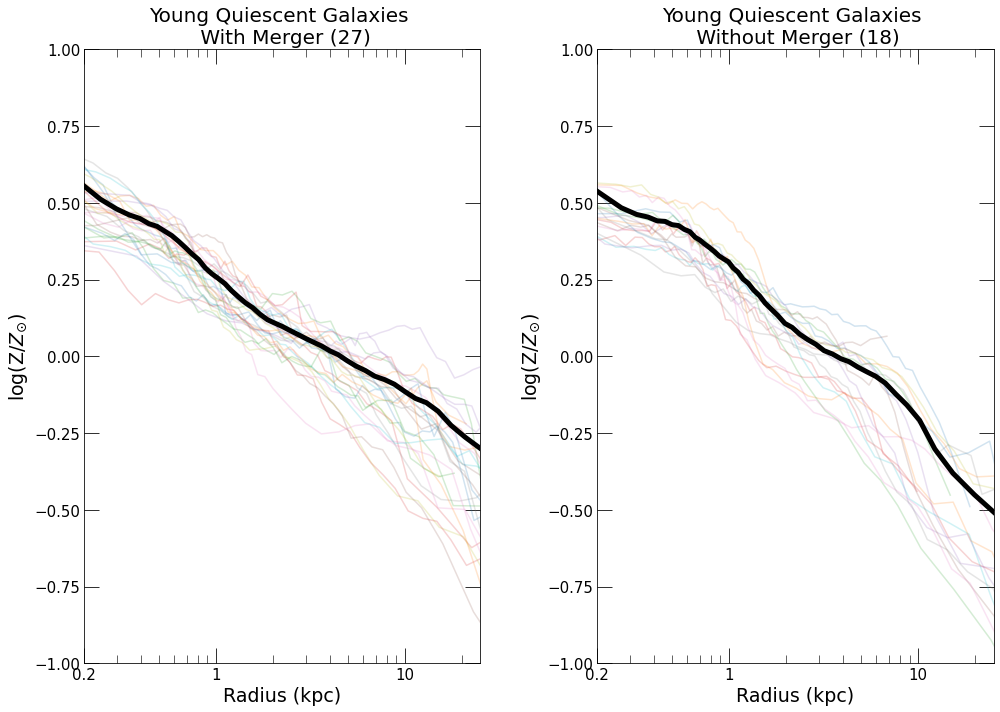

In [4]:
f, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(14, 10))
f.set_facecolor('w')
n_bins=50
redshift=2

#select young quiescent galaxies by merger cut-off
# had a significant prior merger 
PSB = (maximum_merger_ratio_30kpc_current_fraction>=0.1) & PSB_selection 
# had no significant prior merger
PSBm = (maximum_merger_ratio_30kpc_current_fraction<0.1) & PSB_selection 

#panel 1: young quiescent galaxies with mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB]:
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins)
    big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax1.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='black', linewidth=5)
ax1.set_title('Young Quiescent Galaxies \n With Merger ('+str(len(ids[PSB]))+')', fontsize=20)
ax1.set_xlim(0.2, 25)
ax1.set_ylim(-1.0, 1.0)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#panel 2: young quiescent galaxies without mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSBm]:
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins)
    big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax2.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='black', linewidth=5)
ax2.set_title('Young Quiescent Galaxies \n Without Merger ('+str(len(ids[PSBm]))+')', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(-1.0, 1.0)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

f.tight_layout(w_pad=4, h_pad=10)

# [Fe/H]

### Figure 3

Radial [Fe/H] profiles for the four galaxy populations (thin lines). For the star-forming population we only show 80 randomly drawn galaxies, for clarity. The running median for each population is shown in thick unbroken lines.

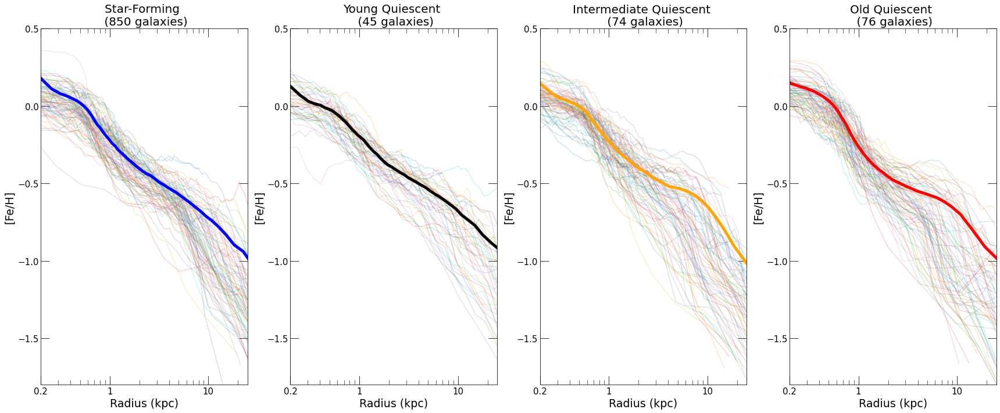

In [6]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2

#z=2 star-forming galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='blue', linewidth=5)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=20) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(-1.8, 0.5)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Fe/H]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(-1.8, 0.5)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Fe/H]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax3.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax3.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='orange', linewidth=5)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=20) #
ax3.set_xlim(0.2, 25)
ax3.set_ylim(-1.8, 0.5)
ax3.set_xlabel("Radius (kpc)", fontsize=19)
ax3.set_ylabel('[Fe/H]', fontsize=19)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax4.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax4.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='red', linewidth=5)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=20)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(-1.8, 0.5)
ax4.set_xlabel("Radius (kpc)", fontsize=19)
ax4.set_ylabel('[Fe/H]', fontsize=19)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

### Figure 4

The [Fe/H] profiles of young quiescent galaxies, with separate panels for galaxies with at least one significant merger that contributes at least $10\%$ of the $z=2$ stellar mass (with mergers: left panel) and those without such a merger (right panel).

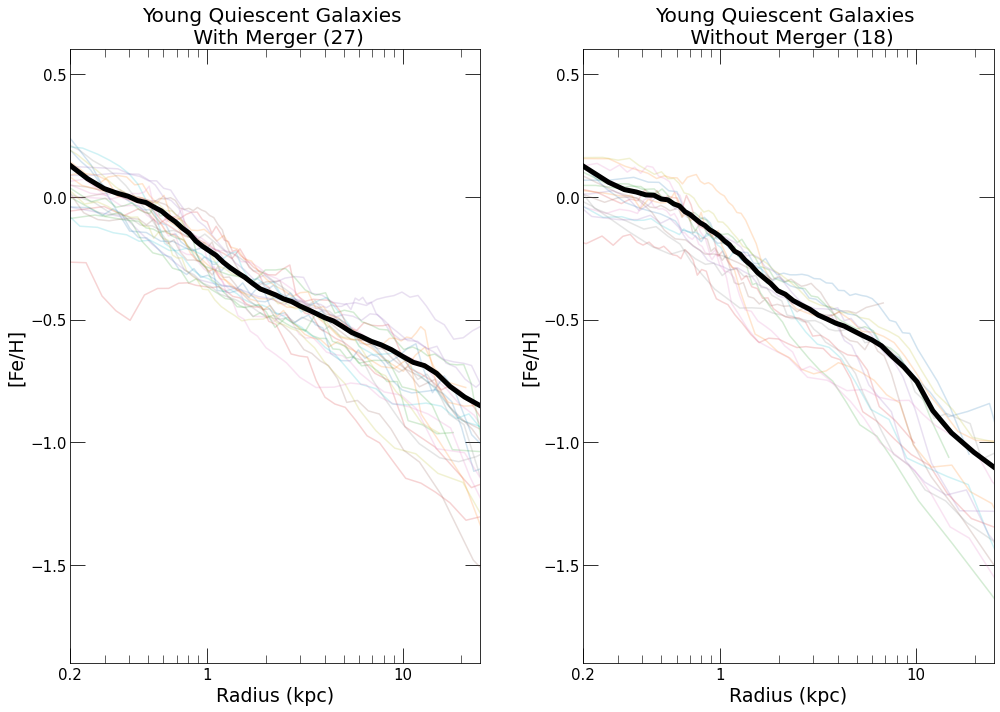

In [4]:
f, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(14, 10))
f.set_facecolor('w')
n_bins=50
redshift=2

#select young quiescent galaxies by merger cut-off
# had a significant prior merger 
PSB = (maximum_merger_ratio_30kpc_current_fraction>=0.1) & PSB_selection 
# had no significant prior merger
PSBm = (maximum_merger_ratio_30kpc_current_fraction<0.1) & PSB_selection 

#panel 1: young quiescent galaxies with mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax1.set_title('Young Quiescent Galaxies \n With Merger ('+str(len(ids[PSB]))+')', fontsize=20)
ax1.set_xlim(0.2, 25)
ax1.set_ylim(-1.9, 0.6)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Fe/H]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#panel 2: young quiescent galaxies without mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSBm]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent Galaxies \n Without Merger ('+str(len(ids[PSBm]))+')', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(-1.9, 0.6)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Fe/H]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

f.tight_layout(w_pad=4, h_pad=10)

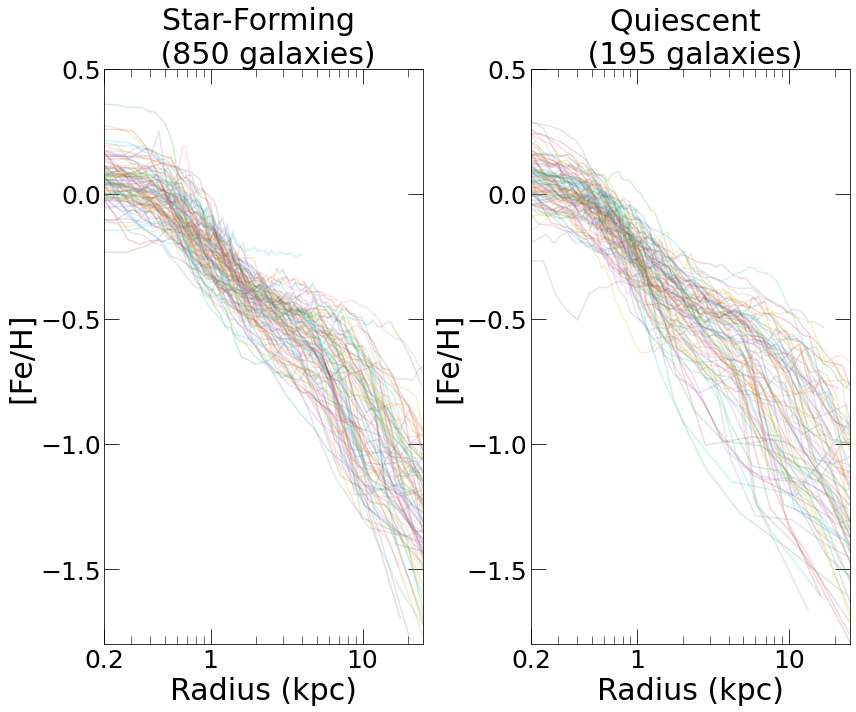

In [102]:
#metallicity profiles
f, (ax1, ax4) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(12, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
fts = 30
ftss = 25

#z=2 star-forming galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    yy, metallicity, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
# for i in range(1, (n_bins+1)):
#     radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
# statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
# ax1.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='blue', linewidth=5, label='median')

# fit line to star-forming galaxies
# def func(x, a, b, c):
#     return a*np.log10(x+b) + c
# popt, pcov = curve_fit(func, radial_percentiles[1:], statistic)
# label = str(popt[0]) + '*log(x+' + str(popt[1]) + ') + ' + str(popt[2])
# ax1.plot(np.array(radial_percentiles[1:]), np.log10(func(radial_percentiles[1:], *popt)), 'b--', linewidth=2, label=label)
# ax1.legend()

ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(-1.8, 0.5)
ax1.set_xlabel("Radius (kpc)", fontsize=fts)
ax1.set_ylabel('[Fe/H]', fontsize=fts)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[PSB_selection], 30, replace=False):
    yy, metallicity, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax4.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
# radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
# for i in range(1, (n_bins+1)):
#     radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
# statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
# ax2.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='black', linewidth=5)
# ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=fts) #
# ax2.set_xlim(0.2, 25)
# ax2.set_ylim(-1.24, 0.9)
# ax2.set_xlabel("Radius (kpc)", fontsize=fts)
# ax2.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=fts)
# ax2.set_xscale('log')
# ax2.tick_params(which='major', length=15)
# ax2.tick_params(which='minor', length=8)
# ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax2.set_xticks([0.2, 1, 10], minor=False)
# ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[intermediate_quiescent_selection], 30, replace=False):
    yy, metallicity, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax4.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
# radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
# for i in range(1, (n_bins+1)):
#     radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
# statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
# ax3.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='orange', linewidth=5)
# ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=fts) #
# ax3.set_xlim(0.2, 25)
# ax3.set_ylim(-1.24, 0.9)
# ax3.set_xlabel("Radius (kpc)", fontsize=fts)
# ax3.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=fts)
# ax3.set_xscale('log')
# ax3.tick_params(which='major', length=15)
# ax3.tick_params(which='minor', length=8)
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax3.set_xticks([0.2, 1, 10], minor=False)
# ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[old_quiescent_selection], 30, replace=False):
    yy, metallicity, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax4.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
# radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
# for i in range(1, (n_bins+1)):
#     radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
# statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
# ax4.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='red', linewidth=5)
ax4.set_title('Quiescent \n ('+str(len(ids[old_quiescent_selection])+len(ids[intermediate_quiescent_selection])+len(ids[PSB_selection]))+' galaxies)', fontsize=fts)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(-1.8, 0.5)
ax4.set_xlabel("Radius (kpc)", fontsize=fts)
ax4.set_ylabel('[Fe/H]', fontsize=fts)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

#plt.savefig('REU\profiles.png', dpi=400)

# [Mg/Fe]

### Figure 3

Radial [Mg/Fe] profiles for the four galaxy populations (thin lines). For the star-forming population we only show 80 randomly drawn galaxies, for clarity. The running median for each population is shown in thick unbroken lines.

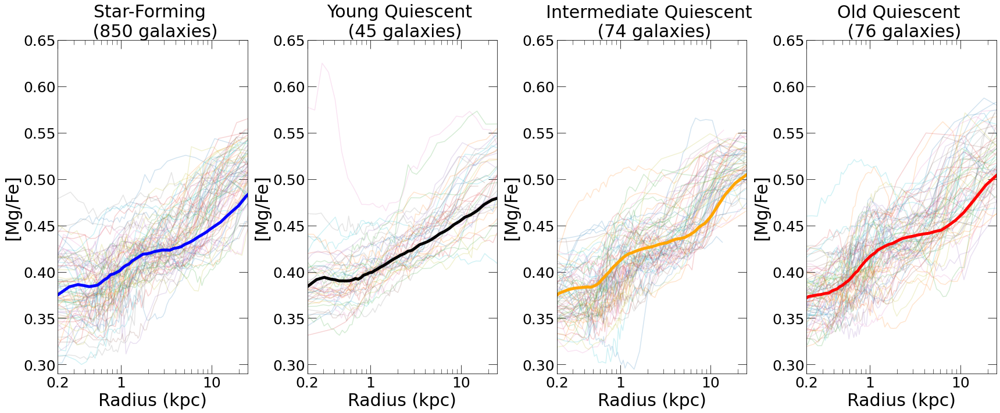

In [9]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
ymin = 0.29
ymax = 0.65
fts = 30
ftss = 25

#z=2 star-forming galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='blue', linewidth=5)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=fts)
ax1.set_ylabel('[Mg/Fe]', fontsize=fts)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=fts) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=fts)
ax2.set_ylabel('[Mg/Fe]', fontsize=fts)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax3.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax3.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='orange', linewidth=5)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=fts) #
ax3.set_xlim(0.2, 25)
ax3.set_ylim(ymin, ymax)
ax3.set_xlabel("Radius (kpc)", fontsize=fts)
ax3.set_ylabel('[Mg/Fe]', fontsize=fts)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax4.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax4.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='red', linewidth=5)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=fts)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(ymin, ymax)
ax4.set_xlabel("Radius (kpc)", fontsize=fts)
ax4.set_ylabel('[Mg/Fe]', fontsize=fts)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

plt.savefig('FIGURES/MgFeprofile.png', dpi=400)

### Figure 4

The [Mg/Fe] profiles of young quiescent galaxies, with separate panels for galaxies with at least one significant merger that contributes at least $10\%$ of the $z=2$ stellar mass (with mergers: left panel) and those without such a merger (right panel).

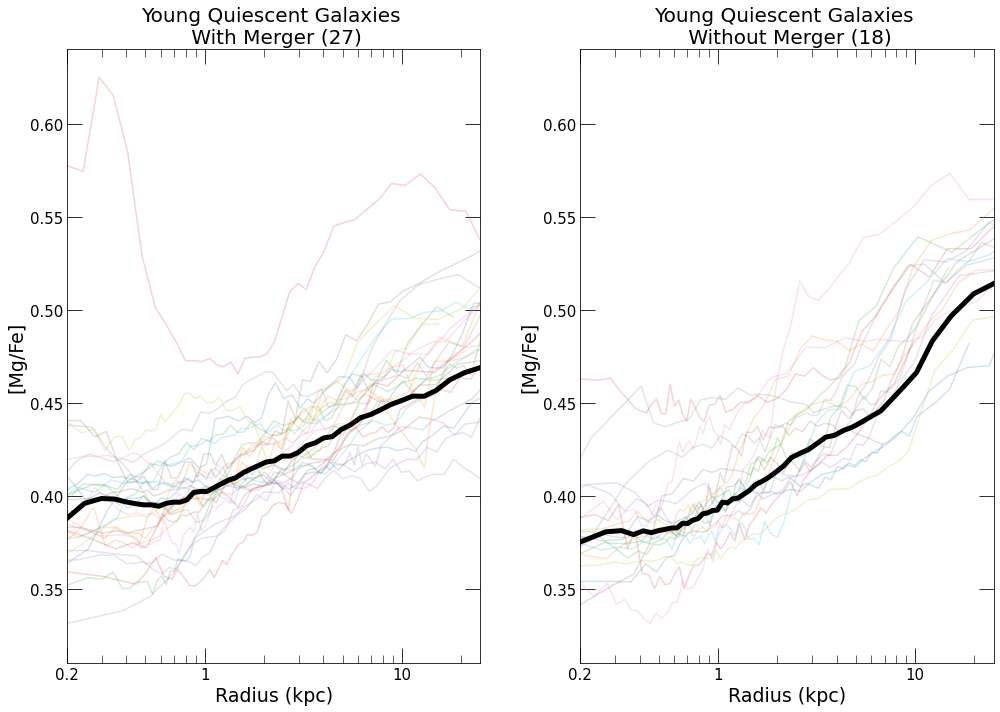

In [8]:
f, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(14, 10))
f.set_facecolor('w')
n_bins=50
redshift=2
ymin = 0.31
ymax = 0.64

#select young quiescent galaxies by merger cut-off
# had a significant prior merger 
PSB = (maximum_merger_ratio_30kpc_current_fraction>=0.1) & PSB_selection 
# had no significant prior merger
PSBm = (maximum_merger_ratio_30kpc_current_fraction<0.1) & PSB_selection 

#panel 1: young quiescent galaxies with mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax1.set_title('Young Quiescent Galaxies \n With Merger ('+str(len(ids[PSB]))+')', fontsize=20)
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Mg/Fe]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#panel 2: young quiescent galaxies without mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSBm]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent Galaxies \n Without Merger ('+str(len(ids[PSBm]))+')', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Mg/Fe]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

f.tight_layout(w_pad=4, h_pad=10)

# [Mg/H]

### Figure 3

Radial [Mg/H] profiles for the four galaxy populations (thin lines). For the star-forming population we only show 80 randomly drawn galaxies, for clarity. The running median for each population is shown in thick unbroken lines.

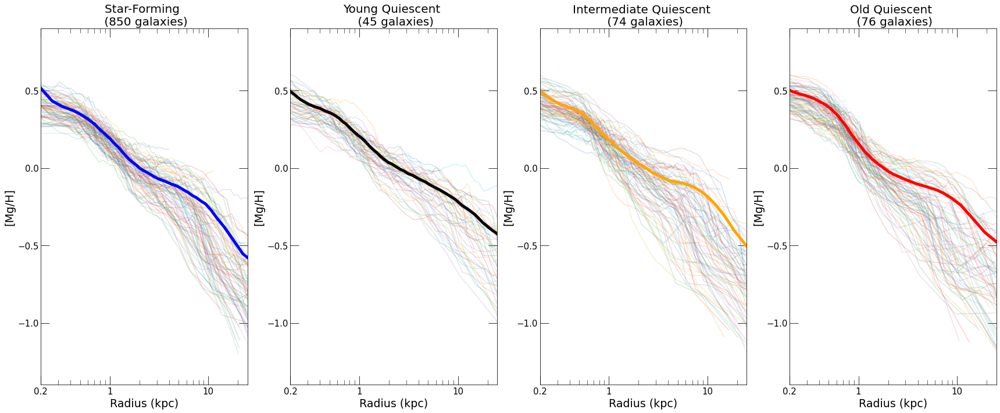

In [16]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
ymin = -1.4
ymax = 0.9

#z=2 star-forming galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='blue', linewidth=5)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=20) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Mg/H]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Mg/H]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax3.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax3.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='orange', linewidth=5)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=20) #
ax3.set_xlim(0.2, 25)
ax3.set_ylim(ymin, ymax)
ax3.set_xlabel("Radius (kpc)", fontsize=19)
ax3.set_ylabel('[Mg/H]', fontsize=19)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax4.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax4.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='red', linewidth=5)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=20)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(ymin, ymax)
ax4.set_xlabel("Radius (kpc)", fontsize=19)
ax4.set_ylabel('[Mg/H]', fontsize=19)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

### Figure 4

The [Mg/H] profiles of young quiescent galaxies, with separate panels for galaxies with at least one significant merger that contributes at least $10\%$ of the $z=2$ stellar mass (with mergers: left panel) and those without such a merger (right panel).

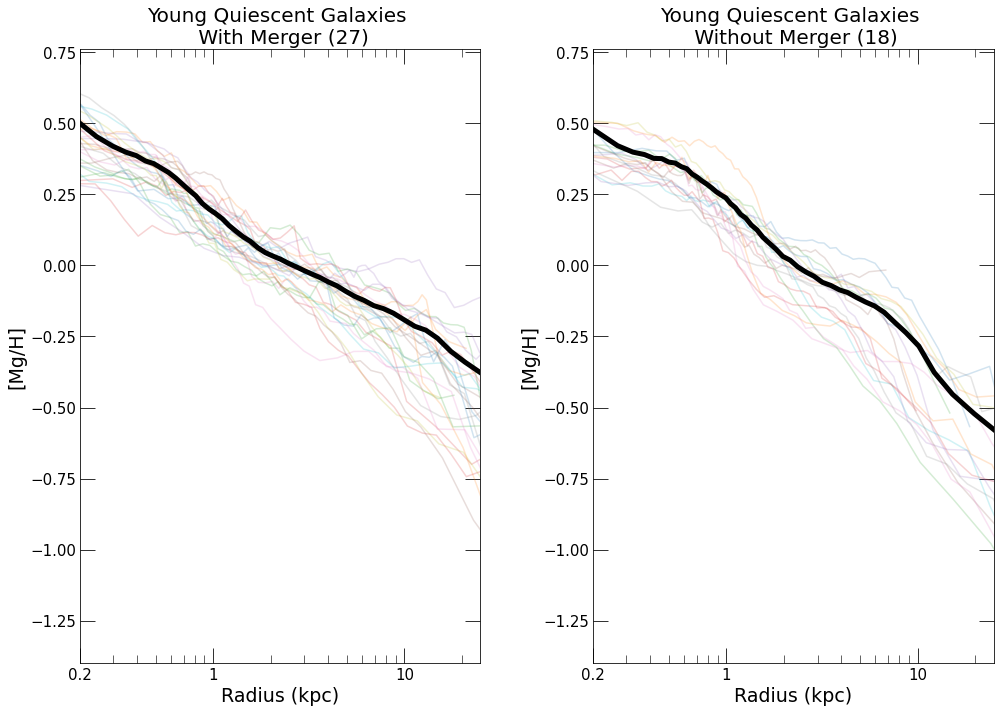

In [17]:
f, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(14, 10))
f.set_facecolor('w')
n_bins=50
redshift=2
ymin = -1.4
ymax = 0.76

#select young quiescent galaxies by merger cut-off
# had a significant prior merger 
PSB = (maximum_merger_ratio_30kpc_current_fraction>=0.1) & PSB_selection 
# had no significant prior merger
PSBm = (maximum_merger_ratio_30kpc_current_fraction<0.1) & PSB_selection 

#panel 1: young quiescent galaxies with mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax1.set_title('Young Quiescent Galaxies \n With Merger ('+str(len(ids[PSB]))+')', fontsize=20)
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Mg/H]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#panel 2: young quiescent galaxies without mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSBm]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent Galaxies \n Without Merger ('+str(len(ids[PSBm]))+')', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Mg/H]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

f.tight_layout(w_pad=4, h_pad=10)

# [O/Fe]

### Figure 3

Radial [O/Fe] profiles for the four galaxy populations (thin lines). For the star-forming population we only show 80 randomly drawn galaxies, for clarity. The running median for each population is shown in thick unbroken lines.

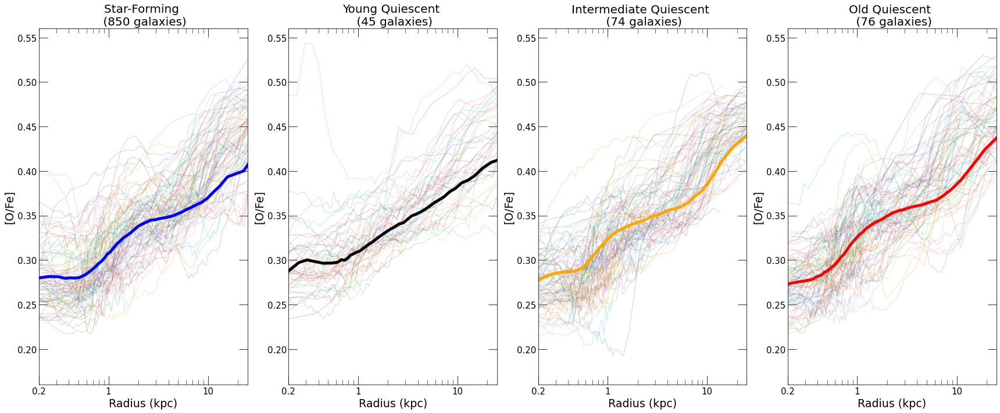

In [4]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
ymin = 0.16
ymax = 0.56

#z=2 star-forming galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='oxygen', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='blue', linewidth=5)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=20) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[O/Fe]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='oxygen', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[O/Fe]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='oxygen', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax3.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax3.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='orange', linewidth=5)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=20) #
ax3.set_xlim(0.2, 25)
ax3.set_ylim(ymin, ymax)
ax3.set_xlabel("Radius (kpc)", fontsize=19)
ax3.set_ylabel('[O/Fe]', fontsize=19)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='oxygen', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax4.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax4.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='red', linewidth=5)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=20)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(ymin, ymax)
ax4.set_xlabel("Radius (kpc)", fontsize=19)
ax4.set_ylabel('[O/Fe]', fontsize=19)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

### Figure 4

The [O/Fe] profiles of young quiescent galaxies, with separate panels for galaxies with at least one significant merger that contributes at least $10\%$ of the $z=2$ stellar mass (with mergers: left panel) and those without such a merger (right panel).

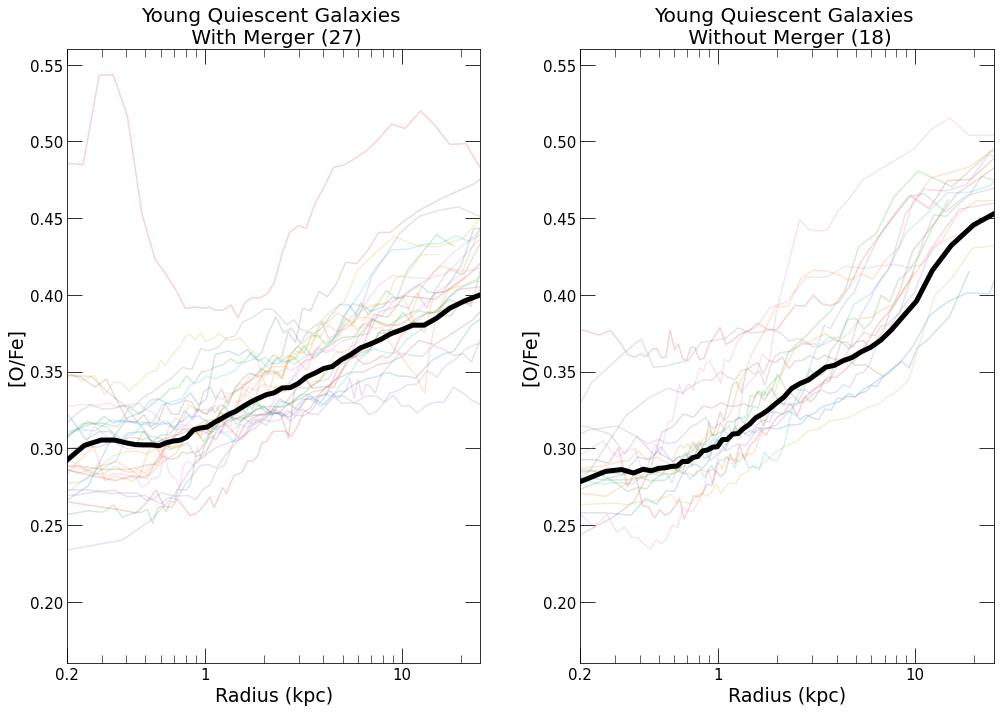

In [5]:
f, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(14, 10))
f.set_facecolor('w')
n_bins=50
redshift=2
ymin = 0.16
ymax = 0.56

#select young quiescent galaxies by merger cut-off
# had a significant prior merger 
PSB = (maximum_merger_ratio_30kpc_current_fraction>=0.1) & PSB_selection 
# had no significant prior merger
PSBm = (maximum_merger_ratio_30kpc_current_fraction<0.1) & PSB_selection 

#panel 1: young quiescent galaxies with mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='oxygen', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax1.set_title('Young Quiescent Galaxies \n With Merger ('+str(len(ids[PSB]))+')', fontsize=20)
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[O/Fe]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#panel 2: young quiescent galaxies without mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSBm]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='oxygen', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent Galaxies \n Without Merger ('+str(len(ids[PSBm]))+')', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[O/Fe]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

f.tight_layout(w_pad=4, h_pad=10)

# [Si/O]

### Figure 3

Radial [Si/O] profiles for the four galaxy populations (thin lines). For the star-forming population we only show 80 randomly drawn galaxies, for clarity. The running median for each population is shown in thick unbroken lines.

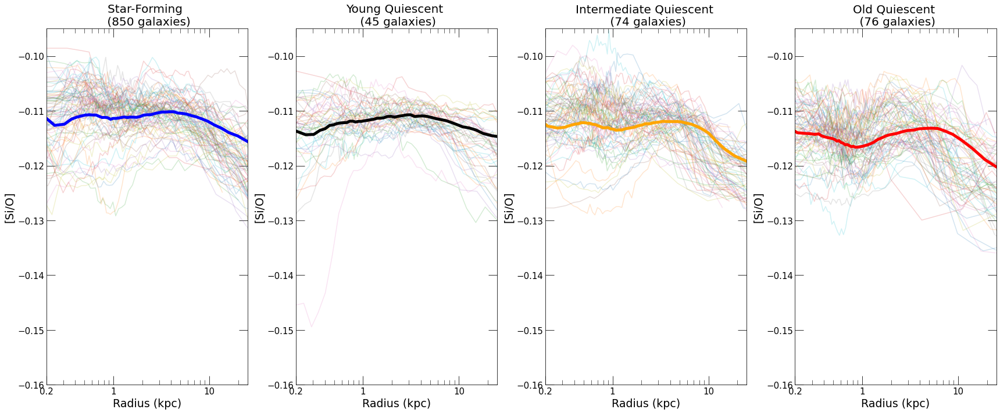

In [8]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
ymin = -0.16
ymax = -0.095

#z=2 star-forming galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='silicon', den='oxygen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='blue', linewidth=5)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=20) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Si/O]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='silicon', den='oxygen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Si/O]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='silicon', den='oxygen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax3.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax3.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='orange', linewidth=5)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=20) #
ax3.set_xlim(0.2, 25)
ax3.set_ylim(ymin, ymax)
ax3.set_xlabel("Radius (kpc)", fontsize=19)
ax3.set_ylabel('[Si/O]', fontsize=19)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='silicon', den='oxygen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax4.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax4.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='red', linewidth=5)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=20)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(ymin, ymax)
ax4.set_xlabel("Radius (kpc)", fontsize=19)
ax4.set_ylabel('[Si/O]', fontsize=19)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

### Figure 4

The [Si/O] profiles of young quiescent galaxies, with separate panels for galaxies with at least one significant merger that contributes at least $10\%$ of the $z=2$ stellar mass (with mergers: left panel) and those without such a merger (right panel).

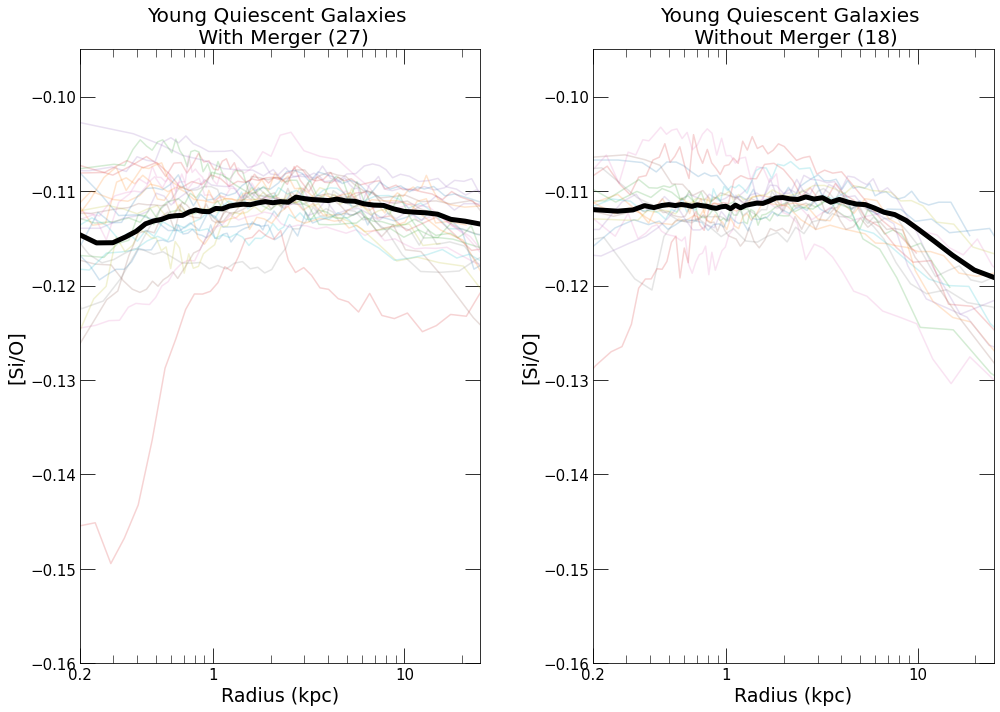

In [9]:
f, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(14, 10))
f.set_facecolor('w')
n_bins=50
redshift=2
ymin = -0.16
ymax = -0.095

#select young quiescent galaxies by merger cut-off
# had a significant prior merger 
PSB = (maximum_merger_ratio_30kpc_current_fraction>=0.1) & PSB_selection 
# had no significant prior merger
PSBm = (maximum_merger_ratio_30kpc_current_fraction<0.1) & PSB_selection 

#panel 1: young quiescent galaxies with mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='silicon', den='oxygen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax1.set_title('Young Quiescent Galaxies \n With Merger ('+str(len(ids[PSB]))+')', fontsize=20)
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Si/O]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#panel 2: young quiescent galaxies without mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSBm]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='silicon', den='oxygen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent Galaxies \n Without Merger ('+str(len(ids[PSBm]))+')', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Si/O]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

f.tight_layout(w_pad=4, h_pad=10)

# [Z] (luminosity-weighted)

### Figure 3

Radial metallicity profiles for the four galaxy populations (thin lines). For the star-forming population we only show 80 randomly drawn galaxies, for clarity. The running median for each population is shown in thick unbroken lines.

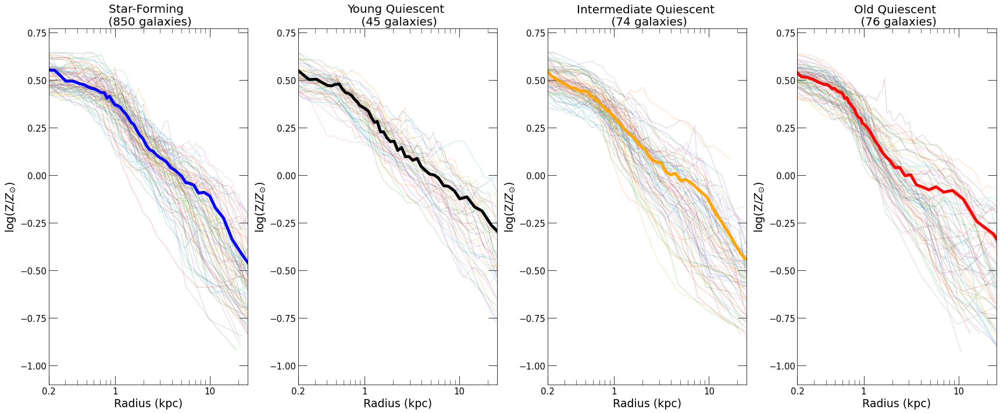

In [5]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
ymin = -1.1
ymax = 0.77

#z=2 star-forming galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins, profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax1.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='blue', linewidth=5)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=20) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB_selection]:
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins, profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax2.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='black', linewidth=5)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins, profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax3.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax3.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='orange', linewidth=5)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=20) #
ax3.set_xlim(0.2, 25)
ax3.set_ylim(ymin, ymax)
ax3.set_xlabel("Radius (kpc)", fontsize=19)
ax3.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=19)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[old_quiescent_selection]:
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins, profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax4.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax4.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='red', linewidth=5)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=20)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(ymin, ymax)
ax4.set_xlabel("Radius (kpc)", fontsize=19)
ax4.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=19)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

### Figure 4

The metallicity profiles of young quiescent galaxies, with separate panels for galaxies with at least one significant merger that contributes at least $10\%$ of the $z=2$ stellar mass (with mergers: left panel) and those without such a merger (right panel).

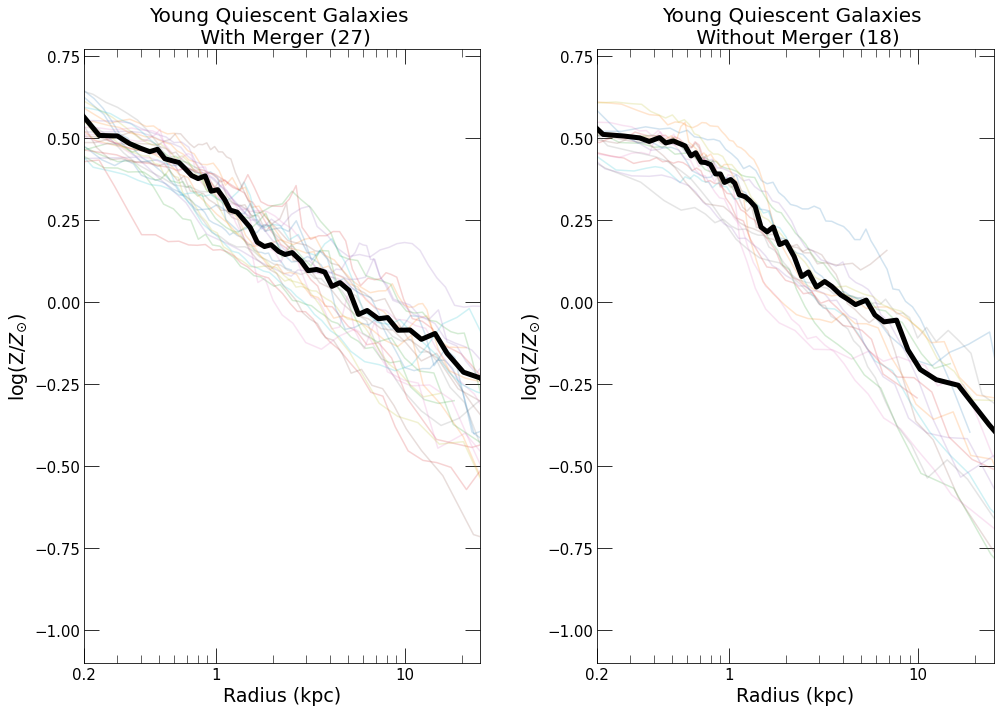

In [6]:
f, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(14, 10))
f.set_facecolor('w')
n_bins=50
redshift=2
ymin = -1.1
ymax = 0.77

#select young quiescent galaxies by merger cut-off
# had a significant prior merger 
PSB = (maximum_merger_ratio_30kpc_current_fraction>=0.1) & PSB_selection 
# had no significant prior merger
PSBm = (maximum_merger_ratio_30kpc_current_fraction<0.1) & PSB_selection 

#panel 1: young quiescent galaxies with mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB]:
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins, profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax1.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='black', linewidth=5)
ax1.set_title('Young Quiescent Galaxies \n With Merger ('+str(len(ids[PSB]))+')', fontsize=20)
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#panel 2: young quiescent galaxies without mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSBm]:
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins, profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax2.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='black', linewidth=5)
ax2.set_title('Young Quiescent Galaxies \n Without Merger ('+str(len(ids[PSBm]))+')', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

f.tight_layout(w_pad=4, h_pad=10)

# [Mg/Fe] (luminosity-weighted)

### Figure 3

Radial [Mg/Fe] profiles for the four galaxy populations (thin lines). For the star-forming population we only show 80 randomly drawn galaxies, for clarity. The running median for each population is shown in thick unbroken lines.

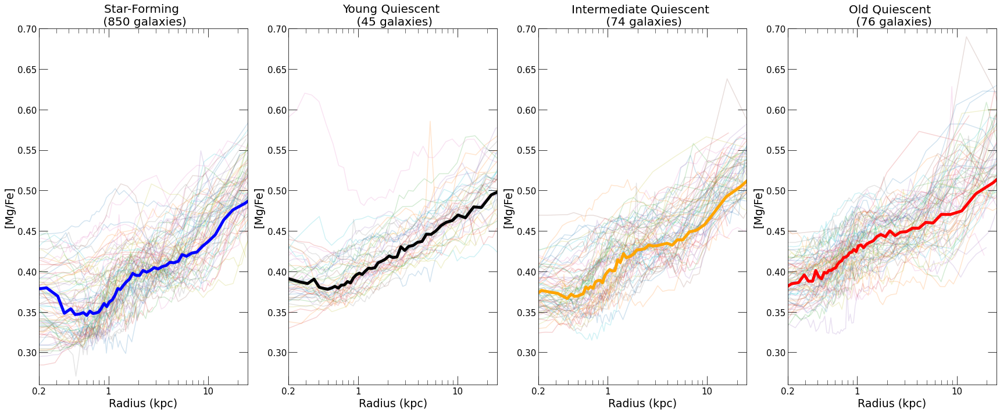

In [7]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
ymin = 0.26
ymax = 0.7

#z=2 star-forming galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='blue', linewidth=5)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=20) 
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Mg/Fe]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Mg/Fe]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax3.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax3.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='orange', linewidth=5)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=20) #
ax3.set_xlim(0.2, 25)
ax3.set_ylim(ymin, ymax)
ax3.set_xlabel("Radius (kpc)", fontsize=19)
ax3.set_ylabel('[Mg/Fe]', fontsize=19)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax4.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax4.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='red', linewidth=5)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=20)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(ymin, ymax)
ax4.set_xlabel("Radius (kpc)", fontsize=19)
ax4.set_ylabel('[Mg/Fe]', fontsize=19)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

### Figure 4

The [Mg/Fe] profiles of young quiescent galaxies, with separate panels for galaxies with at least one significant merger that contributes at least $10\%$ of the $z=2$ stellar mass (with mergers: left panel) and those without such a merger (right panel).

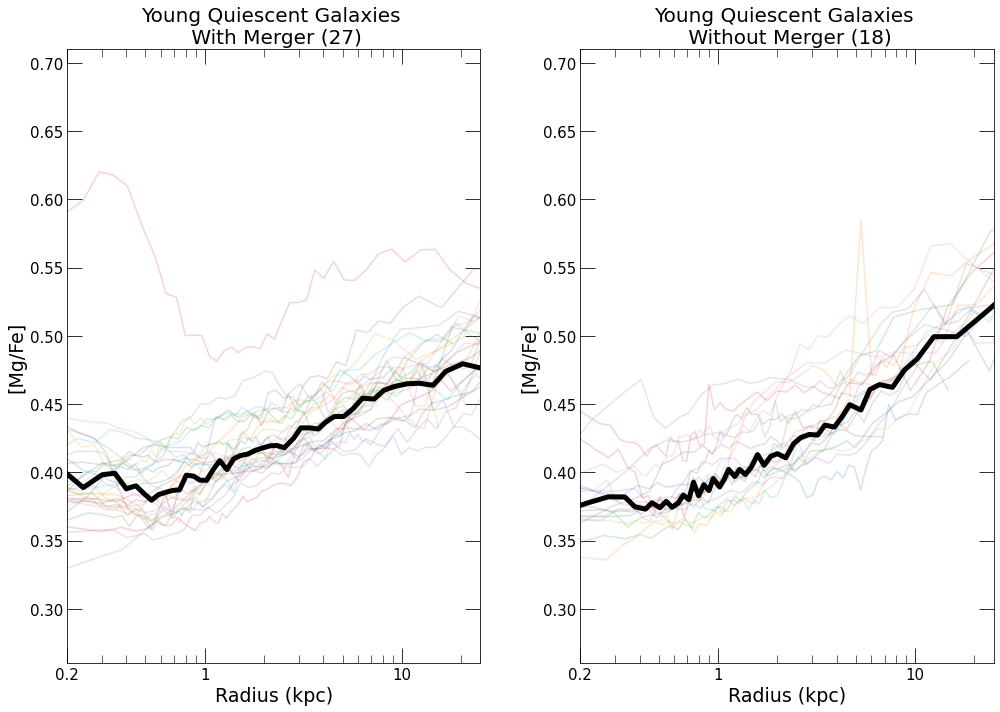

In [8]:
f, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(14, 10))
f.set_facecolor('w')
n_bins=50
redshift=2
ymin = 0.26
ymax = 0.71

#select young quiescent galaxies by merger cut-off
# had a significant prior merger 
PSB = (maximum_merger_ratio_30kpc_current_fraction>=0.1) & PSB_selection 
# had no significant prior merger
PSBm = (maximum_merger_ratio_30kpc_current_fraction<0.1) & PSB_selection 

#panel 1: young quiescent galaxies with mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax1.set_title('Young Quiescent Galaxies \n With Merger ('+str(len(ids[PSB]))+')', fontsize=20)
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Mg/Fe]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#panel 2: young quiescent galaxies without mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSBm]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent Galaxies \n Without Merger ('+str(len(ids[PSBm]))+')', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Mg/Fe]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

f.tight_layout(w_pad=4, h_pad=10)

# [Fe/H] (luminosity-weighted)

### Figure 3

Radial [Fe/H] profiles for the four galaxy populations (thin lines). For the star-forming population we only show 80 randomly drawn galaxies, for clarity. The running median for each population is shown in thick unbroken lines.

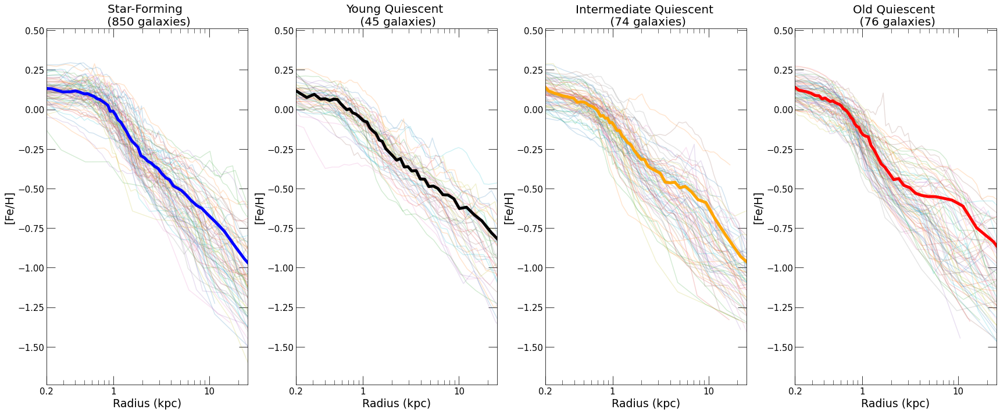

In [11]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
ymin = -1.74
ymax = 0.51

#z=2 star-forming galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='blue', linewidth=5)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=20) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Fe/H]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Fe/H]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax3.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax3.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='orange', linewidth=5)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=20) #
ax3.set_xlim(0.2, 25)
ax3.set_ylim(ymin, ymax)
ax3.set_xlabel("Radius (kpc)", fontsize=19)
ax3.set_ylabel('[Fe/H]', fontsize=19)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax4.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax4.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='red', linewidth=5)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=20)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(ymin, ymax)
ax4.set_xlabel("Radius (kpc)", fontsize=19)
ax4.set_ylabel('[Fe/H]', fontsize=19)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

### Figure 4

The [Fe/H] profiles of young quiescent galaxies, with separate panels for galaxies with at least one significant merger that contributes at least $10\%$ of the $z=2$ stellar mass (with mergers: left panel) and those without such a merger (right panel).

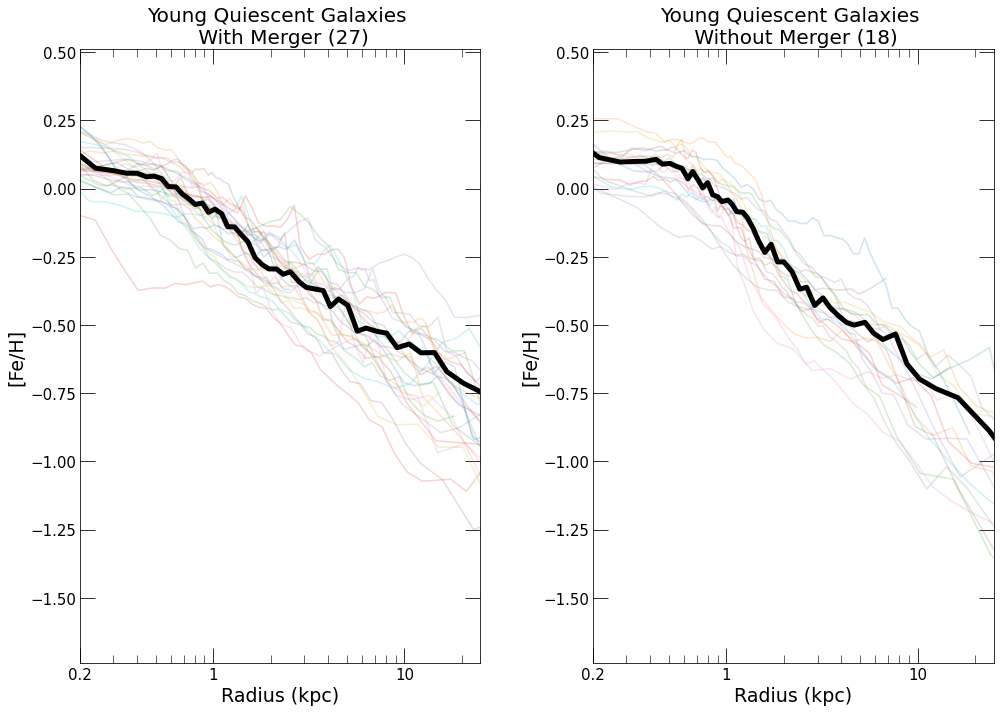

In [10]:
f, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(14, 10))
f.set_facecolor('w')
n_bins=50
redshift=2
ymin = -1.74
ymax = 0.51

#select young quiescent galaxies by merger cut-off
# had a significant prior merger 
PSB = (maximum_merger_ratio_30kpc_current_fraction>=0.1) & PSB_selection 
# had no significant prior merger
PSBm = (maximum_merger_ratio_30kpc_current_fraction<0.1) & PSB_selection 

#panel 1: young quiescent galaxies with mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax1.set_title('Young Quiescent Galaxies \n With Merger ('+str(len(ids[PSB]))+')', fontsize=20)
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Fe/H]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#panel 2: young quiescent galaxies without mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSBm]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent Galaxies \n Without Merger ('+str(len(ids[PSBm]))+')', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Fe/H]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

f.tight_layout(w_pad=4, h_pad=10)

# [Mg/H]

### Figure 3

Radial [Mg/H] profiles for the four galaxy populations (thin lines). For the star-forming population we only show 80 randomly drawn galaxies, for clarity. The running median for each population is shown in thick unbroken lines.

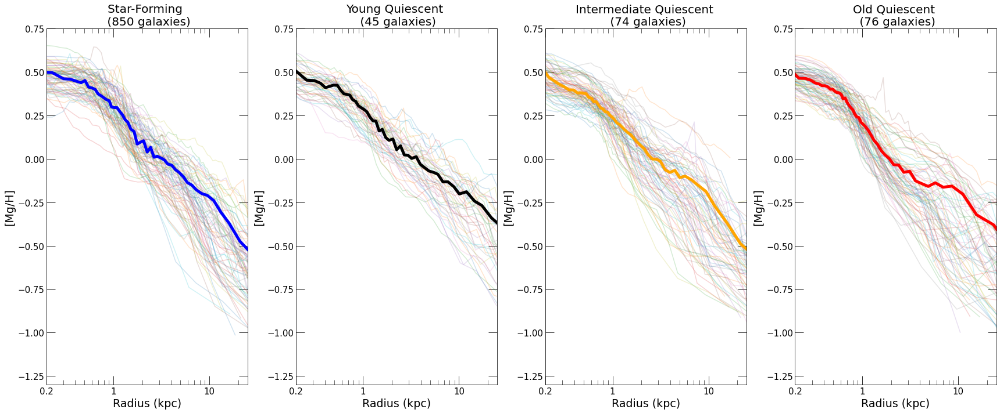

In [15]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
ymin = -1.3
ymax = 0.75

#z=2 star-forming galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='blue', linewidth=5)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=20) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Mg/H]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Mg/H]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax3.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax3.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='orange', linewidth=5)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=20) #
ax3.set_xlim(0.2, 25)
ax3.set_ylim(ymin, ymax)
ax3.set_xlabel("Radius (kpc)", fontsize=19)
ax3.set_ylabel('[Mg/H]', fontsize=19)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax4.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax4.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='red', linewidth=5)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=20)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(ymin, ymax)
ax4.set_xlabel("Radius (kpc)", fontsize=19)
ax4.set_ylabel('[Mg/H]', fontsize=19)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

### Figure 4

The [Mg/H] profiles of young quiescent galaxies, with separate panels for galaxies with at least one significant merger that contributes at least $10\%$ of the $z=2$ stellar mass (with mergers: left panel) and those without such a merger (right panel).

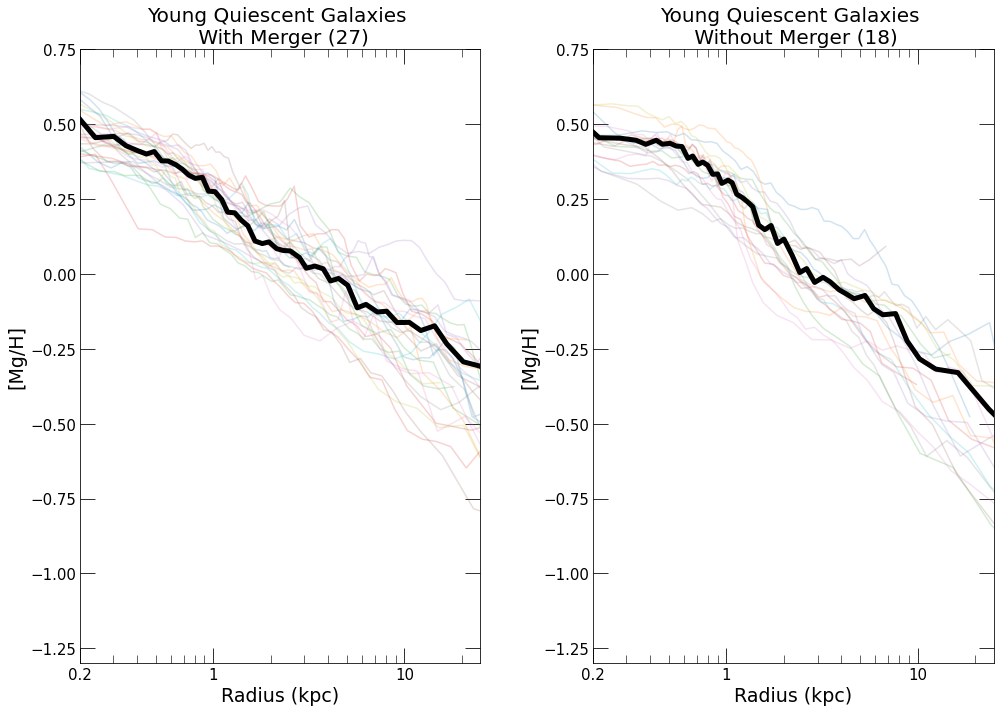

In [16]:
f, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(14, 10))
f.set_facecolor('w')
n_bins=50
redshift=2
ymin = -1.3
ymax = 0.75

#select young quiescent galaxies by merger cut-off
# had a significant prior merger 
PSB = (maximum_merger_ratio_30kpc_current_fraction>=0.1) & PSB_selection 
# had no significant prior merger
PSBm = (maximum_merger_ratio_30kpc_current_fraction<0.1) & PSB_selection 

#panel 1: young quiescent galaxies with mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax1.set_title('Young Quiescent Galaxies \n With Merger ('+str(len(ids[PSB]))+')', fontsize=20)
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Mg/H]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#panel 2: young quiescent galaxies without mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSBm]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent Galaxies \n Without Merger ('+str(len(ids[PSBm]))+')', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Mg/H]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

f.tight_layout(w_pad=4, h_pad=10)

# [Fe/H] (R/R$_e$)

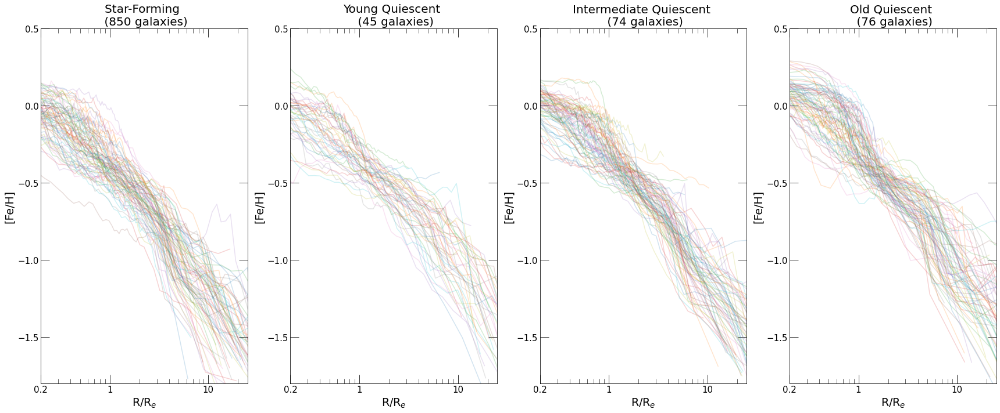

In [4]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2

#z=2 star-forming galaxies
# distance = np.zeros(0)
# big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance_norm')
#     big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
#     distance = np.concatenate((distance, R), axis = None)
# radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
# for i in range(1, (n_bins+1)):
#     radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
# statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
# ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='blue', linewidth=5)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=20) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(-1.8, 0.5)
ax1.set_xlabel("R/R$_e$", fontsize=19)
ax1.set_ylabel('[Fe/H]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
# distance = np.zeros(0)
# big_metallicity = np.zeros(0)
for id in ids[PSB_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance_norm')
#     big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
#     distance = np.concatenate((distance, R), axis = None)
# radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
# for i in range(1, (n_bins+1)):
#     radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
# statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
# ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(-1.8, 0.5)
ax2.set_xlabel("R/R$_e$", fontsize=19)
ax2.set_ylabel('[Fe/H]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
# distance = np.zeros(0)
# big_metallicity = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance_norm')
#     big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax3.plot(xx, yy, alpha = 0.2)
#     distance = np.concatenate((distance, R), axis = None)
# radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
# for i in range(1, (n_bins+1)):
#     radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
# statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
# ax3.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='orange', linewidth=5)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=20) #
ax3.set_xlim(0.2, 25)
ax3.set_ylim(-1.8, 0.5)
ax3.set_xlabel("R/R$_e$", fontsize=19)
ax3.set_ylabel('[Fe/H]', fontsize=19)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
# distance = np.zeros(0)
# big_metallicity = np.zeros(0)
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', axis='distance_norm')
#     big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax4.plot(xx, yy, alpha = 0.2)
#     distance = np.concatenate((distance, R), axis = None)
# radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
# for i in range(1, (n_bins+1)):
#     radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
# statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
# ax4.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='red', linewidth=5)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=20)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(-1.8, 0.5)
ax4.set_xlabel("R/R$_e$", fontsize=19)
ax4.set_ylabel('[Fe/H]', fontsize=19)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

# [Fe/H] (gas)

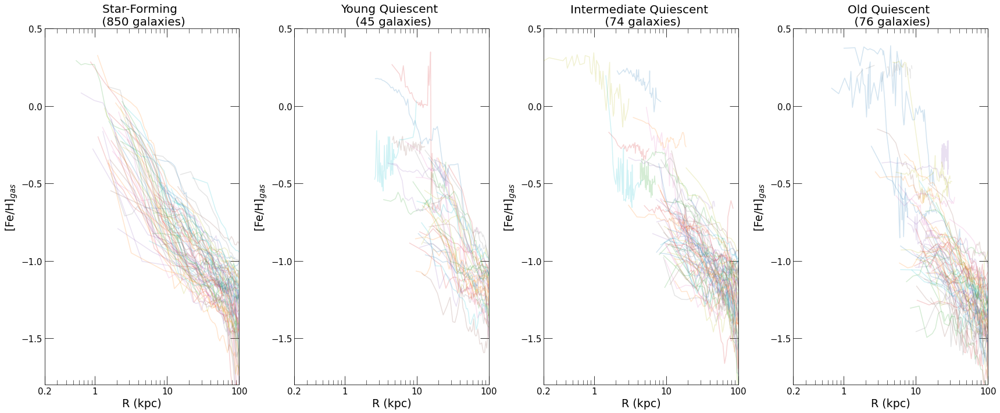

In [8]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2

#z=2 star-forming galaxies
# distance = np.zeros(0)
# big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R = gasmetals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
#     big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    if len(yy) == 1:
        pass
    else:
        ax1.plot(xx[1:-2], yy[1:-2], alpha = 0.2)
#     distance = np.concatenate((distance, R), axis = None)
# radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
# for i in range(1, (n_bins+1)):
#     radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
# statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
# ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='blue', linewidth=5)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=20) #
ax1.set_xlim(0.2, 100)
ax1.set_ylim(-1.8, 0.5)
ax1.set_xlabel("R (kpc)", fontsize=19)
ax1.set_ylabel('[Fe/H]$_{gas}$', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10, 100], minor=False)
ax1.set_xticklabels(['0.2', '1', '10', '100'])

#z=2 young quiescent galaxies
# distance = np.zeros(0)
# big_metallicity = np.zeros(0)
for id in ids[PSB_selection]:
    yy, logFeH, xx, R = gasmetals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
#     big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    if len(yy) == 1:
        pass
    else:
        ax2.plot(xx[1:-2], yy[1:-2], alpha = 0.2)
#     distance = np.concatenate((distance, R), axis = None)
# radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
# for i in range(1, (n_bins+1)):
#     radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
# statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
# ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=20) #
ax2.set_xlim(0.2, 100)
ax2.set_ylim(-1.8, 0.5)
ax2.set_xlabel("R (kpc)", fontsize=19)
ax2.set_ylabel('[Fe/H]$_{gas}$', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10, 100], minor=False)
ax2.set_xticklabels(['0.2', '1', '10', '100'])

#z=2 intermediate quiescent galaxies
# distance = np.zeros(0)
# big_metallicity = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    yy, logFeH, xx, R = gasmetals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
#     big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    if len(yy) == 1:
        pass
    else:
        ax3.plot(xx[1:-2], yy[1:-2], alpha = 0.2)
#     distance = np.concatenate((distance, R), axis = None)
# radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
# for i in range(1, (n_bins+1)):
#     radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
# statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
# ax3.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='orange', linewidth=5)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=20) #
ax3.set_xlim(0.2, 100)
ax3.set_ylim(-1.8, 0.5)
ax3.set_xlabel("R (kpc)", fontsize=19)
ax3.set_ylabel('[Fe/H]$_{gas}$', fontsize=19)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10, 100], minor=False)
ax3.set_xticklabels(['0.2', '1', '10', '100'])

#z=2 old quiescent galaxies
# distance = np.zeros(0)
# big_metallicity = np.zeros(0)
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R = gasmetals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
#     big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    if len(yy) == 1:
        pass
    else:
        ax4.plot(xx[1:-2], yy[1:-2], alpha = 0.2)
#     distance = np.concatenate((distance, R), axis = None)
# radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
# for i in range(1, (n_bins+1)):
#     radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
# statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
# ax4.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='red', linewidth=5)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=20)
ax4.set_xlim(0.2, 100)
ax4.set_ylim(-1.8, 0.5)
ax4.set_xlabel("R (kpc)", fontsize=19)
ax4.set_ylabel('[Fe/H]$_{gas}$', fontsize=19)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10, 100], minor=False)
ax4.set_xticklabels(['0.2', '1', '10', '100'])

f.tight_layout()

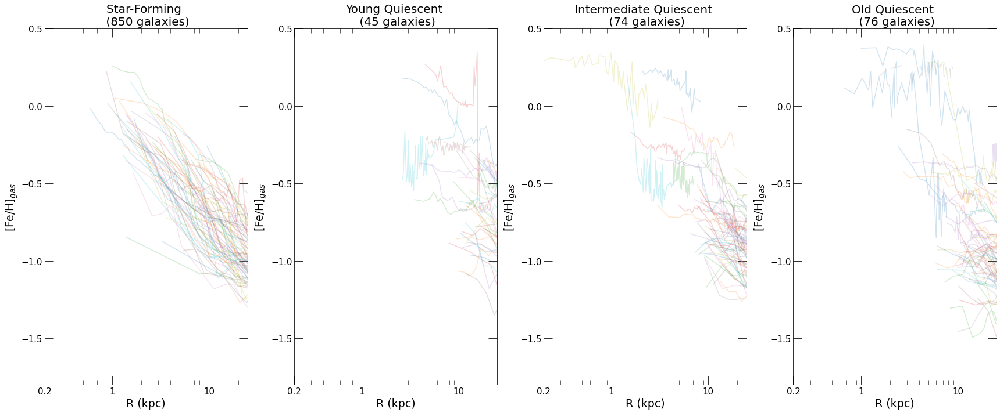

In [9]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2

#z=2 star-forming galaxies
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R = gasmetals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    if len(yy) == 1:
        pass
    else:
        ax1.plot(xx[1:-2], yy[1:-2], alpha = 0.2)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=20) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(-1.8, 0.5)
ax1.set_xlabel("R (kpc)", fontsize=19)
ax1.set_ylabel('[Fe/H]$_{gas}$', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
for id in ids[PSB_selection]:
    yy, logFeH, xx, R = gasmetals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    if len(yy) == 1:
        pass
    else:
        ax2.plot(xx[1:-2], yy[1:-2], alpha = 0.2)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(-1.8, 0.5)
ax2.set_xlabel("R (kpc)", fontsize=19)
ax2.set_ylabel('[Fe/H]$_{gas}$', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
for id in ids[intermediate_quiescent_selection]:
    yy, logFeH, xx, R = gasmetals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    if len(yy) == 1:
        pass
    else:
        ax3.plot(xx[1:-2], yy[1:-2], alpha = 0.2)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=20) #
ax3.set_xlim(0.2, 25)
ax3.set_ylim(-1.8, 0.5)
ax3.set_xlabel("R (kpc)", fontsize=19)
ax3.set_ylabel('[Fe/H]$_{gas}$', fontsize=19)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R = gasmetals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    if len(yy) == 1:
        pass
    else:
        ax4.plot(xx[1:-2], yy[1:-2], alpha = 0.2)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=20)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(-1.8, 0.5)
ax4.set_xlabel("R (kpc)", fontsize=19)
ax4.set_ylabel('[Fe/H]$_{gas}$', fontsize=19)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

# [Fe/H] vs. density

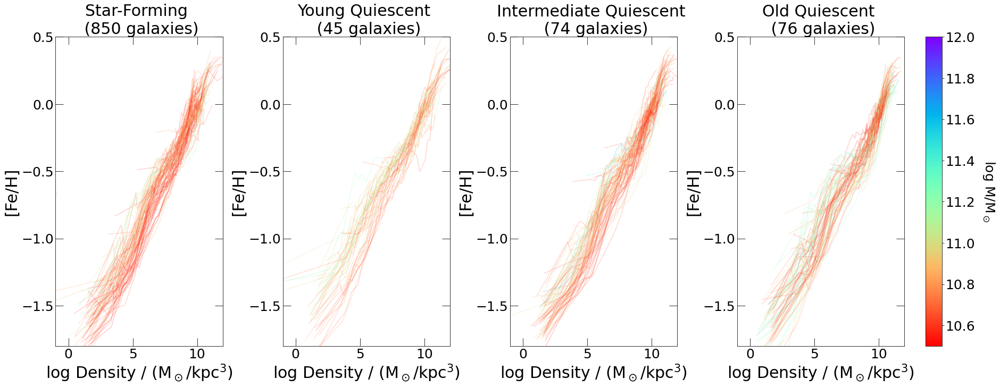

In [7]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(26, 10), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]
ax3 = axes[2]
ax4 = axes[3]
f.set_facecolor('w')
n_bins = 50
redshift = 2
fts = 30
ftss = 25

colormap = plt.get_cmap('rainbow_r')
norm = colors.Normalize(vmin=10.5, vmax=12.0)

#z=2 star-forming galaxies
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    mass = total_mass[ids==id]
    color = colormap(norm(mass)).tolist()
    color = tuple(color[0][:])
    ax1.plot(np.log10(xx), yy, color=color, alpha = 0.2)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_xlim(-1, 12)
ax1.set_ylim(-1.8, 0.5)
ax1.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_ylabel('[Fe/H]', fontsize=fts)
# ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax1.set_xticks([0.2, 1, 10], minor=False)
# ax1.set_xticklabels(['0.2', '1', '10'])

# #z=2 young quiescent galaxies
for id in ids[PSB_selection]:
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    mass = total_mass[ids==id]
    color = colormap(norm(mass)).tolist()
    color = tuple(color[0][:])
    ax2.plot(np.log10(xx), yy, color=color, alpha = 0.2)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=fts) #
ax2.set_xlim(-1, 12)
ax2.set_ylim(-1.8, 0.5)
ax2.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax2.set_ylabel('[Fe/H]', fontsize=fts)
# ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax2.set_xticks([0.2, 1, 10], minor=False)
# ax2.set_xticklabels(['0.2', '1', '10'])

# #z=2 intermediate quiescent galaxies
for id in ids[intermediate_quiescent_selection]:
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    mass = total_mass[ids==id]
    color = colormap(norm(mass)).tolist()
    color = tuple(color[0][:])
    ax3.plot(np.log10(xx), yy, color=color, alpha = 0.2)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=fts) #
ax3.set_xlim(-1, 12)
ax3.set_ylim(-1.8, 0.5)
ax3.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax3.set_ylabel('[Fe/H]', fontsize=fts)
# ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax3.set_xticks([0.2, 1, 10], minor=False)
# ax3.set_xticklabels(['0.2', '1', '10'])

# #z=2 old quiescent galaxies
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    mass = total_mass[ids==id]
    color = colormap(norm(mass)).tolist()
    color = tuple(color[0][:])
    ax4.plot(np.log10(xx), yy, color=color, alpha = 0.2)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=fts)
ax4.set_xlim(-1, 12)
ax4.set_ylim(-1.8, 0.5)
ax4.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax4.set_ylabel('[Fe/H]', fontsize=fts)
# ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax4.set_xticks([0.2, 1, 10], minor=False)
# ax4.set_xticklabels(['0.2', '1', '10'])

sm = plt.cm.ScalarMappable(cmap=colormap, norm=norm)
sm.set_array([])
cbar = f.colorbar(sm, ax=axes.ravel().tolist(), aspect=50)
cbar.set_label('log M/M$_\odot$', fontsize=ftss, rotation=270, labelpad=40)
cbar.ax.tick_params(labelsize=ftss)

# f.tight_layout()

# plt.savefig('FIGURES/irondensity.png', dpi=400, bbox_inches='tight')

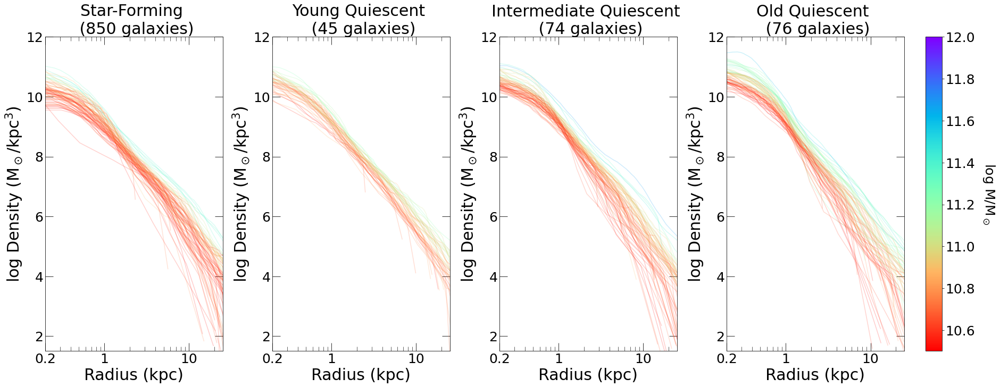

In [10]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(26, 10), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]
ax3 = axes[2]
ax4 = axes[3]
f.set_facecolor('w')
n_bins = 50
redshift = 2
fts = 30
ftss = 25

colormap = plt.get_cmap('rainbow_r')
norm = colors.Normalize(vmin=10.5, vmax=12.0)

#z=2 star-forming galaxies
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    mass = total_mass[ids==id]
    color = colormap(norm(mass)).tolist()
    color = tuple(color[0][:])
    ax1.plot(percentiles, np.log10(xx), color=color, alpha = 0.2)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_ylim(1.5, 12)
ax1.set_xlim(0.2, 25)
ax1.set_ylabel("log Density (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

# #z=2 young quiescent galaxies
for id in ids[PSB_selection]:
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    mass = total_mass[ids==id]
    color = colormap(norm(mass)).tolist()
    color = tuple(color[0][:])
    ax2.plot(percentiles, np.log10(xx), color=color, alpha = 0.2)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=fts) #
ax2.set_ylim(1.5, 12)
ax2.set_xlim(0.2, 25)
ax2.set_ylabel("log Density (M$_\odot$/kpc$^3$)", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

# #z=2 intermediate quiescent galaxies
for id in ids[intermediate_quiescent_selection]:
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    mass = total_mass[ids==id]
    color = colormap(norm(mass)).tolist()
    color = tuple(color[0][:])
    ax3.plot(percentiles, np.log10(xx), color=color, alpha = 0.2)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=fts) #
ax3.set_ylim(1.5, 12)
ax3.set_xlim(0.2, 25)
ax3.set_ylabel("log Density (M$_\odot$/kpc$^3$)", fontsize=fts)
ax3.set_xlabel('Radius (kpc)', fontsize=fts)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

# #z=2 old quiescent galaxies
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    mass = total_mass[ids==id]
    color = colormap(norm(mass)).tolist()
    color = tuple(color[0][:])
    ax4.plot(percentiles, np.log10(xx), color=color, alpha = 0.2)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=fts)
ax4.set_ylim(1.5, 12)
ax4.set_xlim(0.2, 25)
ax4.set_ylabel("log Density (M$_\odot$/kpc$^3$)", fontsize=fts)
ax4.set_xlabel('Radius (kpc)', fontsize=fts)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

sm = plt.cm.ScalarMappable(cmap=colormap, norm=norm)
sm.set_array([])
cbar = f.colorbar(sm, ax=axes.ravel().tolist(), aspect=50)
cbar.set_label('log M/M$_\odot$', fontsize=ftss, rotation=270, labelpad=40)
cbar.ax.tick_params(labelsize=ftss)

# f.tight_layout()

plt.savefig('FIGURES/densityradius.png', dpi=400, bbox_inches='tight')

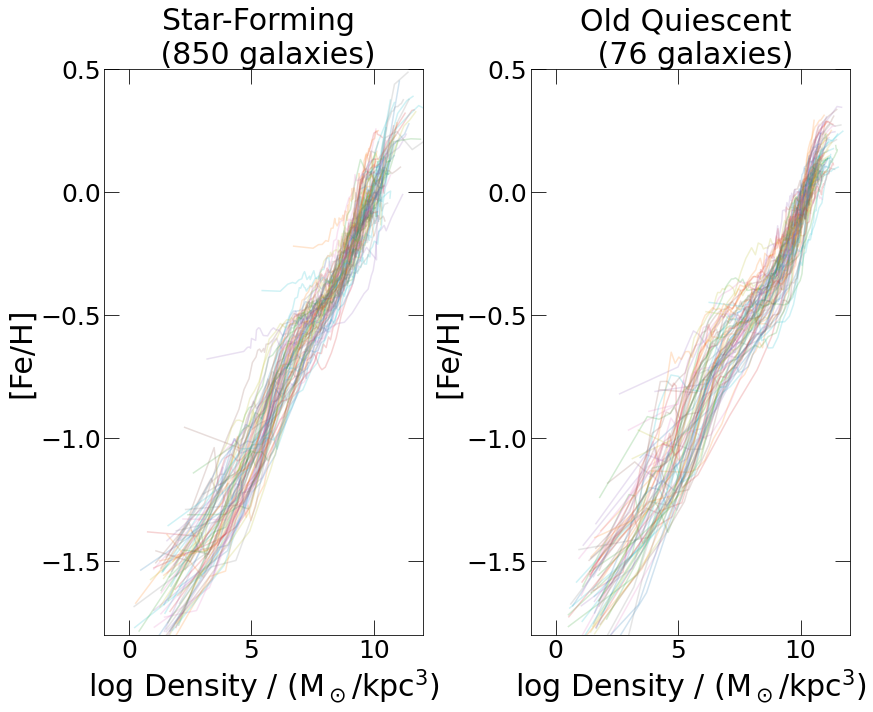

In [8]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(12, 10))
ax1 = axes[0]
ax4 = axes[1]
f.set_facecolor('w')
n_bins = 50
redshift = 2
fts = 30
ftss = 25

# colormap = plt.get_cmap('rainbow_r')
# norm = colors.Normalize(vmin=10.5, vmax=12.0)

#z=2 star-forming galaxies
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    ax1.plot(np.log10(xx), yy, alpha = 0.2)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_xlim(-1, 12)
ax1.set_ylim(-1.8, 0.5)
ax1.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_ylabel('[Fe/H]', fontsize=fts)
# ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax1.set_xticks([0.2, 1, 10], minor=False)
# ax1.set_xticklabels(['0.2', '1', '10'])

# # #z=2 young quiescent galaxies
# for id in ids[PSB_selection]:
#     yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
#     mass = total_mass[ids==id]
#     color = colormap(norm(mass)).tolist()
#     color = tuple(color[0][:])
#     ax2.plot(np.log10(xx), yy, alpha = 0.2)
# ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=fts) #
# ax2.set_xlim(-1, 12)
# ax2.set_ylim(-1.8, 0.5)
# ax2.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
# ax2.set_ylabel('[Fe/H]', fontsize=fts)
# # ax2.set_xscale('log')
# ax2.tick_params(which='major', length=15)
# ax2.tick_params(which='minor', length=8)
# ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# # ax2.set_xticks([0.2, 1, 10], minor=False)
# # ax2.set_xticklabels(['0.2', '1', '10'])

# # #z=2 intermediate quiescent galaxies
# for id in ids[intermediate_quiescent_selection]:
#     yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
#     mass = total_mass[ids==id]
#     color = colormap(norm(mass)).tolist()
#     color = tuple(color[0][:])
#     ax3.plot(np.log10(xx), yy, alpha = 0.2)
# ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=fts) #
# ax3.set_xlim(-1, 12)
# ax3.set_ylim(-1.8, 0.5)
# ax3.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
# ax3.set_ylabel('[Fe/H]', fontsize=fts)
# # ax3.set_xscale('log')
# ax3.tick_params(which='major', length=15)
# ax3.tick_params(which='minor', length=8)
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# # ax3.set_xticks([0.2, 1, 10], minor=False)
# # ax3.set_xticklabels(['0.2', '1', '10'])

# #z=2 old quiescent galaxies
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    ax4.plot(np.log10(xx), yy, alpha = 0.2)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=fts)
ax4.set_xlim(-1, 12)
ax4.set_ylim(-1.8, 0.5)
ax4.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax4.set_ylabel('[Fe/H]', fontsize=fts)
# ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax4.set_xticks([0.2, 1, 10], minor=False)
# ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

plt.savefig('REU/irondensity.png', dpi=400)

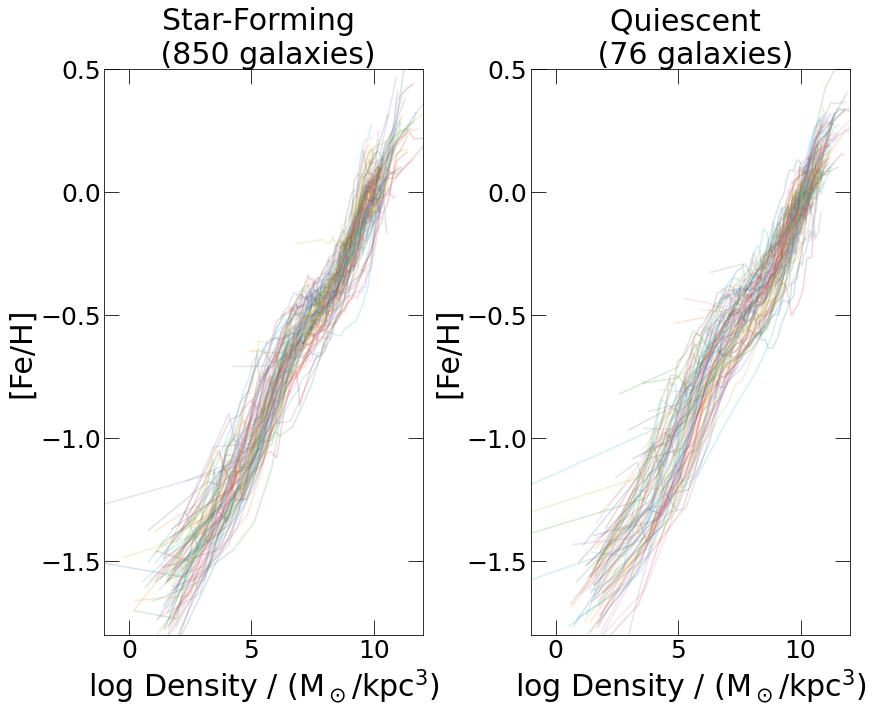

In [96]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(12, 10))
ax1 = axes[0]
ax4 = axes[1]
f.set_facecolor('w')
n_bins = 50
redshift = 2
fts = 30
ftss = 25

# colormap = plt.get_cmap('rainbow_r')
# norm = colors.Normalize(vmin=10.5, vmax=12.0)

#z=2 star-forming galaxies
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    ax1.plot(np.log10(xx), yy, alpha = 0.2)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_xlim(-1, 12)
ax1.set_ylim(-1.8, 0.5)
ax1.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_ylabel('[Fe/H]', fontsize=fts)
# ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax1.set_xticks([0.2, 1, 10], minor=False)
# ax1.set_xticklabels(['0.2', '1', '10'])

# #z=2 young quiescent galaxies
for id in np.random.choice(ids[PSB_selection], 30, replace=False):
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
#     mass = total_mass[ids==id]
#     color = colormap(norm(mass)).tolist()
#     color = tuple(color[0][:])
    ax4.plot(np.log10(xx), yy, alpha = 0.2)
# ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=fts) #
# ax2.set_xlim(-1, 12)
# ax2.set_ylim(-1.8, 0.5)
# ax2.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
# ax2.set_ylabel('[Fe/H]', fontsize=fts)
# # ax2.set_xscale('log')
# ax2.tick_params(which='major', length=15)
# ax2.tick_params(which='minor', length=8)
# ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# # ax2.set_xticks([0.2, 1, 10], minor=False)
# # ax2.set_xticklabels(['0.2', '1', '10'])

# #z=2 intermediate quiescent galaxies
for id in np.random.choice(ids[intermediate_quiescent_selection], 30, replace=False):
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
#     mass = total_mass[ids==id]
#     color = colormap(norm(mass)).tolist()
#     color = tuple(color[0][:])
    ax4.plot(np.log10(xx), yy, alpha = 0.2)
# ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=fts) #
# ax3.set_xlim(-1, 12)
# ax3.set_ylim(-1.8, 0.5)
# ax3.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
# ax3.set_ylabel('[Fe/H]', fontsize=fts)
# # ax3.set_xscale('log')
# ax3.tick_params(which='major', length=15)
# ax3.tick_params(which='minor', length=8)
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# # ax3.set_xticks([0.2, 1, 10], minor=False)
# # ax3.set_xticklabels(['0.2', '1', '10'])

# #z=2 old quiescent galaxies
for id in np.random.choice(ids[old_quiescent_selection], 30, replace=False):
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    ax4.plot(np.log10(xx), yy, alpha = 0.2)
ax4.set_title('Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=fts)
ax4.set_xlim(-1, 12)
ax4.set_ylim(-1.8, 0.5)
ax4.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax4.set_ylabel('[Fe/H]', fontsize=fts)
# ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax4.set_xticks([0.2, 1, 10], minor=False)
# ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

# plt.savefig('REU/irondensity.png', dpi=400)

235.0


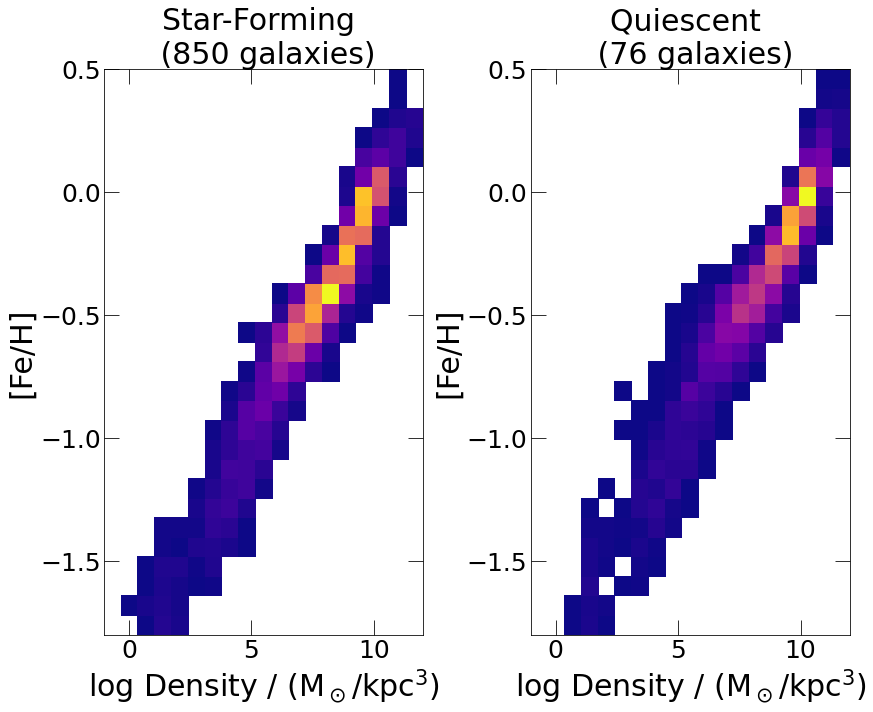

In [101]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(12, 10))
ax1 = axes[0]
ax4 = axes[1]
f.set_facecolor('w')
n_bins = 50
redshift = 2
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

xbins = np.linspace(-1, 12, 20)
ybins = np.linspace(-1.8, 0.5, 30)

#z=2 star-forming galaxies
big_yy=[]
big_xx = []
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    big_yy = np.concatenate((big_yy, yy), axis=None)
    big_xx = np.concatenate((big_xx, np.log10(xx)), axis=None)
#     ax1.plot(np.log10(xx), yy, alpha = 0.2)
h1, _, _ = np.histogram2d(big_xx, big_yy, bins=[xbins, ybins], density=False)#, len(percentiles))    
h1[h1==0] = np.nan
color=colormap(norm(h1)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(xbins, ybins, h1.T, cmap='plasma', color=color, edgecolor=None)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_xlim(-1, 12)
ax1.set_ylim(-1.8, 0.5)
ax1.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_ylabel('[Fe/H]', fontsize=fts)
# ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax1.set_xticks([0.2, 1, 10], minor=False)
# ax1.set_xticklabels(['0.2', '1', '10'])

print(np.amax(h1[np.isfinite(h1)]))

big_yy=[]
big_xx = []
# #z=2 young quiescent galaxies
for id in np.random.choice(ids[PSB_selection], 30, replace=False):
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
#     mass = total_mass[ids==id]
#     color = colormap(norm(mass)).tolist()
#     color = tuple(color[0][:])
    big_yy = np.concatenate((big_yy, yy), axis=None)
    big_xx = np.concatenate((big_xx, np.log10(xx)), axis=None)
#     ax4.plot(np.log10(xx), yy, alpha = 0.2)
# ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=fts) #
# ax2.set_xlim(-1, 12)
# ax2.set_ylim(-1.8, 0.5)
# ax2.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
# ax2.set_ylabel('[Fe/H]', fontsize=fts)
# # ax2.set_xscale('log')
# ax2.tick_params(which='major', length=15)
# ax2.tick_params(which='minor', length=8)
# ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# # ax2.set_xticks([0.2, 1, 10], minor=False)
# # ax2.set_xticklabels(['0.2', '1', '10'])

# #z=2 intermediate quiescent galaxies
for id in np.random.choice(ids[intermediate_quiescent_selection], 30, replace=False):
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
#     mass = total_mass[ids==id]
#     color = colormap(norm(mass)).tolist()
#     color = tuple(color[0][:])
#     ax4.plot(np.log10(xx), yy, alpha = 0.2)
    big_yy = np.concatenate((big_yy, yy), axis=None)
    big_xx = np.concatenate((big_xx, np.log10(xx)), axis=None)
# ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=fts) #
# ax3.set_xlim(-1, 12)
# ax3.set_ylim(-1.8, 0.5)
# ax3.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
# ax3.set_ylabel('[Fe/H]', fontsize=fts)
# # ax3.set_xscale('log')
# ax3.tick_params(which='major', length=15)
# ax3.tick_params(which='minor', length=8)
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# # ax3.set_xticks([0.2, 1, 10], minor=False)
# # ax3.set_xticklabels(['0.2', '1', '10'])

# #z=2 old quiescent galaxies
for id in np.random.choice(ids[old_quiescent_selection], 30, replace=False):
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    big_yy = np.concatenate((big_yy, yy), axis=None)
    big_xx = np.concatenate((big_xx, np.log10(xx)), axis=None)
#     ax4.plot(np.log10(xx), yy, alpha = 0.2)
h2, _, _ = np.histogram2d(big_xx, big_yy, bins=[xbins, ybins], density=False)  
h2[h2==0] = np.nan
color=colormap(norm(h2)).tolist()
color = tuple(color[0][:])
ax4.pcolormesh(xbins, ybins, h2.T, cmap='plasma', color=color, edgecolor=None)
ax4.set_title('Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=fts)
ax4.set_xlim(-1, 12)
ax4.set_ylim(-1.8, 0.5)
ax4.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax4.set_ylabel('[Fe/H]', fontsize=fts)
# ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax4.set_xticks([0.2, 1, 10], minor=False)
# ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

# plt.savefig('REU/irondensity.png', dpi=400)

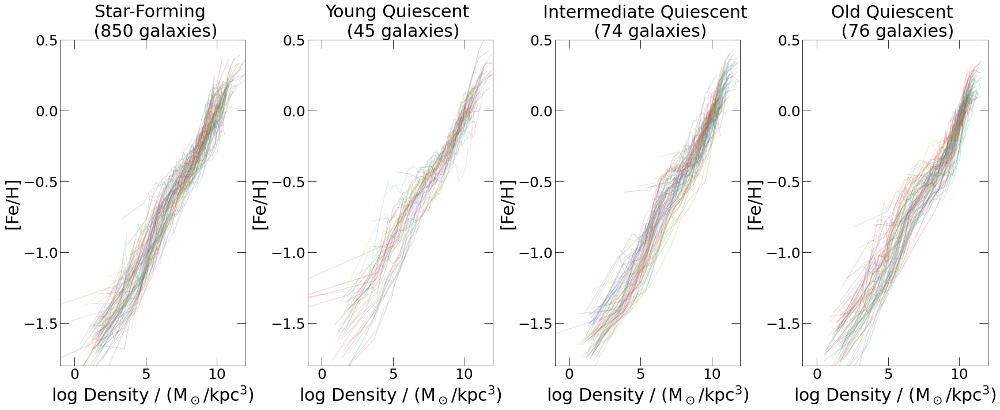

In [5]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
ax1 = axes[0]
ax2 = axes[1]
ax3 = axes[2]
ax4 = axes[3]
f.set_facecolor('w')
n_bins = 50
redshift = 2
fts = 30
ftss = 25

# colormap = plt.get_cmap('rainbow_r')
# norm = colors.Normalize(vmin=10.5, vmax=12.0)

#z=2 star-forming galaxies
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    mass = total_mass[ids==id]
    color = colormap(norm(mass)).tolist()
    color = tuple(color[0][:])
    ax1.plot(np.log10(xx), yy, alpha = 0.2)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_xlim(-1, 12)
ax1.set_ylim(-1.8, 0.5)
ax1.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_ylabel('[Fe/H]', fontsize=fts)
# ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax1.set_xticks([0.2, 1, 10], minor=False)
# ax1.set_xticklabels(['0.2', '1', '10'])

# #z=2 young quiescent galaxies
for id in ids[PSB_selection]:
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    mass = total_mass[ids==id]
    color = colormap(norm(mass)).tolist()
    color = tuple(color[0][:])
    ax2.plot(np.log10(xx), yy, alpha = 0.2)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=fts) #
ax2.set_xlim(-1, 12)
ax2.set_ylim(-1.8, 0.5)
ax2.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax2.set_ylabel('[Fe/H]', fontsize=fts)
# ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax2.set_xticks([0.2, 1, 10], minor=False)
# ax2.set_xticklabels(['0.2', '1', '10'])

# #z=2 intermediate quiescent galaxies
for id in ids[intermediate_quiescent_selection]:
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    mass = total_mass[ids==id]
    color = colormap(norm(mass)).tolist()
    color = tuple(color[0][:])
    ax3.plot(np.log10(xx), yy, alpha = 0.2)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=fts) #
ax3.set_xlim(-1, 12)
ax3.set_ylim(-1.8, 0.5)
ax3.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax3.set_ylabel('[Fe/H]', fontsize=fts)
# ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax3.set_xticks([0.2, 1, 10], minor=False)
# ax3.set_xticklabels(['0.2', '1', '10'])

# #z=2 old quiescent galaxies
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    mass = total_mass[ids==id]
    color = colormap(norm(mass)).tolist()
    color = tuple(color[0][:])
    ax4.plot(np.log10(xx), yy, alpha = 0.2)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=fts)
ax4.set_xlim(-1, 12)
ax4.set_ylim(-1.8, 0.5)
ax4.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax4.set_ylabel('[Fe/H]', fontsize=fts)
# ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax4.set_xticks([0.2, 1, 10], minor=False)
# ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

plt.savefig('FIGURES/irondensity.png', dpi=400)

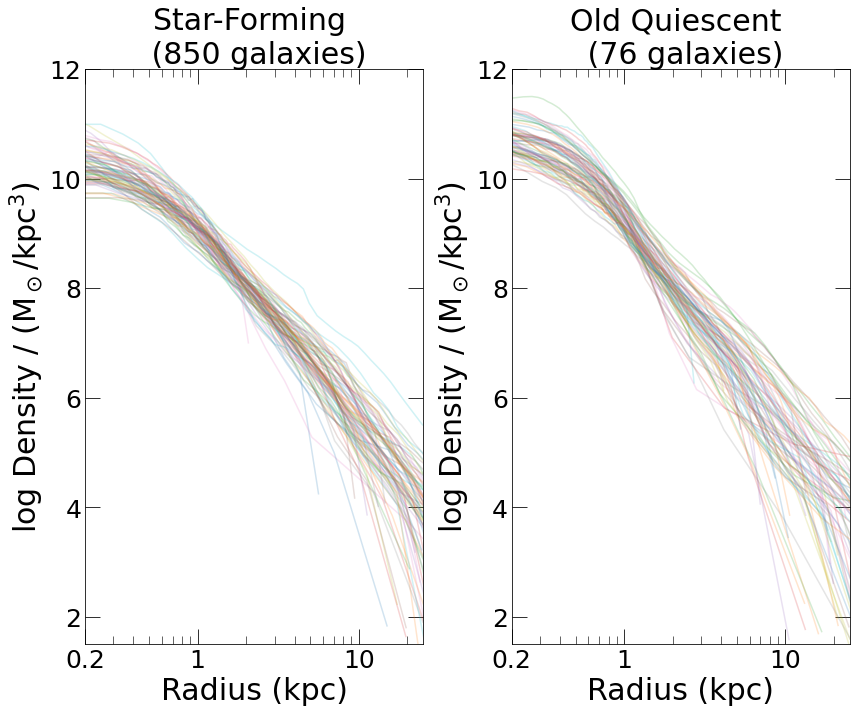

In [9]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(12, 10))
ax1 = axes[0]
ax4 = axes[1]
f.set_facecolor('w')
n_bins = 50
redshift = 2
fts = 30
ftss = 25

#z=2 star-forming galaxies
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    ax1.plot(percentiles, np.log10(xx), alpha = 0.2)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_ylim(1.5, 12)
ax1.set_xlim(0.2, 25)
ax1.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

# # #z=2 young quiescent galaxies
# for id in ids[PSB_selection]:
#     yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
#     mass = total_mass[ids==id]
#     color = colormap(norm(mass)).tolist()
#     color = tuple(color[0][:])
#     ax2.plot(percentiles, np.log10(xx), alpha = 0.2)
# ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=fts) #
# ax2.set_ylim(1.5, 12)
# ax2.set_xlim(0.2, 25)
# ax2.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
# ax2.set_xlabel('Radius (kpc)', fontsize=fts)
# ax2.set_xscale('log')
# ax2.tick_params(which='major', length=15)
# ax2.tick_params(which='minor', length=8)
# ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax2.set_xticks([0.2, 1, 10], minor=False)
# ax2.set_xticklabels(['0.2', '1', '10'])

# # #z=2 intermediate quiescent galaxies
# for id in ids[intermediate_quiescent_selection]:
#     yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
#     mass = total_mass[ids==id]
#     color = colormap(norm(mass)).tolist()
#     color = tuple(color[0][:])
#     ax3.plot(percentiles, np.log10(xx), alpha = 0.2)
# ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=fts) #
# ax3.set_ylim(1.5, 12)
# ax3.set_xlim(0.2, 25)
# ax3.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
# ax3.set_xlabel('Radius (kpc)', fontsize=fts)
# ax3.set_xscale('log')
# ax3.tick_params(which='major', length=15)
# ax3.tick_params(which='minor', length=8)
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax3.set_xticks([0.2, 1, 10], minor=False)
# ax3.set_xticklabels(['0.2', '1', '10'])

# #z=2 old quiescent galaxies
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    ax4.plot(percentiles, np.log10(xx), alpha = 0.2)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=fts)
ax4.set_ylim(1.5, 12)
ax4.set_xlim(0.2, 25)
ax4.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax4.set_xlabel('Radius (kpc)', fontsize=fts)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

plt.savefig('REU/densityradius.png', dpi=400)

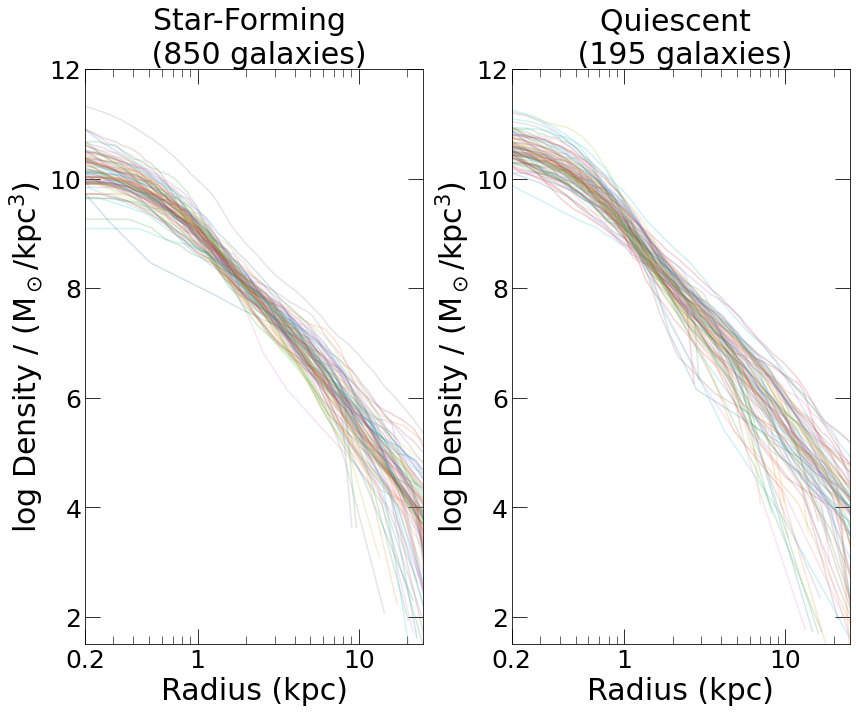

In [4]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(12, 10))
ax1 = axes[0]
ax4 = axes[1]
f.set_facecolor('w')
n_bins = 50
redshift = 2
fts = 30
ftss = 25

#z=2 star-forming galaxies
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    ax1.plot(percentiles, np.log10(xx), alpha = 0.2)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_ylim(1.5, 12)
ax1.set_xlim(0.2, 25)
ax1.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

# # #z=2 young quiescent galaxies
for id in np.random.choice(ids[PSB_selection], 30, replace=False):
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
#     mass = total_mass[ids==id]
#     color = colormap(norm(mass)).tolist()
#     color = tuple(color[0][:])
    ax4.plot(percentiles, np.log10(xx), alpha = 0.2)
# ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=fts) #
# ax2.set_ylim(1.5, 12)
# ax2.set_xlim(0.2, 25)
# ax2.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
# ax2.set_xlabel('Radius (kpc)', fontsize=fts)
# ax2.set_xscale('log')
# ax2.tick_params(which='major', length=15)
# ax2.tick_params(which='minor', length=8)
# ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax2.set_xticks([0.2, 1, 10], minor=False)
# ax2.set_xticklabels(['0.2', '1', '10'])

# # #z=2 intermediate quiescent galaxies
for id in np.random.choice(ids[intermediate_quiescent_selection], 30, replace=False):
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
#     mass = total_mass[ids==id]
#     color = colormap(norm(mass)).tolist()
#     color = tuple(color[0][:])
    ax4.plot(percentiles, np.log10(xx), alpha = 0.2)
# ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=fts) #
# ax3.set_ylim(1.5, 12)
# ax3.set_xlim(0.2, 25)
# ax3.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
# ax3.set_xlabel('Radius (kpc)', fontsize=fts)
# ax3.set_xscale('log')
# ax3.tick_params(which='major', length=15)
# ax3.tick_params(which='minor', length=8)
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax3.set_xticks([0.2, 1, 10], minor=False)
# ax3.set_xticklabels(['0.2', '1', '10'])

# #z=2 old quiescent galaxies
for id in np.random.choice(ids[old_quiescent_selection], 30, replace=False):
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    ax4.plot(percentiles, np.log10(xx), alpha = 0.2)
ax4.set_title('Quiescent \n ('+str(len(ids[old_quiescent_selection])+len(ids[intermediate_quiescent_selection])+len(ids[PSB_selection]))+' galaxies)', fontsize=fts)
ax4.set_ylim(1.5, 12)
ax4.set_xlim(0.2, 25)
ax4.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax4.set_xlabel('Radius (kpc)', fontsize=fts)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

# plt.savefig('REU/densityradius.png', dpi=400)

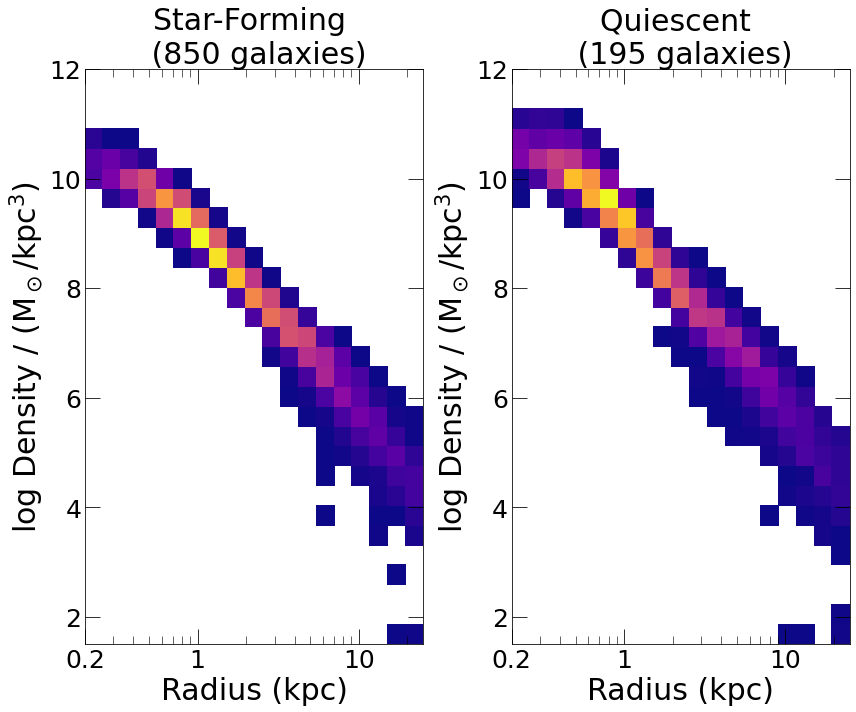

In [95]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(12, 10), constrained_layout=True)
ax1 = axes[0]
ax4 = axes[1]
f.set_facecolor('w')
n_bins = 50
redshift = 2
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=200)

xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(1.5, 12, 30)

#z=2 star-forming galaxies
big_percentiles=[]
big_xx = []
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    big_percentiles = np.concatenate((big_percentiles, percentiles), axis=None)
    big_xx = np.concatenate((big_xx, np.log10(xx)), axis=None)
#     ax1.plot(percentiles, np.log10(xx), alpha = 0.2)
# h, xedges, yedges, _ = ax1.hist2d(big_percentiles, big_xx, bins=[xbins, ybins], cmap='viridis', density=False, cmin=cmin)#, len(percentiles))    
h, _, _ = np.histogram2d(big_percentiles, big_xx, bins=[xbins, ybins], density=False)#, len(percentiles))    
h[h==0] = np.nan
color=colormap(norm(h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(xbins, ybins, h.T, cmap='plasma', color=color, edgecolor=None)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_ylim(1.5, 12)
ax1.set_xlim(0.2, 25)
ax1.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])


big_percentiles=[]
big_xx = []
# #z=2 young quiescent galaxies
for id in np.random.choice(ids[PSB_selection], 30, replace=False):
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
#     mass = total_mass[ids==id]
#     color = colormap(norm(mass)).tolist()
#     color = tuple(color[0][:])
    big_percentiles = np.concatenate((big_percentiles, percentiles), axis=None)
    big_xx = np.concatenate((big_xx, np.log10(xx)), axis=None)
#     ax4.plot(percentiles, np.log10(xx), alpha = 0.2)
# ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=fts) #
# ax2.set_ylim(1.5, 12)
# ax2.set_xlim(0.2, 25)
# ax2.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
# ax2.set_xlabel('Radius (kpc)', fontsize=fts)
# ax2.set_xscale('log')
# ax2.tick_params(which='major', length=15)
# ax2.tick_params(which='minor', length=8)
# ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax2.set_xticks([0.2, 1, 10], minor=False)
# ax2.set_xticklabels(['0.2', '1', '10'])

# # #z=2 intermediate quiescent galaxies
for id in np.random.choice(ids[intermediate_quiescent_selection], 30, replace=False):
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
#     mass = total_mass[ids==id]
#     color = colormap(norm(mass)).tolist()
#     color = tuple(color[0][:])
    big_percentiles = np.concatenate((big_percentiles, percentiles), axis=None)
    big_xx = np.concatenate((big_xx, np.log10(xx)), axis=None)
#     ax4.plot(percentiles, np.log10(xx), alpha = 0.2)
# ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=fts) #
# ax3.set_ylim(1.5, 12)
# ax3.set_xlim(0.2, 25)
# ax3.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
# ax3.set_xlabel('Radius (kpc)', fontsize=fts)
# ax3.set_xscale('log')
# ax3.tick_params(which='major', length=15)
# ax3.tick_params(which='minor', length=8)
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax3.set_xticks([0.2, 1, 10], minor=False)
# ax3.set_xticklabels(['0.2', '1', '10'])

# #z=2 old quiescent galaxies
for id in np.random.choice(ids[old_quiescent_selection], 30, replace=False):
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    big_percentiles = np.concatenate((big_percentiles, percentiles), axis=None)
    big_xx = np.concatenate((big_xx, np.log10(xx)), axis=None)
#     ax4.plot(percentiles, np.log10(xx), alpha = 0.2)
h2, _, _ = np.histogram2d(big_percentiles, big_xx, bins=[xbins, ybins], density=False)#, len(percentiles))    
h2[h2==0] = np.nan
color=colormap(norm(h2)).tolist()
color = tuple(color[0][:])
ax4.pcolormesh(xbins, ybins, h2.T, cmap='plasma', color=color, edgecolor=None)
ax4.set_title('Quiescent \n ('+str(len(ids[old_quiescent_selection])+len(ids[intermediate_quiescent_selection])+len(ids[PSB_selection]))+' galaxies)', fontsize=fts)
ax4.set_ylim(1.5, 12)
ax4.set_xlim(0.2, 25)
ax4.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax4.set_xlabel('Radius (kpc)', fontsize=fts)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

# colorbar
# print(h[np.isfinite(h)])
# print(np.amax(h[np.isfinite(h)]))

# sm = plt.cm.ScalarMappable(cmap=colormap, norm=norm)
# sm.set_array([])
# cbar = f.colorbar(sm, ax=axes.ravel().tolist(), aspect=50, pad=0.9)
# cbar.set_label('Normalized Count', fontsize=ftss, rotation=270, labelpad=50)
# cbar.ax.tick_params(labelsize=ftss)

f.tight_layout()

# plt.savefig('REU/densityradius.png', dpi=400)

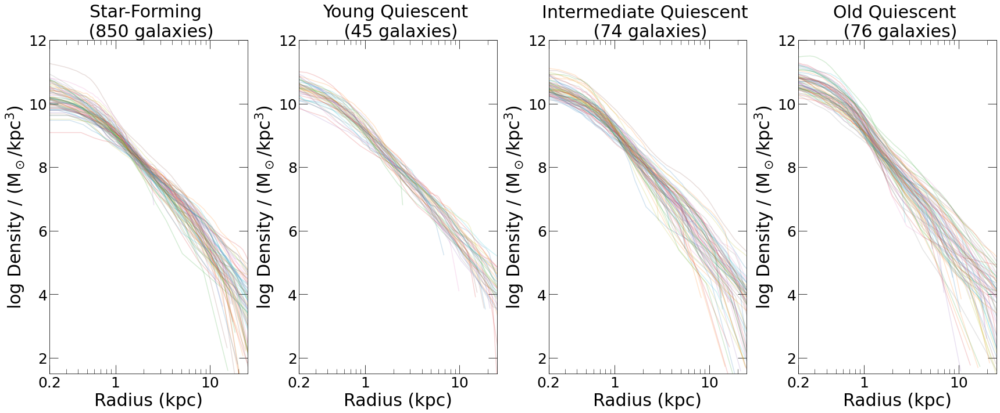

In [6]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
ax1 = axes[0]
ax2 = axes[1]
ax3 = axes[2]
ax4 = axes[3]
f.set_facecolor('w')
n_bins = 50
redshift = 2
fts = 30
ftss = 25

#z=2 star-forming galaxies
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    mass = total_mass[ids==id]
    color = colormap(norm(mass)).tolist()
    color = tuple(color[0][:])
    ax1.plot(percentiles, np.log10(xx), alpha = 0.2)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_ylim(1.5, 12)
ax1.set_xlim(0.2, 25)
ax1.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

# #z=2 young quiescent galaxies
for id in ids[PSB_selection]:
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    mass = total_mass[ids==id]
    color = colormap(norm(mass)).tolist()
    color = tuple(color[0][:])
    ax2.plot(percentiles, np.log10(xx), alpha = 0.2)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=fts) #
ax2.set_ylim(1.5, 12)
ax2.set_xlim(0.2, 25)
ax2.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

# #z=2 intermediate quiescent galaxies
for id in ids[intermediate_quiescent_selection]:
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    mass = total_mass[ids==id]
    color = colormap(norm(mass)).tolist()
    color = tuple(color[0][:])
    ax3.plot(percentiles, np.log10(xx), alpha = 0.2)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=fts) #
ax3.set_ylim(1.5, 12)
ax3.set_xlim(0.2, 25)
ax3.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax3.set_xlabel('Radius (kpc)', fontsize=fts)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

# #z=2 old quiescent galaxies
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R, percentiles = metals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    mass = total_mass[ids==id]
    color = colormap(norm(mass)).tolist()
    color = tuple(color[0][:])
    ax4.plot(percentiles, np.log10(xx), alpha = 0.2)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=fts)
ax4.set_ylim(1.5, 12)
ax4.set_xlim(0.2, 25)
ax4.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax4.set_xlabel('Radius (kpc)', fontsize=fts)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

plt.savefig('FIGURES/densityradius.png', dpi=400)

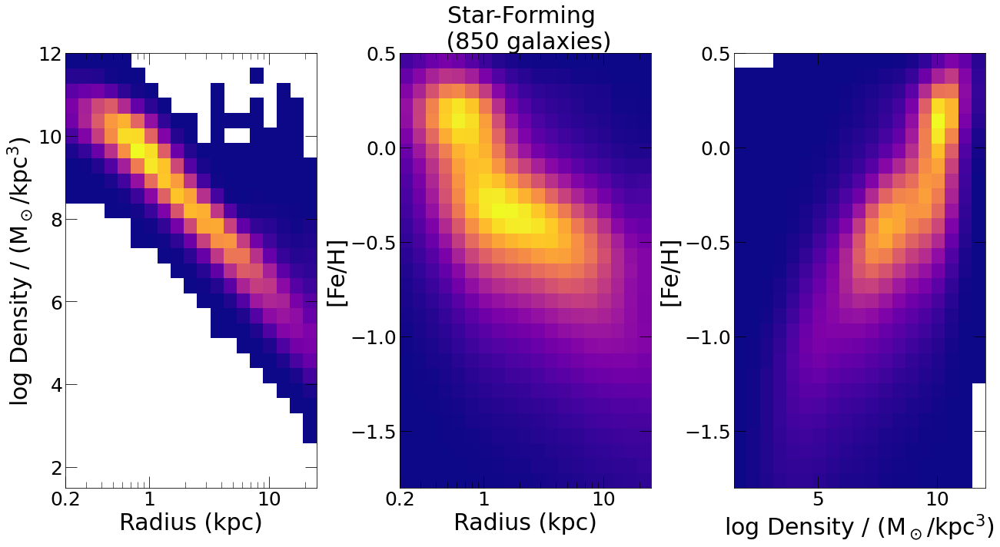

In [4]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 3, sharex='none', sharey='none', figsize=(18, 10), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]
ax3 = axes[2]
f.set_facecolor('w')
n_bins = 50
redshift = 2
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(0.2, 25, 30)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(1.5, 12, 30)
metalbins = np.linspace(-1.8, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(xbins)-1, len(ybins)-1))
big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    logFeH, density, R = histmetals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    h, _, _ = np.histogram2d(R, np.log10(density), bins=[xbins, ybins], density=False)#, len(percentiles))
    h2, _, _ = np.histogram2d(R, logFeH, bins=[xbins, metalbins], density=False)
    h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
    big_h3 += h3
    big_h2 += h2
    big_h += h 
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_ylim(1.5, 12)
ax1.set_xlim(0.2, 25)
ax1.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(xbins, metalbins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
ax2.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax2.set_ylim(-1.8, 0.5)
ax2.set_xlim(0.2, 25)
ax2.set_ylabel("[Fe/H]", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(densitybins2, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax3.set_xlim(1.5, 12)
ax3.set_ylim(-1.8, 0.5)
ax3.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax3.set_ylabel('[Fe/H]', fontsize=fts)
# ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

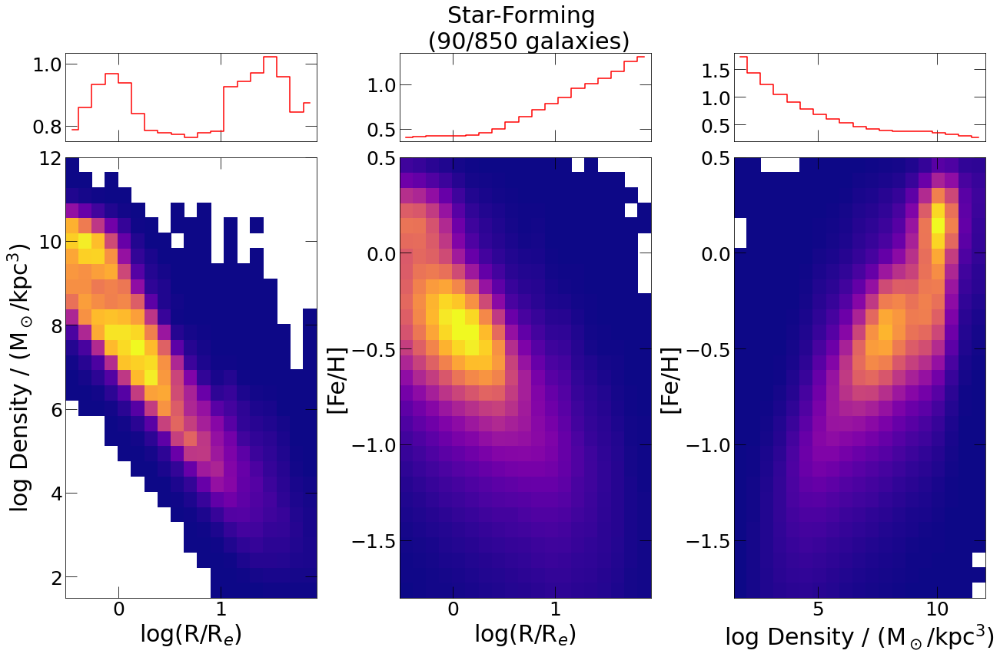

In [11]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(2, 3, sharex='none', sharey='none', figsize=(18, 12), gridspec_kw={'height_ratios': [1, 5]}, constrained_layout=True)
ax1 = axes[1][0]
ax2 = axes[1][1]
ax3 = axes[1][2]
sc1 = axes[0][0]
sc2 = axes[0][1]
sc3 = axes[0][2]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

xbins = np.linspace(-0.52, 1.94, 20)
ybins = np.linspace(1.5, 12, 30)
metalbins = np.linspace(-1.8, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(xbins)-1, len(ybins)-1))
big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
big_density = np.zeros(0)
big_R = np.zeros(0)
big_FeH = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    logFeH, density, R = histmetals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    R_e = halfmass_rad_stars(id, redshift)
    big_density = np.concatenate((big_density, np.log10(density)), axis=None)
    big_R = np.concatenate((big_R, np.log10(R/R_e)), axis=None)
    big_FeH = np.concatenate((big_FeH, logFeH), axis=None)
    h, _, _ = np.histogram2d(np.log10(R/R_e), np.log10(density), bins=[xbins, ybins], density=False)#, len(percentiles))
    h2, _, _ = np.histogram2d(np.log10(R/R_e), logFeH, bins=[xbins, metalbins], density=False)
    h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
    big_h3 += h3
    big_h2 += h2
    big_h += h 

# quantify scatter
xbins_new = (xbins[1:]+xbins[:-1])/2
densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
ybins_new = (ybins[1:]+ybins[:-1])/2
metalbins_new = (metalbins[1:]+metalbins[:-1])/2

stat1, _, _ = stats.binned_statistic(big_R, big_density, 'std', bins=xbins)
stat2, _, _ = stats.binned_statistic(big_R, big_FeH, 'std', bins=xbins)
stat3, _, _ = stats.binned_statistic(big_density, big_FeH, 'std', bins=densitybins2)

sc1.step(xbins_new, stat1, 'r', where='mid')
sc2.step(xbins_new, stat2, 'r', where='mid')
sc3.step(densitybins2_new, stat3, 'r', where='mid')

# plot big pixel maps
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[0].set_xlim(-0.52, 1.94)
    ax[0].tick_params(which='major', length=15)
    ax[0].tick_params(which='minor', length=8)
    ax[0].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(1.5, 12)
ax1.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_xlabel('log(R/R$_e$)', fontsize=fts)

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(xbins, metalbins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
for ax in axes:
    ax[1].set_xlim(-0.52, 1.94)
    ax[1].tick_params(which='major', length=15)
    ax[1].tick_params(which='minor', length=8)
    ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-1.8, 0.5)
ax2.set_ylabel("[Fe/H]", fontsize=fts)
ax2.set_xlabel('log(R/R$_e$)', fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(densitybins2, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[2].set_xlim(1.5, 12)
    ax[2].tick_params(which='major', length=15)
    ax[2].tick_params(which='minor', length=8)
    ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax3.set_ylabel('[Fe/H]', fontsize=fts)
ax3.set_ylim(-1.8, 0.5)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

sc2.set_title('Star-Forming \n (90/'+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts)

for ax in axes[0]:
    ax.set_xticklabels([])

f.tight_layout()

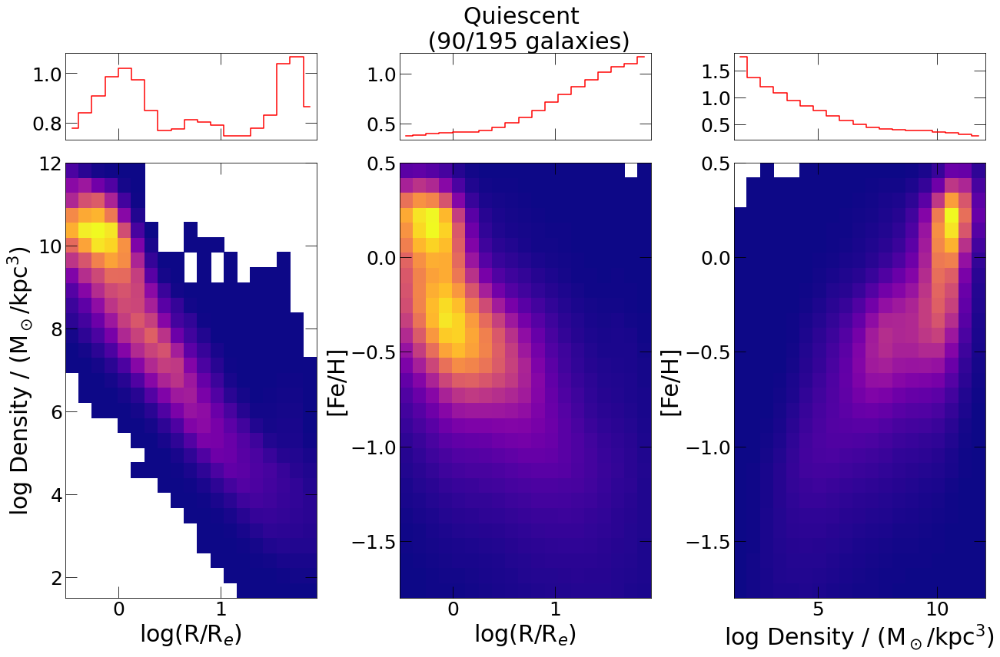

In [10]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(2, 3, sharex='none', sharey='none', figsize=(18, 12), gridspec_kw={'height_ratios': [1, 5]}, constrained_layout=True)
ax1 = axes[1][0]
ax2 = axes[1][1]
ax3 = axes[1][2]
sc1 = axes[0][0]
sc2 = axes[0][1]
sc3 = axes[0][2]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

xbins = np.linspace(-0.52, 1.94, 20)
ybins = np.linspace(1.5, 12, 30)
metalbins = np.linspace(-1.8, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(xbins)-1, len(ybins)-1))
big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
big_density = np.zeros(0)
big_R = np.zeros(0)
big_FeH = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    logFeH, density, R = histmetals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    R_e = halfmass_rad_stars(id, redshift)
    big_density = np.concatenate((big_density, np.log10(density)), axis=None)
    big_R = np.concatenate((big_R, np.log10(R/R_e)), axis=None)
    big_FeH = np.concatenate((big_FeH, logFeH), axis=None)
    h, _, _ = np.histogram2d(np.log10(R/R_e), np.log10(density), bins=[xbins, ybins], density=False)#, len(percentiles))
    h2, _, _ = np.histogram2d(np.log10(R/R_e), logFeH, bins=[xbins, metalbins], density=False)
    h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
    big_h3 += h3
    big_h2 += h2
    big_h += h 

# quantify scatter
xbins_new = (xbins[1:]+xbins[:-1])/2
densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
ybins_new = (ybins[1:]+ybins[:-1])/2
metalbins_new = (metalbins[1:]+metalbins[:-1])/2

stat1, _, _ = stats.binned_statistic(big_R, big_density, 'std', bins=xbins)
stat2, _, _ = stats.binned_statistic(big_R, big_FeH, 'std', bins=xbins)
stat3, _, _ = stats.binned_statistic(big_density, big_FeH, 'std', bins=densitybins2)

sc1.step(xbins_new, stat1, 'r', where='mid')
sc2.step(xbins_new, stat2, 'r', where='mid')
sc3.step(densitybins2_new, stat3, 'r', where='mid')

# plot big pixel maps
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[0].set_xlim(-0.52, 1.94)
    ax[0].tick_params(which='major', length=15)
    ax[0].tick_params(which='minor', length=8)
    ax[0].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(1.5, 12)
ax1.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_xlabel('log(R/R$_e$)', fontsize=fts)

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(xbins, metalbins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
for ax in axes:
    ax[1].set_xlim(-0.52, 1.94)
    ax[1].tick_params(which='major', length=15)
    ax[1].tick_params(which='minor', length=8)
    ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-1.8, 0.5)
ax2.set_ylabel("[Fe/H]", fontsize=fts)
ax2.set_xlabel('log(R/R$_e$)', fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(densitybins2, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[2].set_xlim(1.5, 12)
    ax[2].tick_params(which='major', length=15)
    ax[2].tick_params(which='minor', length=8)
    ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax3.set_ylabel('[Fe/H]', fontsize=fts)
ax3.set_ylim(-1.8, 0.5)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

sc2.set_title('Quiescent \n (90/'+str(len(ids[quiescent_selection]))+' galaxies)', fontsize=fts)

for ax in axes[0]:
    ax.set_xticklabels([])

f.tight_layout()

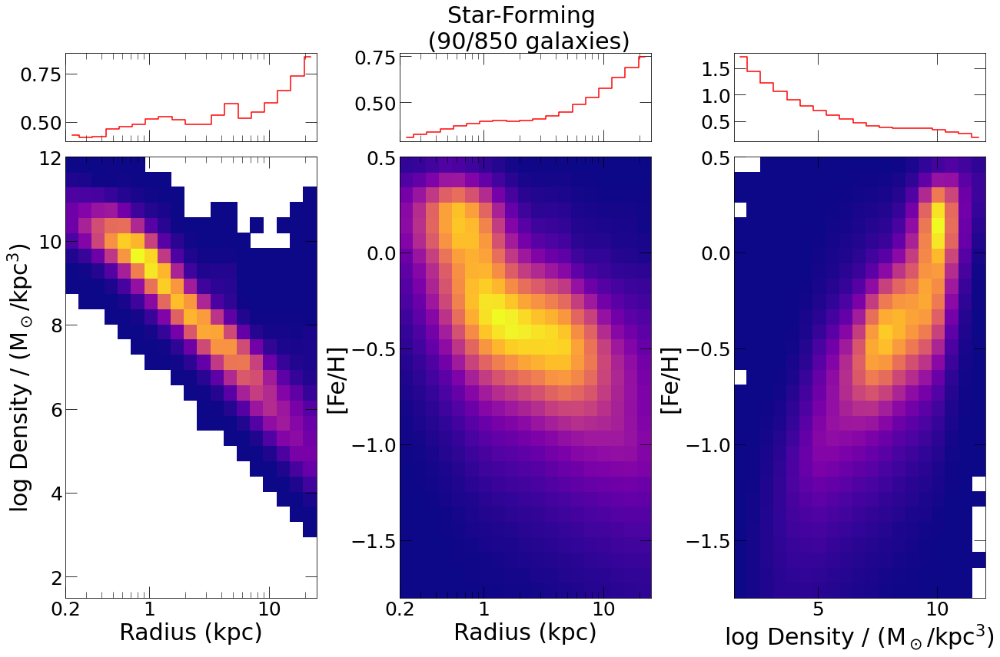

In [7]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(2, 3, sharex='none', sharey='none', figsize=(18, 12), gridspec_kw={'height_ratios': [1, 5]}, constrained_layout=True)
ax1 = axes[1][0]
ax2 = axes[1][1]
ax3 = axes[1][2]
sc1 = axes[0][0]
sc2 = axes[0][1]
sc3 = axes[0][2]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(1.5, 12, 30)
metalbins = np.linspace(-1.8, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(xbins)-1, len(ybins)-1))
big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
big_density = np.zeros(0)
big_R = np.zeros(0)
big_FeH = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    logFeH, density, R = histmetals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    big_density = np.concatenate((big_density, np.log10(density)), axis=None)
    big_R = np.concatenate((big_R, R), axis=None)
    big_FeH = np.concatenate((big_FeH, logFeH), axis=None)
    h, _, _ = np.histogram2d(R, np.log10(density), bins=[xbins, ybins], density=False)#, len(percentiles))
    h2, _, _ = np.histogram2d(R, logFeH, bins=[xbins, metalbins], density=False)
    h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
    big_h3 += h3
    big_h2 += h2
    big_h += h 

# quantify scatter
xbins_new = (xbins[1:]+xbins[:-1])/2
densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
ybins_new = (ybins[1:]+ybins[:-1])/2
metalbins_new = (metalbins[1:]+metalbins[:-1])/2

stat1, _, _ = stats.binned_statistic(big_R, big_density, 'std', bins=xbins)
stat2, _, _ = stats.binned_statistic(big_R, big_FeH, 'std', bins=xbins)
stat3, _, _ = stats.binned_statistic(big_density, big_FeH, 'std', bins=densitybins2)

sc1.step(xbins_new, stat1, 'r', where='mid')
sc2.step(xbins_new, stat2, 'r', where='mid')
sc3.step(densitybins2_new, stat3, 'r', where='mid')

# plot big pixel maps
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[0].set_xlim(0.2, 25)
    ax[0].set_xscale('log')
    ax[0].set_xticks([0.2, 1, 10], minor=False)
    ax[0].set_xticklabels(['0.2', '1', '10'])
    ax[0].tick_params(which='major', length=15)
    ax[0].tick_params(which='minor', length=8)
    ax[0].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(1.5, 12)
ax1.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(xbins, metalbins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
for ax in axes:
    ax[1].set_xlim(0.2, 25)
    ax[1].set_xscale('log')
    ax[1].set_xticks([0.2, 1, 10], minor=False)
    ax[1].set_xticklabels(['0.2', '1', '10'])
    ax[1].tick_params(which='major', length=15)
    ax[1].tick_params(which='minor', length=8)
    ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-1.8, 0.5)
ax2.set_ylabel("[Fe/H]", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(densitybins2, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[2].set_xlim(1.5, 12)
    ax[2].tick_params(which='major', length=15)
    ax[2].tick_params(which='minor', length=8)
    ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax3.set_ylabel('[Fe/H]', fontsize=fts)
ax3.set_ylim(-1.8, 0.5)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

sc2.set_title('Star-Forming \n (90/'+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts)

for ax in axes[0]:
    ax.set_xticklabels([])

f.tight_layout()

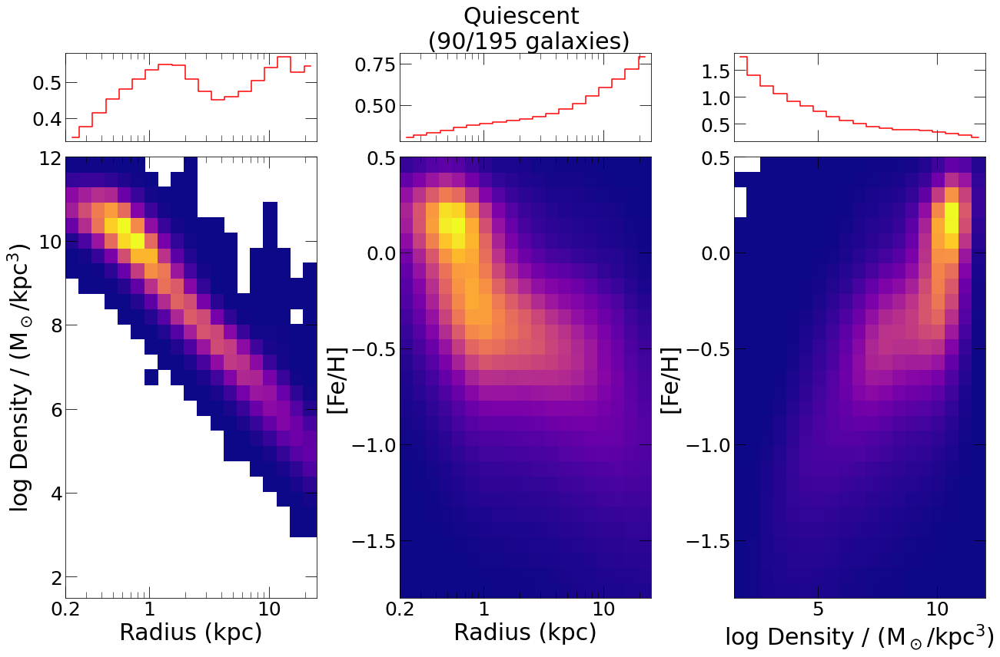

In [8]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie

#metallicity profiles
f, (axes) = plt.subplots(2, 3, sharex='none', sharey='none', figsize=(18, 12), gridspec_kw={'height_ratios': [1, 5]}, constrained_layout=True)
ax1 = axes[1][0]
ax2 = axes[1][1]
ax3 = axes[1][2]
sc1 = axes[0][0]
sc2 = axes[0][1]
sc3 = axes[0][2]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(-0.52, 1.94, 20)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(1.5, 12, 30)
metalbins = np.linspace(-1.8, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(xbins)-1, len(ybins)-1))
big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
big_density = np.zeros(0)
big_R = np.zeros(0)
big_FeH = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    logFeH, density, R = histmetals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    big_density = np.concatenate((big_density, np.log10(density)), axis=None)
    big_R = np.concatenate((big_R, R), axis=None)
    big_FeH = np.concatenate((big_FeH, logFeH), axis=None)
    h, _, _ = np.histogram2d(R, np.log10(density), bins=[xbins, ybins], density=False)#, len(percentiles))
    h2, _, _ = np.histogram2d(R, logFeH, bins=[xbins, metalbins], density=False)
    h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
    big_h3 += h3
    big_h2 += h2
    big_h += h 

# quantify scatter
xbins_new = (xbins[1:]+xbins[:-1])/2
densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
ybins_new = (ybins[1:]+ybins[:-1])/2
metalbins_new = (metalbins[1:]+metalbins[:-1])/2

stat1, _, _ = stats.binned_statistic(big_R, big_density, 'std', bins=xbins)
stat2, _, _ = stats.binned_statistic(big_R, big_FeH, 'std', bins=xbins)
stat3, _, _ = stats.binned_statistic(big_density, big_FeH, 'std', bins=densitybins2)

sc1.step(xbins_new, stat1, 'r', where='mid')
sc2.step(xbins_new, stat2, 'r', where='mid')
sc3.step(densitybins2_new, stat3, 'r', where='mid')

# plot big pixel maps
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[0].set_xlim(0.2, 25)
    ax[0].set_xscale('log')
    ax[0].set_xticks([0.2, 1, 10], minor=False)
    ax[0].set_xticklabels(['0.2', '1', '10'])
    ax[0].tick_params(which='major', length=15)
    ax[0].tick_params(which='minor', length=8)
    ax[0].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(1.5, 12)
ax1.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(xbins, metalbins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
for ax in axes:
    ax[1].set_xlim(0.2, 25)
    ax[1].set_xscale('log')
    ax[1].set_xticks([0.2, 1, 10], minor=False)
    ax[1].set_xticklabels(['0.2', '1', '10'])
    ax[1].tick_params(which='major', length=15)
    ax[1].tick_params(which='minor', length=8)
    ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-1.8, 0.5)
ax2.set_ylabel("[Fe/H]", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(densitybins2, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[2].set_xlim(1.5, 12)
    ax[2].tick_params(which='major', length=15)
    ax[2].tick_params(which='minor', length=8)
    ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax3.set_ylabel('[Fe/H]', fontsize=fts)
ax3.set_ylim(-1.8, 0.5)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

sc2.set_title('Quiescent \n (90/'+str(len(ids[quiescent_selection]))+' galaxies)', fontsize=fts)

for ax in axes[0]:
    ax.set_xticklabels([])

f.tight_layout()

In [15]:
import os

rawdata_filename = os.path.join('redshift_'+str(redshift)+'_data', 'cutout_'+str(id)+'_redshift_'+str(redshift)+'_rawdata.hdf5')

with h5py.File(rawdata_filename, 'r') as f:
        starFormationTime = f['PartType4']['GFM_StellarFormationTime'][:]
        print(np.min(starFormationTime), np.max(starFormationTime))

0.06007344 0.3329602


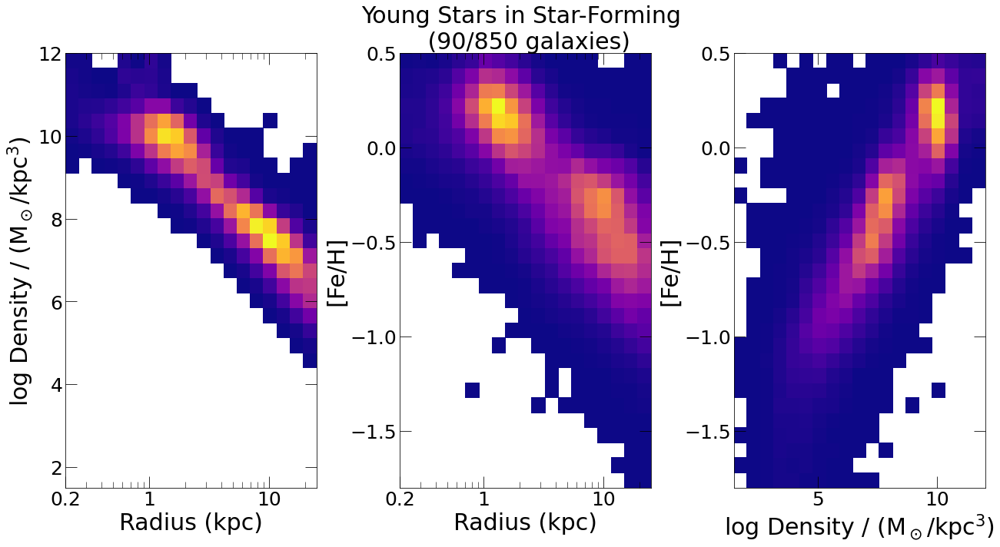

In [12]:
from matplotlib import colors
from astropy.cosmology import FlatLambdaCDM
import astropy.units as u
from astropy.constants import G, h, k_B
h = 0.6774
cosmo = FlatLambdaCDM(H0= (h * 100) * u.km / u.s / u.Mpc, Tcmb0=2.725 * u.K, Om0=0.3)

#metallicity profiles
f, (axes) = plt.subplots(1, 3, sharex='none', sharey='none', figsize=(18, 10), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]
ax3 = axes[2]
f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(0.2, 25, 30)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(1.5, 12, 30)
metalbins = np.linspace(-1.8, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

# quicker age calculation
starFormationTime = np.linspace(0, 0.4, 1000)
starFormationRedshift = 1/starFormationTime - 1 #units:redshift
starFormationGyr = cosmo.age(starFormationRedshift).value #units:Gyr
# print(starFormationTime)
# print(starFormationRedshift)
# print(starFormationGyr)

#z=2 star-forming galaxies
big_h = np.zeros((len(xbins)-1, len(ybins)-1))
big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    logFeH, density, R = histmetals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', young=[starFormationTime, starFormationGyr])
    h, _, _ = np.histogram2d(R, np.log10(density), bins=[xbins, ybins], density=False)#, len(percentiles))
    h2, _, _ = np.histogram2d(R, logFeH, bins=[xbins, metalbins], density=False)
    h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
    big_h3 += h3
    big_h2 += h2
    big_h += h 
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_ylim(1.5, 12)
ax1.set_xlim(0.2, 25)
ax1.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(xbins, metalbins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
ax2.set_title('Young Stars in Star-Forming \n (90/'+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax2.set_ylim(-1.8, 0.5)
ax2.set_xlim(0.2, 25)
ax2.set_ylabel("[Fe/H]", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(densitybins2, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax3.set_xlim(1.5, 12)
ax3.set_ylim(-1.8, 0.5)
ax3.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax3.set_ylabel('[Fe/H]', fontsize=fts)
# ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

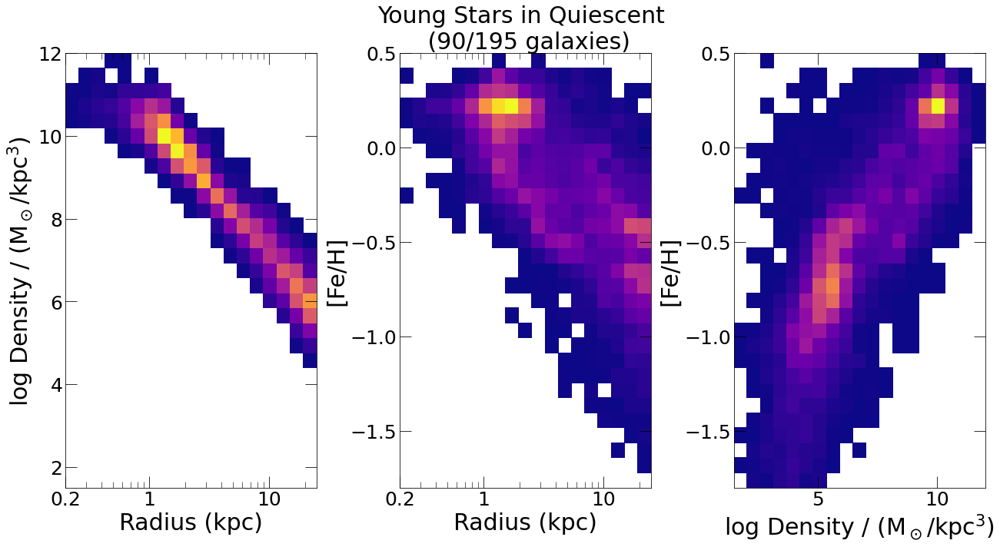

In [14]:
from matplotlib import colors
from astropy.cosmology import FlatLambdaCDM
import astropy.units as u
from astropy.constants import G, h, k_B
h = 0.6774
cosmo = FlatLambdaCDM(H0= (h * 100) * u.km / u.s / u.Mpc, Tcmb0=2.725 * u.K, Om0=0.3)

#metallicity profiles
f, (axes) = plt.subplots(1, 3, sharex='none', sharey='none', figsize=(18, 10), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]
ax3 = axes[2]
f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(0.2, 25, 30)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(1.5, 12, 30)
metalbins = np.linspace(-1.8, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

# quicker age calculation
starFormationTime = np.linspace(0, 0.4, 1000)
starFormationRedshift = 1/starFormationTime - 1 #units:redshift
starFormationGyr = cosmo.age(starFormationRedshift).value #units:Gyr
# print(starFormationTime)
# print(starFormationRedshift)
# print(starFormationGyr)

#z=2 star-forming galaxies
big_h = np.zeros((len(xbins)-1, len(ybins)-1))
big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    logFeH, density, R = histmetals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', young=[starFormationTime, starFormationGyr])
    h, _, _ = np.histogram2d(R, np.log10(density), bins=[xbins, ybins], density=False)#, len(percentiles))
    h2, _, _ = np.histogram2d(R, logFeH, bins=[xbins, metalbins], density=False)
    h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
    big_h3 += h3
    big_h2 += h2
    big_h += h 
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_ylim(1.5, 12)
ax1.set_xlim(0.2, 25)
ax1.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(xbins, metalbins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
ax2.set_title('Young Stars in Quiescent \n (90/'+str(len(ids[quiescent_selection]))+' galaxies)', fontsize=fts) #
ax2.set_ylim(-1.8, 0.5)
ax2.set_xlim(0.2, 25)
ax2.set_ylabel("[Fe/H]", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(densitybins2, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax3.set_xlim(1.5, 12)
ax3.set_ylim(-1.8, 0.5)
ax3.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax3.set_ylabel('[Fe/H]', fontsize=fts)
# ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

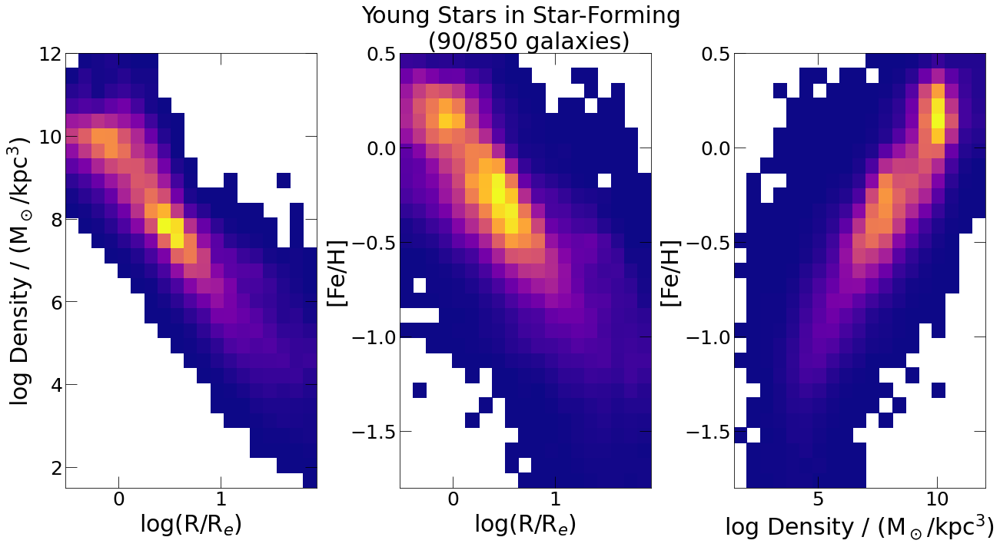

In [18]:
from matplotlib import colors
from astropy.cosmology import FlatLambdaCDM
import astropy.units as u
from astropy.constants import G, h, k_B
h = 0.6774
cosmo = FlatLambdaCDM(H0= (h * 100) * u.km / u.s / u.Mpc, Tcmb0=2.725 * u.K, Om0=0.3)

#metallicity profiles
f, (axes) = plt.subplots(1, 3, sharex='none', sharey='none', figsize=(18, 10), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]
ax3 = axes[2]
f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(0.2, 25, 30)
xbins = np.linspace(-0.52, 1.94, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(1.5, 12, 30)
metalbins = np.linspace(-1.8, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

# quicker age calculation
starFormationTime = np.linspace(0, 0.4, 1000)
starFormationRedshift = 1/starFormationTime - 1 #units:redshift
starFormationGyr = cosmo.age(starFormationRedshift).value #units:Gyr
# print(starFormationTime)
# print(starFormationRedshift)
# print(starFormationGyr)

#z=2 star-forming galaxies
big_h = np.zeros((len(xbins)-1, len(ybins)-1))
big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    logFeH, density, R = histmetals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', young=[starFormationTime, starFormationGyr])
    R_e = halfmass_rad_stars(id, redshift)
    h, _, _ = np.histogram2d(np.log10(R/R_e), np.log10(density), bins=[xbins, ybins], density=False)#, len(percentiles))
    h2, _, _ = np.histogram2d(np.log10(R/R_e), logFeH, bins=[xbins, metalbins], density=False)
    h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
    big_h3 += h3
    big_h2 += h2
    big_h += h 
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_ylim(1.5, 12)
ax1.set_xlim(-0.52, 1.94)
ax1.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_xlabel('log(R/R$_e$)', fontsize=fts)
# ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax1.set_xticks([0.2, 1, 10], minor=False)
# ax1.set_xticklabels(['0.2', '1', '10'])

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(xbins, metalbins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
ax2.set_title('Young Stars in Star-Forming \n (90/'+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax2.set_ylim(-1.8, 0.5)
ax1.set_xlim(-0.52, 1.94)
ax2.set_ylabel("[Fe/H]", fontsize=fts)
ax2.set_xlabel('log(R/R$_e$)', fontsize=fts)
# ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax2.set_xticks([0.2, 1, 10], minor=False)
# ax2.set_xticklabels(['0.2', '1', '10'])

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(densitybins2, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax3.set_xlim(1.5, 12)
ax3.set_ylim(-1.8, 0.5)
ax3.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax3.set_ylabel('[Fe/H]', fontsize=fts)
# ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

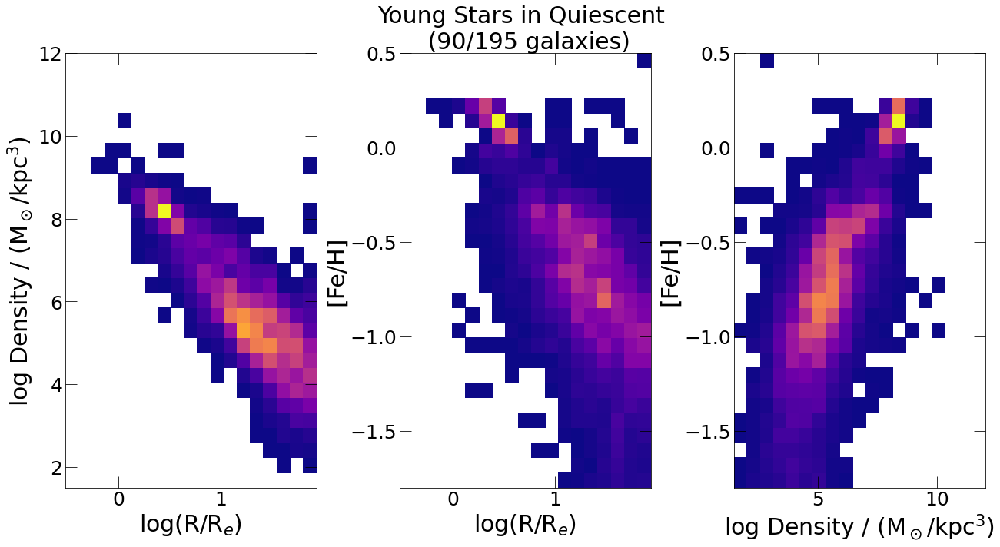

In [19]:
from matplotlib import colors
from astropy.cosmology import FlatLambdaCDM
import astropy.units as u
from astropy.constants import G, h, k_B
h = 0.6774
cosmo = FlatLambdaCDM(H0= (h * 100) * u.km / u.s / u.Mpc, Tcmb0=2.725 * u.K, Om0=0.3)

#metallicity profiles
f, (axes) = plt.subplots(1, 3, sharex='none', sharey='none', figsize=(18, 10), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]
ax3 = axes[2]
f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(0.2, 25, 30)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
xbins = np.linspace(-0.52, 1.94, 20)
ybins = np.linspace(1.5, 12, 30)
metalbins = np.linspace(-1.8, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

# quicker age calculation
starFormationTime = np.linspace(0, 0.4, 1000)
starFormationRedshift = 1/starFormationTime - 1 #units:redshift
starFormationGyr = cosmo.age(starFormationRedshift).value #units:Gyr
# print(starFormationTime)
# print(starFormationRedshift)
# print(starFormationGyr)

#z=2 star-forming galaxies
big_h = np.zeros((len(xbins)-1, len(ybins)-1))
big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    logFeH, density, R = histmetals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', young=[starFormationTime, starFormationGyr])
    R_e = halfmass_rad_stars(id, redshift)
    h, _, _ = np.histogram2d(np.log10(R/R_e), np.log10(density), bins=[xbins, ybins], density=False)#, len(percentiles))
    h2, _, _ = np.histogram2d(np.log10(R/R_e), logFeH, bins=[xbins, metalbins], density=False)
    h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
    big_h3 += h3
    big_h2 += h2
    big_h += h 
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_ylim(1.5, 12)
ax1.set_xlim(-0.52, 1.94)
ax1.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_xlabel('log(R/R$_e$)', fontsize=fts)
# ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax1.set_xticks([0.2, 1, 10], minor=False)
# ax1.set_xticklabels(['0.2', '1', '10'])

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(xbins, metalbins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
ax2.set_title('Young Stars in Quiescent \n (90/'+str(len(ids[quiescent_selection]))+' galaxies)', fontsize=fts) #
ax2.set_ylim(-1.8, 0.5)
ax1.set_xlim(-0.52, 1.94)
ax2.set_ylabel("[Fe/H]", fontsize=fts)
ax2.set_xlabel('log(R/R$_e$)', fontsize=fts)
# ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax2.set_xticks([0.2, 1, 10], minor=False)
# ax2.set_xticklabels(['0.2', '1', '10'])

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(densitybins2, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax3.set_xlim(1.5, 12)
ax3.set_ylim(-1.8, 0.5)
ax3.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax3.set_ylabel('[Fe/H]', fontsize=fts)
# ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

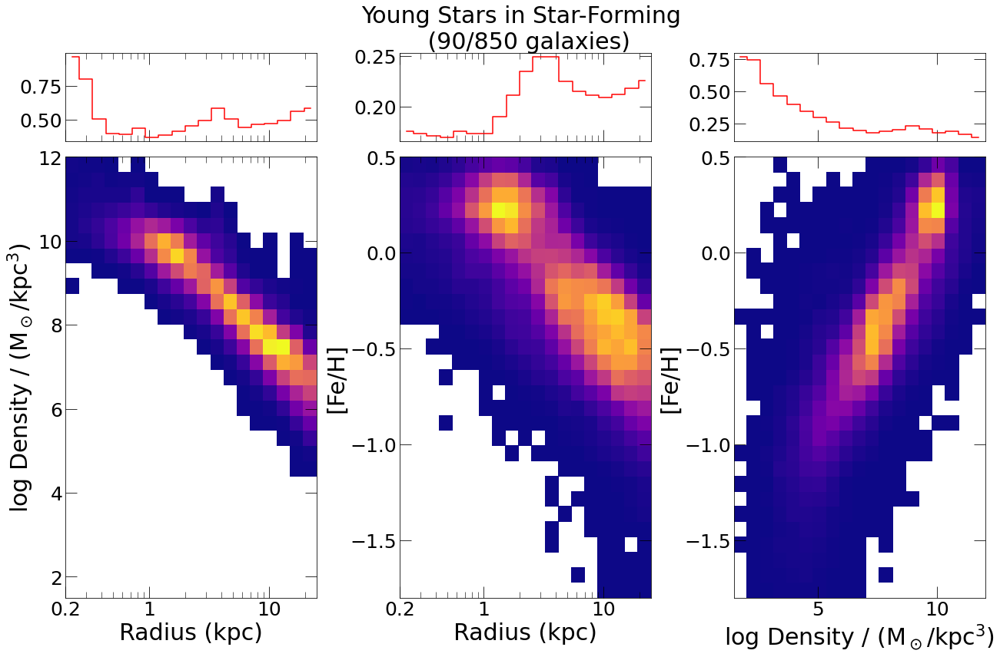

In [9]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from astropy.cosmology import FlatLambdaCDM
import astropy.units as u
from astropy.constants import G, h, k_B
h = 0.6774
cosmo = FlatLambdaCDM(H0= (h * 100) * u.km / u.s / u.Mpc, Tcmb0=2.725 * u.K, Om0=0.3)

#metallicity profiles
f, (axes) = plt.subplots(2, 3, sharex='none', sharey='none', figsize=(18, 12), gridspec_kw={'height_ratios': [1, 5]}, constrained_layout=True)
ax1 = axes[1][0]
ax2 = axes[1][1]
ax3 = axes[1][2]
sc1 = axes[0][0]
sc2 = axes[0][1]
sc3 = axes[0][2]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# quicker age calculation
starFormationTime = np.linspace(0, 0.4, 1000)
starFormationRedshift = 1/starFormationTime - 1 #units:redshift
starFormationGyr = cosmo.age(starFormationRedshift).value #units:Gyr

# xbins = np.linspace(-0.52, 1.94, 20)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(1.5, 12, 30)
metalbins = np.linspace(-1.8, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(xbins)-1, len(ybins)-1))
big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
big_density = np.zeros(0)
big_R = np.zeros(0)
big_FeH = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    logFeH, density, R = histmetals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', young=[starFormationTime, starFormationGyr])
    big_density = np.concatenate((big_density, np.log10(density)), axis=None)
    big_R = np.concatenate((big_R, R), axis=None)
    big_FeH = np.concatenate((big_FeH, logFeH), axis=None)
    h, _, _ = np.histogram2d(R, np.log10(density), bins=[xbins, ybins], density=False)#, len(percentiles))
    h2, _, _ = np.histogram2d(R, logFeH, bins=[xbins, metalbins], density=False)
    h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
    big_h3 += h3
    big_h2 += h2
    big_h += h 

# quantify scatter
xbins_new = (xbins[1:]+xbins[:-1])/2
densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
ybins_new = (ybins[1:]+ybins[:-1])/2
metalbins_new = (metalbins[1:]+metalbins[:-1])/2

stat1, _, _ = stats.binned_statistic(big_R, big_density, 'std', bins=xbins)
stat2, _, _ = stats.binned_statistic(big_R, big_FeH, 'std', bins=xbins)
stat3, _, _ = stats.binned_statistic(big_density, big_FeH, 'std', bins=densitybins2)

sc1.step(xbins_new, stat1, 'r', where='mid')
sc2.step(xbins_new, stat2, 'r', where='mid')
sc3.step(densitybins2_new, stat3, 'r', where='mid')

# plot big pixel maps
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[0].set_xlim(0.2, 25)
    ax[0].set_xscale('log')
    ax[0].set_xticks([0.2, 1, 10], minor=False)
    ax[0].set_xticklabels(['0.2', '1', '10'])
    ax[0].tick_params(which='major', length=15)
    ax[0].tick_params(which='minor', length=8)
    ax[0].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(1.5, 12)
ax1.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(xbins, metalbins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
for ax in axes:
    ax[1].set_xlim(0.2, 25)
    ax[1].set_xscale('log')
    ax[1].set_xticks([0.2, 1, 10], minor=False)
    ax[1].set_xticklabels(['0.2', '1', '10'])
    ax[1].tick_params(which='major', length=15)
    ax[1].tick_params(which='minor', length=8)
    ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-1.8, 0.5)
ax2.set_ylabel("[Fe/H]", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(densitybins2, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[2].set_xlim(1.5, 12)
    ax[2].tick_params(which='major', length=15)
    ax[2].tick_params(which='minor', length=8)
    ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax3.set_ylabel('[Fe/H]', fontsize=fts)
ax3.set_ylim(-1.8, 0.5)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

sc2.set_title('Young Stars in Star-Forming \n (90/'+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts)

for ax in axes[0]:
    ax.set_xticklabels([])

f.tight_layout()

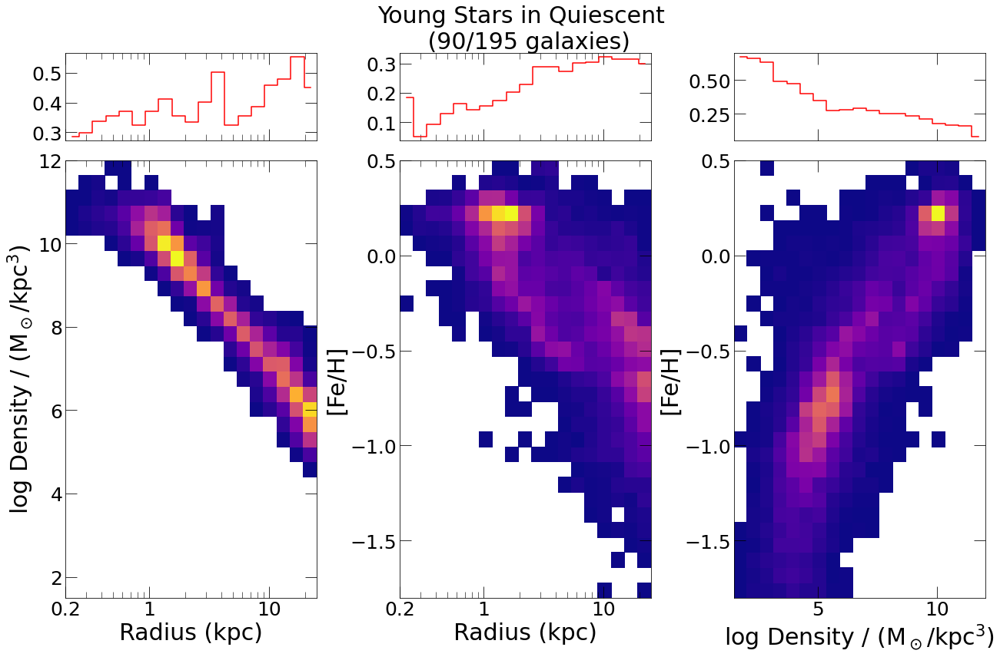

In [14]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from astropy.cosmology import FlatLambdaCDM
import astropy.units as u
from astropy.constants import G, h, k_B
h = 0.6774
cosmo = FlatLambdaCDM(H0= (h * 100) * u.km / u.s / u.Mpc, Tcmb0=2.725 * u.K, Om0=0.3)

#metallicity profiles
f, (axes) = plt.subplots(2, 3, sharex='none', sharey='none', figsize=(18, 12), gridspec_kw={'height_ratios': [1, 5]}, constrained_layout=True)
ax1 = axes[1][0]
ax2 = axes[1][1]
ax3 = axes[1][2]
sc1 = axes[0][0]
sc2 = axes[0][1]
sc3 = axes[0][2]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# quicker age calculation
starFormationTime = np.linspace(0, 0.4, 1000)
starFormationRedshift = 1/starFormationTime - 1 #units:redshift
starFormationGyr = cosmo.age(starFormationRedshift).value #units:Gyr

# xbins = np.linspace(-0.52, 1.94, 20)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(1.5, 12, 30)
metalbins = np.linspace(-1.8, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(xbins)-1, len(ybins)-1))
big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
big_density = np.zeros(0)
big_R = np.zeros(0)
big_FeH = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    logFeH, density, R = histmetals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', young=[starFormationTime, starFormationGyr])
    big_density = np.concatenate((big_density, np.log10(density)), axis=None)
    big_R = np.concatenate((big_R, R), axis=None)
    big_FeH = np.concatenate((big_FeH, logFeH), axis=None)
    h, _, _ = np.histogram2d(R, np.log10(density), bins=[xbins, ybins], density=False)#, len(percentiles))
    h2, _, _ = np.histogram2d(R, logFeH, bins=[xbins, metalbins], density=False)
    h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
    big_h3 += h3
    big_h2 += h2
    big_h += h 

# quantify scatter
xbins_new = (xbins[1:]+xbins[:-1])/2
densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
ybins_new = (ybins[1:]+ybins[:-1])/2
metalbins_new = (metalbins[1:]+metalbins[:-1])/2

stat1, _, _ = stats.binned_statistic(big_R, big_density, 'std', bins=xbins)
stat2, _, _ = stats.binned_statistic(big_R, big_FeH, 'std', bins=xbins)
stat3, _, _ = stats.binned_statistic(big_density, big_FeH, 'std', bins=densitybins2)

sc1.step(xbins_new, stat1, 'r', where='mid')
sc2.step(xbins_new, stat2, 'r', where='mid')
sc3.step(densitybins2_new, stat3, 'r', where='mid')

# plot big pixel maps
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[0].set_xlim(0.2, 25)
    ax[0].set_xscale('log')
    ax[0].set_xticks([0.2, 1, 10], minor=False)
    ax[0].set_xticklabels(['0.2', '1', '10'])
    ax[0].tick_params(which='major', length=15)
    ax[0].tick_params(which='minor', length=8)
    ax[0].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(1.5, 12)
ax1.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(xbins, metalbins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
for ax in axes:
    ax[1].set_xlim(0.2, 25)
    ax[1].set_xscale('log')
    ax[1].set_xticks([0.2, 1, 10], minor=False)
    ax[1].set_xticklabels(['0.2', '1', '10'])
    ax[1].tick_params(which='major', length=15)
    ax[1].tick_params(which='minor', length=8)
    ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-1.8, 0.5)
ax2.set_ylabel("[Fe/H]", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(densitybins2, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[2].set_xlim(1.5, 12)
    ax[2].tick_params(which='major', length=15)
    ax[2].tick_params(which='minor', length=8)
    ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax3.set_ylabel('[Fe/H]', fontsize=fts)
ax3.set_ylim(-1.8, 0.5)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

sc2.set_title('Young Stars in Quiescent \n (90/'+str(len(ids[quiescent_selection]))+' galaxies)', fontsize=fts)

for ax in axes[0]:
    ax.set_xticklabels([])

f.tight_layout()

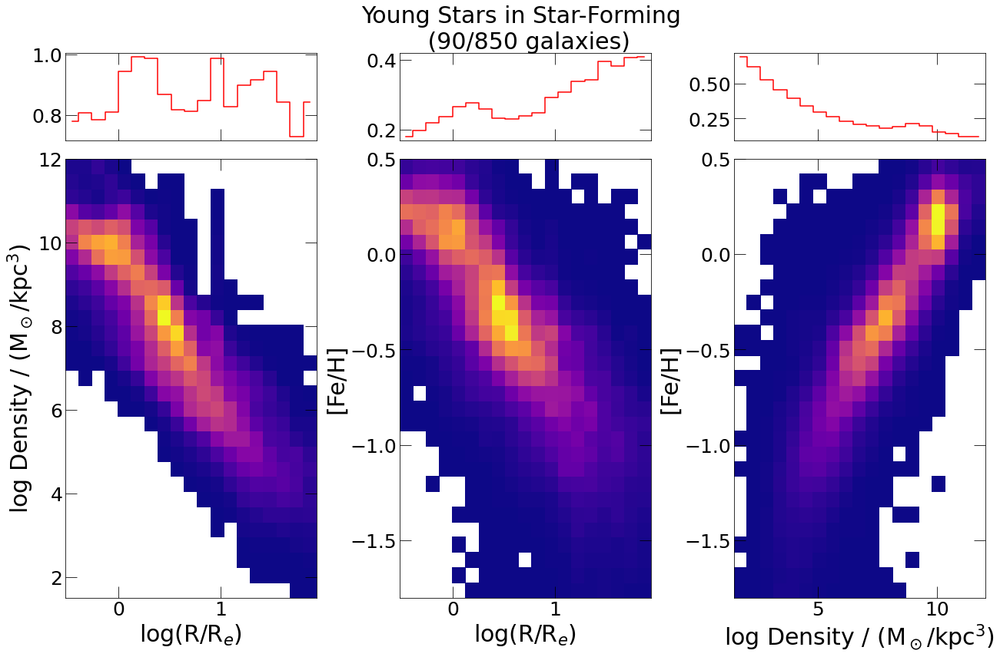

In [12]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from astropy.cosmology import FlatLambdaCDM
import astropy.units as u
from astropy.constants import G, h, k_B
h = 0.6774
cosmo = FlatLambdaCDM(H0= (h * 100) * u.km / u.s / u.Mpc, Tcmb0=2.725 * u.K, Om0=0.3)

#metallicity profiles
f, (axes) = plt.subplots(2, 3, sharex='none', sharey='none', figsize=(18, 12), gridspec_kw={'height_ratios': [1, 5]}, constrained_layout=True)
ax1 = axes[1][0]
ax2 = axes[1][1]
ax3 = axes[1][2]
sc1 = axes[0][0]
sc2 = axes[0][1]
sc3 = axes[0][2]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# quicker age calculation
starFormationTime = np.linspace(0, 0.4, 1000)
starFormationRedshift = 1/starFormationTime - 1 #units:redshift
starFormationGyr = cosmo.age(starFormationRedshift).value #units:Gyr

# xbins = np.linspace(-0.52, 1.94, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
xbins = np.linspace(-0.52, 1.94, 20)
ybins = np.linspace(1.5, 12, 30)
metalbins = np.linspace(-1.8, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(xbins)-1, len(ybins)-1))
big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
big_density = np.zeros(0)
big_R = np.zeros(0)
big_FeH = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    logFeH, density, R = histmetals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', young=[starFormationTime, starFormationGyr])
    R_e = halfmass_rad_stars(id, redshift)
    big_density = np.concatenate((big_density, np.log10(density)), axis=None)
    big_R = np.concatenate((big_R, np.log10(R/R_e)), axis=None)
    big_FeH = np.concatenate((big_FeH, logFeH), axis=None)
    h, _, _ = np.histogram2d(np.log10(R/R_e), np.log10(density), bins=[xbins, ybins], density=False)#, len(percentiles))
    h2, _, _ = np.histogram2d(np.log10(R/R_e), logFeH, bins=[xbins, metalbins], density=False)
    h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
    big_h3 += h3
    big_h2 += h2
    big_h += h 

# quantify scatter
xbins_new = (xbins[1:]+xbins[:-1])/2
densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
ybins_new = (ybins[1:]+ybins[:-1])/2
metalbins_new = (metalbins[1:]+metalbins[:-1])/2

stat1, _, _ = stats.binned_statistic(big_R, big_density, 'std', bins=xbins)
stat2, _, _ = stats.binned_statistic(big_R, big_FeH, 'std', bins=xbins)
stat3, _, _ = stats.binned_statistic(big_density, big_FeH, 'std', bins=densitybins2)

sc1.step(xbins_new, stat1, 'r', where='mid')
sc2.step(xbins_new, stat2, 'r', where='mid')
sc3.step(densitybins2_new, stat3, 'r', where='mid')

# plot big pixel maps
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[0].set_xlim(-0.52, 1.94)
#     ax[0].set_xscale('log')
#     ax[0].set_xticks([0.2, 1, 10], minor=False)
#     ax[0].set_xticklabels(['0.2', '1', '10'])
    ax[0].tick_params(which='major', length=15)
    ax[0].tick_params(which='minor', length=8)
    ax[0].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(1.5, 12)
ax1.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_xlabel('log(R/R$_e$)', fontsize=fts)

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(xbins, metalbins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
for ax in axes:
    ax[1].set_xlim(-0.52, 1.94)
#     ax[1].set_xscale('log')
#     ax[1].set_xticks([0.2, 1, 10], minor=False)
#     ax[1].set_xticklabels(['0.2', '1', '10'])
    ax[1].tick_params(which='major', length=15)
    ax[1].tick_params(which='minor', length=8)
    ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-1.8, 0.5)
ax2.set_ylabel("[Fe/H]", fontsize=fts)
ax2.set_xlabel('log(R/R$_e$)', fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(densitybins2, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[2].set_xlim(1.5, 12)
    ax[2].tick_params(which='major', length=15)
    ax[2].tick_params(which='minor', length=8)
    ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax3.set_ylabel('[Fe/H]', fontsize=fts)
ax3.set_ylim(-1.8, 0.5)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

sc2.set_title('Young Stars in Star-Forming \n (90/'+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts)

for ax in axes[0]:
    ax.set_xticklabels([])

f.tight_layout()

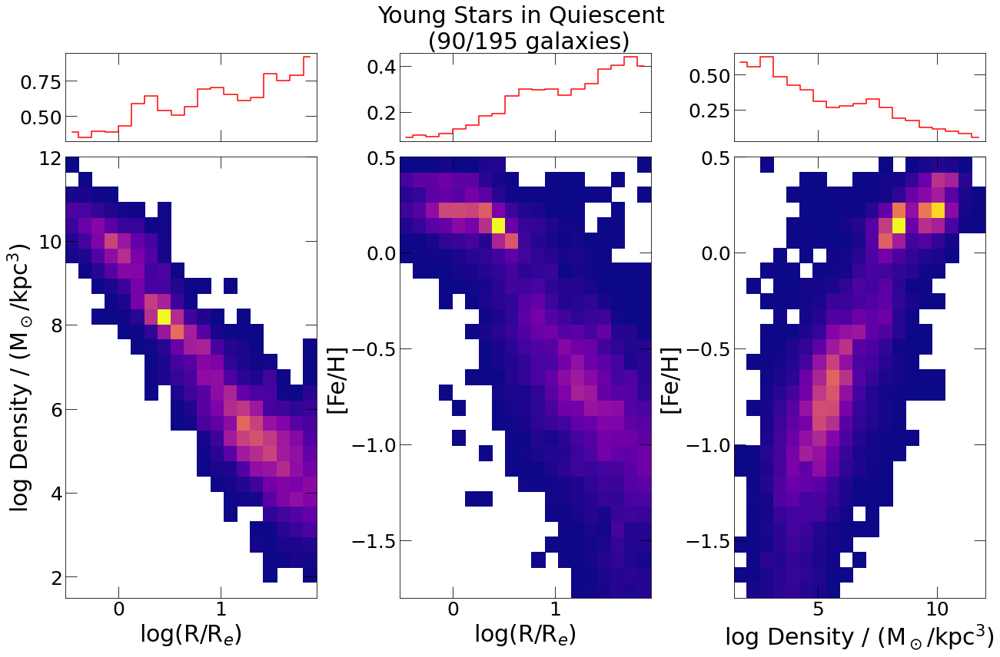

In [13]:
from matplotlib import colors
from scipy import stats
from scipy.stats import norm as normie
from astropy.cosmology import FlatLambdaCDM
import astropy.units as u
from astropy.constants import G, h, k_B
h = 0.6774
cosmo = FlatLambdaCDM(H0= (h * 100) * u.km / u.s / u.Mpc, Tcmb0=2.725 * u.K, Om0=0.3)

#metallicity profiles
f, (axes) = plt.subplots(2, 3, sharex='none', sharey='none', figsize=(18, 12), gridspec_kw={'height_ratios': [1, 5]}, constrained_layout=True)
ax1 = axes[1][0]
ax2 = axes[1][1]
ax3 = axes[1][2]
sc1 = axes[0][0]
sc2 = axes[0][1]
sc3 = axes[0][2]

f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# quicker age calculation
starFormationTime = np.linspace(0, 0.4, 1000)
starFormationRedshift = 1/starFormationTime - 1 #units:redshift
starFormationGyr = cosmo.age(starFormationRedshift).value #units:Gyr

# xbins = np.linspace(-0.52, 1.94, 20)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
xbins = np.linspace(-0.52, 1.94, 20)
ybins = np.linspace(1.5, 12, 30)
metalbins = np.linspace(-1.8, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(xbins)-1, len(ybins)-1))
big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
big_density = np.zeros(0)
big_R = np.zeros(0)
big_FeH = np.zeros(0)
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    logFeH, density, R = histmetals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', young=[starFormationTime, starFormationGyr])
    R_e = halfmass_rad_stars(id, redshift)
    big_density = np.concatenate((big_density, np.log10(density)), axis=None)
    big_R = np.concatenate((big_R, np.log10(R/R_e)), axis=None)
    big_FeH = np.concatenate((big_FeH, logFeH), axis=None)
    h, _, _ = np.histogram2d(np.log10(R/R_e), np.log10(density), bins=[xbins, ybins], density=False)#, len(percentiles))
    h2, _, _ = np.histogram2d(np.log10(R/R_e), logFeH, bins=[xbins, metalbins], density=False)
    h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
    big_h3 += h3
    big_h2 += h2
    big_h += h 

# quantify scatter
xbins_new = (xbins[1:]+xbins[:-1])/2
densitybins2_new = (densitybins2[1:]+densitybins2[:-1])/2
ybins_new = (ybins[1:]+ybins[:-1])/2
metalbins_new = (metalbins[1:]+metalbins[:-1])/2

stat1, _, _ = stats.binned_statistic(big_R, big_density, 'std', bins=xbins)
stat2, _, _ = stats.binned_statistic(big_R, big_FeH, 'std', bins=xbins)
stat3, _, _ = stats.binned_statistic(big_density, big_FeH, 'std', bins=densitybins2)

sc1.step(xbins_new, stat1, 'r', where='mid')
sc2.step(xbins_new, stat2, 'r', where='mid')
sc3.step(densitybins2_new, stat3, 'r', where='mid')

# plot big pixel maps
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[0].set_xlim(-0.52, 1.94)
#     ax[0].set_xscale('log')
#     ax[0].set_xticks([0.2, 1, 10], minor=False)
#     ax[0].set_xticklabels(['0.2', '1', '10'])
    ax[0].tick_params(which='major', length=15)
    ax[0].tick_params(which='minor', length=8)
    ax[0].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_ylim(1.5, 12)
ax1.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_xlabel('log(R/R$_e$)', fontsize=fts)

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(xbins, metalbins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
for ax in axes:
    ax[1].set_xlim(-0.52, 1.94)
#     ax[1].set_xscale('log')
#     ax[1].set_xticks([0.2, 1, 10], minor=False)
#     ax[1].set_xticklabels(['0.2', '1', '10'])
    ax[1].tick_params(which='major', length=15)
    ax[1].tick_params(which='minor', length=8)
    ax[1].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_ylim(-1.8, 0.5)
ax2.set_ylabel("[Fe/H]", fontsize=fts)
ax2.set_xlabel('log(R/R$_e$)', fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(densitybins2, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
for ax in axes:
    ax[2].set_xlim(1.5, 12)
    ax[2].tick_params(which='major', length=15)
    ax[2].tick_params(which='minor', length=8)
    ax[2].tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax3.set_ylabel('[Fe/H]', fontsize=fts)
ax3.set_ylim(-1.8, 0.5)
# ax3.set_xscale('log')
# ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

sc2.set_title('Young Stars in Quiescent \n (90/'+str(len(ids[quiescent_selection]))+' galaxies)', fontsize=fts)

for ax in axes[0]:
    ax.set_xticklabels([])

f.tight_layout()

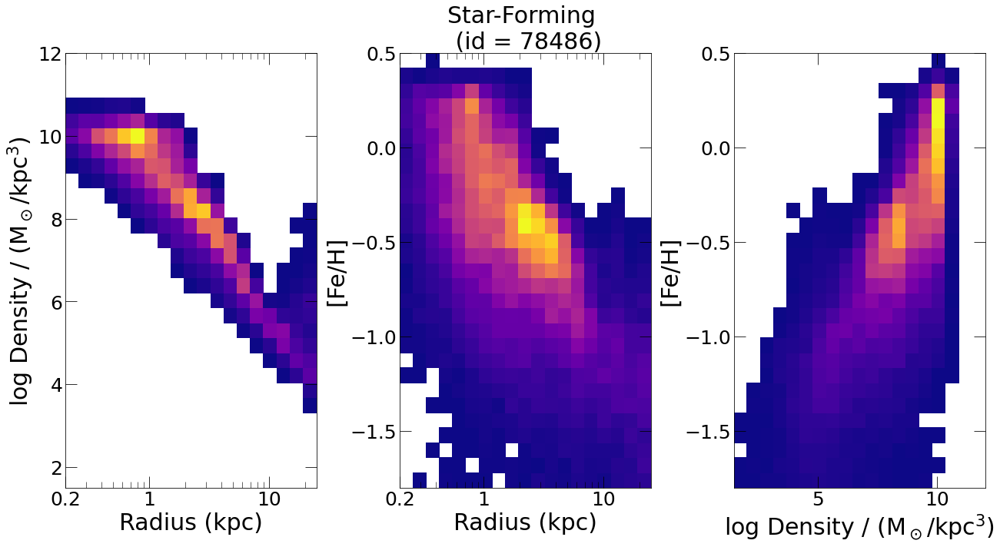

In [4]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 3, sharex='none', sharey='none', figsize=(18, 10), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]
ax3 = axes[2]
f.set_facecolor('w')
n_bins = 50
redshift = 2
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(0.2, 25, 30)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(1.5, 12, 30)
metalbins = np.linspace(-1.8, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(xbins)-1, len(ybins)-1))
big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
for id in np.random.choice(ids[starforming_selection], 1, replace=False):
    logFeH, density, R = histmetals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    h, _, _ = np.histogram2d(R, np.log10(density), bins=[xbins, ybins], density=False)#, len(percentiles))
    h2, _, _ = np.histogram2d(R, logFeH, bins=[xbins, metalbins], density=False)
    h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
    big_h3 += h3
    big_h2 += h2
    big_h += h 
    number = id
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_ylim(1.5, 12)
ax1.set_xlim(0.2, 25)
ax1.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(xbins, metalbins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
ax2.set_title('Star-Forming \n (id = '+str(number)+')', fontsize=fts) #
ax2.set_ylim(-1.8, 0.5)
ax2.set_xlim(0.2, 25)
ax2.set_ylabel("[Fe/H]", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(densitybins2, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax3.set_xlim(1.5, 12)
ax3.set_ylim(-1.8, 0.5)
ax3.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax3.set_ylabel('[Fe/H]', fontsize=fts)
# ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

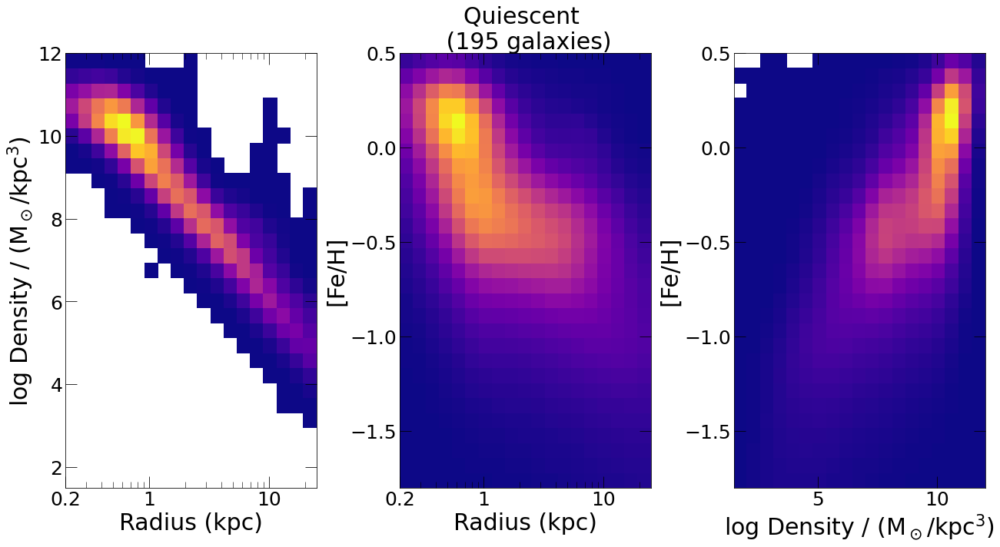

In [18]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 3, sharex='none', sharey='none', figsize=(18, 10), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]
ax3 = axes[2]
f.set_facecolor('w')
n_bins = 50
redshift = 2
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(0.2, 25, 30)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(1.5, 12, 30)
metalbins = np.linspace(-1.8, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(xbins)-1, len(ybins)-1))
big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    logFeH, density, R = histmetals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    h, _, _ = np.histogram2d(R, np.log10(density), bins=[xbins, ybins], density=False)#, len(percentiles))
    h2, _, _ = np.histogram2d(R, logFeH, bins=[xbins, metalbins], density=False)
    h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
    big_h3 += h3
    big_h2 += h2
    big_h += h 
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_ylim(1.5, 12)
ax1.set_xlim(0.2, 25)
ax1.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(xbins, metalbins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
ax2.set_title('Quiescent \n ('+str(len(ids[quiescent_selection]))+' galaxies)', fontsize=fts) #
ax2.set_ylim(-1.8, 0.5)
ax2.set_xlim(0.2, 25)
ax2.set_ylabel("[Fe/H]", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(densitybins2, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax3.set_xlim(1.5, 12)
ax3.set_ylim(-1.8, 0.5)
ax3.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax3.set_ylabel('[Fe/H]', fontsize=fts)
# ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

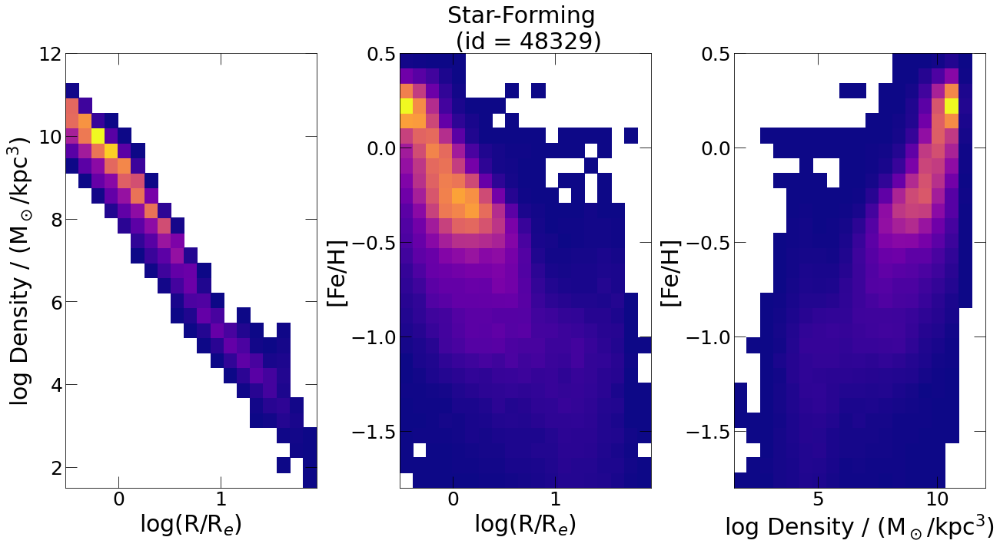

In [4]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 3, sharex='none', sharey='none', figsize=(18, 10), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]
ax3 = axes[2]
f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

xbins = np.linspace(-0.52, 1.94, 20)
# xbins = np.logspace(np.log10(-0.52), np.log10(1.94), 20)
ybins = np.linspace(1.5, 12, 30)
metalbins = np.linspace(-1.8, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

np.random.seed(0)

#z=2 star-forming galaxies
big_h = np.zeros((len(xbins)-1, len(ybins)-1))
big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
for id in np.random.choice(ids[starforming_selection], 1, replace=False):
    logFeH, density, R = histmetals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    R_e = halfmass_rad_stars(id, redshift)
    h, _, _ = np.histogram2d(np.log10(R/R_e), np.log10(density), bins=[xbins, ybins], density=False)#, len(percentiles))
    h2, _, _ = np.histogram2d(np.log10(R/R_e), logFeH, bins=[xbins, metalbins], density=False)
    h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
    big_h3 += h3
    big_h2 += h2
    big_h += h 
    number = id
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_ylim(1.5, 12)
ax1.set_xlim(-0.52, 1.94)
ax1.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_xlabel('log(R/R$_e$)', fontsize=fts)
# ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax1.set_xticks([0.2, 1, 10], minor=False)
# ax1.set_xticklabels(['0.2', '1', '10'])

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(xbins, metalbins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
ax2.set_title('Star-Forming \n (id = '+str(number)+')', fontsize=fts) #
ax2.set_ylim(-1.8, 0.5)
ax2.set_xlim(-0.52, 1.94)
ax2.set_ylabel("[Fe/H]", fontsize=fts)
ax2.set_xlabel('log(R/R$_e$)', fontsize=fts)
# ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax2.set_xticks([0.2, 1, 10], minor=False)
# ax2.set_xticklabels(['0.2', '1', '10'])

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(densitybins2, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax3.set_xlim(1.5, 12)
ax3.set_ylim(-1.8, 0.5)
ax3.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax3.set_ylabel('[Fe/H]', fontsize=fts)
# ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

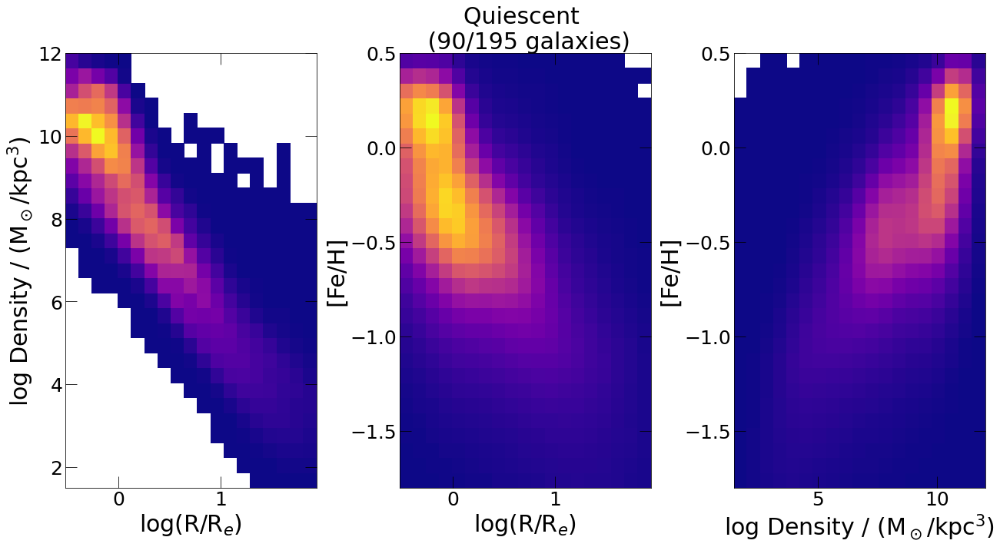

In [4]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 3, sharex='none', sharey='none', figsize=(18, 10), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]
ax3 = axes[2]
f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

xbins = np.linspace(-0.52, 1.94, 20)
# xbins = np.logspace(np.log10(-0.52), np.log10(1.94), 20)
ybins = np.linspace(1.5, 12, 30)
metalbins = np.linspace(-1.8, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(xbins)-1, len(ybins)-1))
big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    logFeH, density, R = histmetals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    R_e = halfmass_rad_stars(id, redshift)
    h, _, _ = np.histogram2d(np.log10(R/R_e), np.log10(density), bins=[xbins, ybins], density=False)#, len(percentiles))
    h2, _, _ = np.histogram2d(np.log10(R/R_e), logFeH, bins=[xbins, metalbins], density=False)
    h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
    big_h3 += h3
    big_h2 += h2
    big_h += h 
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_ylim(1.5, 12)
ax1.set_xlim(-0.52, 1.94)
ax1.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_xlabel('log(R/R$_e$)', fontsize=fts)
# ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax1.set_xticks([0.2, 1, 10], minor=False)
# ax1.set_xticklabels(['0.2', '1', '10'])

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(xbins, metalbins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
ax2.set_title('Quiescent \n (90/'+str(len(ids[quiescent_selection]))+' galaxies)', fontsize=fts) #
ax2.set_ylim(-1.8, 0.5)
ax2.set_xlim(-0.52, 1.94)
ax2.set_ylabel("[Fe/H]", fontsize=fts)
ax2.set_xlabel('log(R/R$_e$)', fontsize=fts)
# ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
# ax2.set_xticks([0.2, 1, 10], minor=False)
# ax2.set_xticklabels(['0.2', '1', '10'])

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(densitybins2, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax3.set_xlim(1.5, 12)
ax3.set_ylim(-1.8, 0.5)
ax3.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax3.set_ylabel('[Fe/H]', fontsize=fts)
# ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

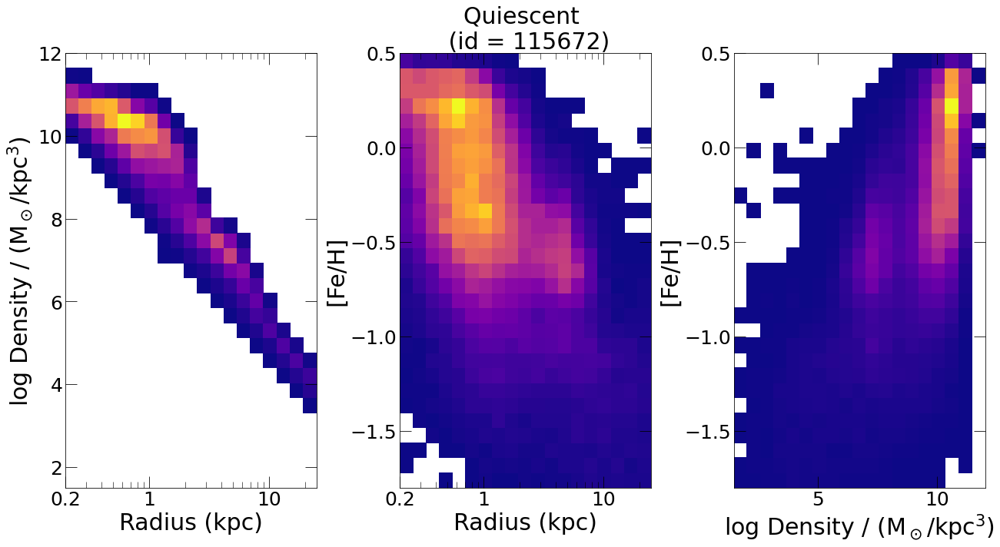

In [4]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 3, sharex='none', sharey='none', figsize=(18, 10), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]
ax3 = axes[2]
f.set_facecolor('w')
n_bins = 50
redshift = 2
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(0.2, 25, 30)
xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
ybins = np.linspace(1.5, 12, 30)
metalbins = np.linspace(-1.8, 0.5, 30)
densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(xbins)-1, len(ybins)-1))
big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
for id in np.random.choice(ids[quiescent_selection], 1, replace=False):
    logFeH, density, R = histmetals_density_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    h, _, _ = np.histogram2d(R, np.log10(density), bins=[xbins, ybins], density=False)#, len(percentiles))
    h2, _, _ = np.histogram2d(R, logFeH, bins=[xbins, metalbins], density=False)
    h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
    big_h3 += h3
    big_h2 += h2
    big_h += h 
    number=id
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(xbins, ybins, big_h.T, cmap='plasma', color=color, edgecolor=None)
# ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_ylim(1.5, 12)
ax1.set_xlim(0.2, 25)
ax1.set_ylabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax1.set_xlabel('Radius (kpc)', fontsize=fts)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(xbins, metalbins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
ax2.set_title('Quiescent \n (id = '+str(number)+')', fontsize=fts) #
ax2.set_ylim(-1.8, 0.5)
ax2.set_xlim(0.2, 25)
ax2.set_ylabel("[Fe/H]", fontsize=fts)
ax2.set_xlabel('Radius (kpc)', fontsize=fts)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(densitybins2, metalbins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
# ax3.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax3.set_xlim(1.5, 12)
ax3.set_ylim(-1.8, 0.5)
ax3.set_xlabel("log Density / (M$_\odot$/kpc$^3$)", fontsize=fts)
ax3.set_ylabel('[Fe/H]', fontsize=fts)
# ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

# Age

## [Fe/H]

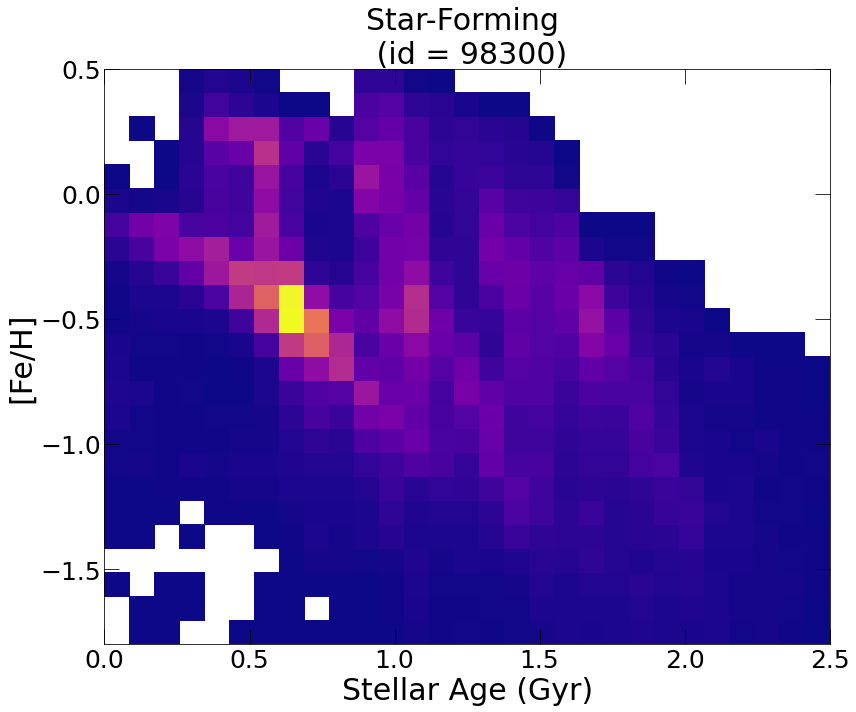

In [8]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(12, 10), constrained_layout=True)
ax1 = axes
f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(0.2, 25, 30)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
agebins = np.linspace(0, 2.5, 30)
metalbins = np.linspace(-1.8, 0.5, 25)
# densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(agebins)-1, len(metalbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
for id in np.random.choice(ids[starforming_selection], 1, replace=False):
    logFeH, age = metals_profile(id=id, redshift=redshift, num='iron', den='hydrogen', axis='age', only_particles=True)
    h, _, _ = np.histogram2d(age, logFeH, bins=[agebins, metalbins], density=False)#, len(percentiles))
#     h2, _, _ = np.histogram2d(R, logFeH, bins=[xbins, metalbins], density=False)
#     h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
#     big_h3 += h3
#     big_h2 += h2
    big_h += h 
    number = id
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(agebins, metalbins, big_h.T, cmap='plasma', color=color, edgecolor=None)
ax1.set_title('Star-Forming \n (id = '+str(number)+')', fontsize=fts) #
ax1.set_ylim(-1.8, 0.5)
ax1.set_xlim(0.0, 2.5)
ax1.set_ylabel("[Fe/H]", fontsize=fts)
ax1.set_xlabel('Stellar Age (Gyr)', fontsize=fts)
# ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

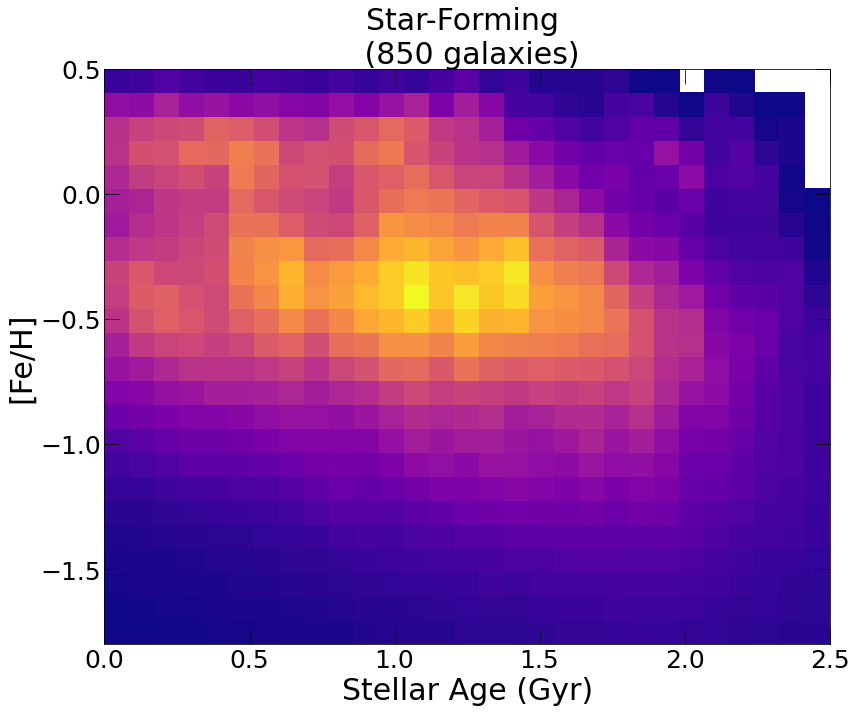

In [9]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(12, 10), constrained_layout=True)
ax1 = axes
f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(0.2, 25, 30)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
agebins = np.linspace(0, 2.5, 30)
metalbins = np.linspace(-1.8, 0.5, 25)
# densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(agebins)-1, len(metalbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    logFeH, age = metals_profile(id=id, redshift=redshift, num='iron', den='hydrogen', axis='age', only_particles=True)
    h, _, _ = np.histogram2d(age, logFeH, bins=[agebins, metalbins], density=False)#, len(percentiles))
#     h2, _, _ = np.histogram2d(R, logFeH, bins=[xbins, metalbins], density=False)
#     h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
#     big_h3 += h3
#     big_h2 += h2
    big_h += h 
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(agebins, metalbins, big_h.T, cmap='plasma', color=color, edgecolor=None)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_ylim(-1.8, 0.5)
ax1.set_xlim(0.0, 2.5)
ax1.set_ylabel("[Fe/H]", fontsize=fts)
ax1.set_xlabel('Stellar Age (Gyr)', fontsize=fts)
# ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

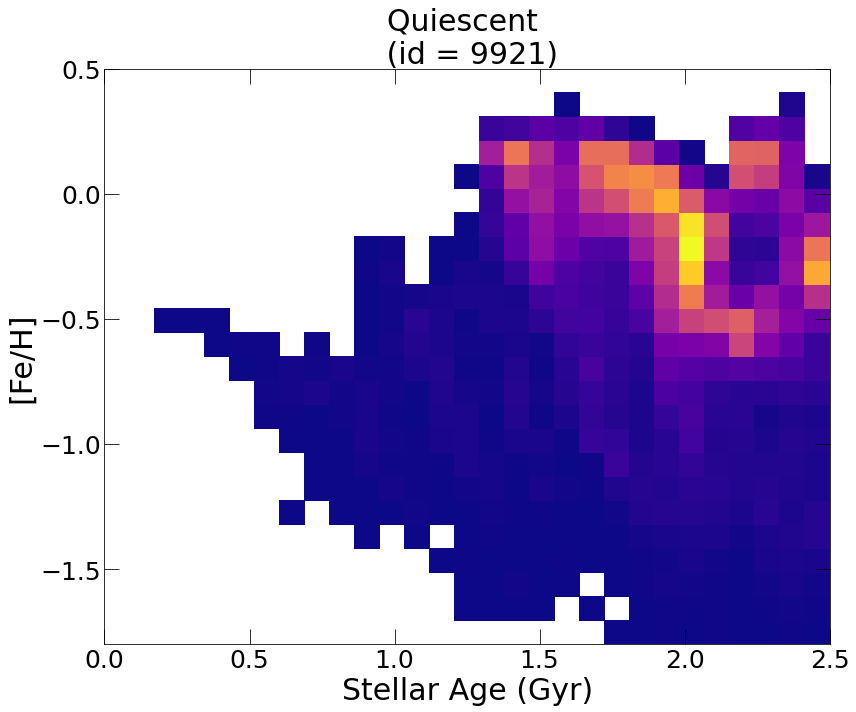

In [10]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(12, 10), constrained_layout=True)
ax1 = axes
f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(0.2, 25, 30)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
agebins = np.linspace(0, 2.5, 30)
metalbins = np.linspace(-1.8, 0.5, 25)
# densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(agebins)-1, len(metalbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
for id in np.random.choice(ids[quiescent_selection], 1, replace=False):
    logFeH, age = metals_profile(id=id, redshift=redshift, num='iron', den='hydrogen', axis='age', only_particles=True)
    h, _, _ = np.histogram2d(age, logFeH, bins=[agebins, metalbins], density=False)#, len(percentiles))
#     h2, _, _ = np.histogram2d(R, logFeH, bins=[xbins, metalbins], density=False)
#     h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
#     big_h3 += h3
#     big_h2 += h2
    big_h += h 
    number = id
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(agebins, metalbins, big_h.T, cmap='plasma', color=color, edgecolor=None)
ax1.set_title('Quiescent \n (id = '+str(number)+')', fontsize=fts) #
ax1.set_ylim(-1.8, 0.5)
ax1.set_xlim(0.0, 2.5)
ax1.set_ylabel("[Fe/H]", fontsize=fts)
ax1.set_xlabel('Stellar Age (Gyr)', fontsize=fts)
# ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

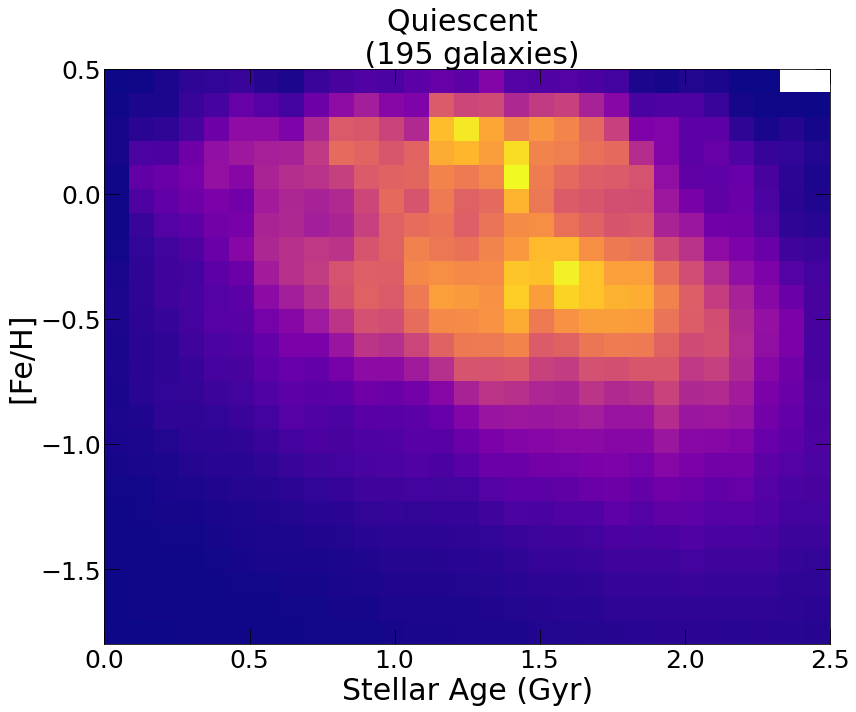

In [11]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(12, 10), constrained_layout=True)
ax1 = axes
f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(0.2, 25, 30)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
agebins = np.linspace(0, 2.5, 30)
metalbins = np.linspace(-1.8, 0.5, 25)
# densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(agebins)-1, len(metalbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    logFeH, age = metals_profile(id=id, redshift=redshift, num='iron', den='hydrogen', axis='age', only_particles=True)
    h, _, _ = np.histogram2d(age, logFeH, bins=[agebins, metalbins], density=False)#, len(percentiles))
#     h2, _, _ = np.histogram2d(R, logFeH, bins=[xbins, metalbins], density=False)
#     h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
#     big_h3 += h3
#     big_h2 += h2
    big_h += h 
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(agebins, metalbins, big_h.T, cmap='plasma', color=color, edgecolor=None)
ax1.set_title('Quiescent \n ('+str(len(ids[quiescent_selection]))+' galaxies)', fontsize=fts) #
ax1.set_ylim(-1.8, 0.5)
ax1.set_xlim(0.0, 2.5)
ax1.set_ylabel("[Fe/H]", fontsize=fts)
ax1.set_xlabel('Stellar Age (Gyr)', fontsize=fts)
# ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

## [Mg/H]

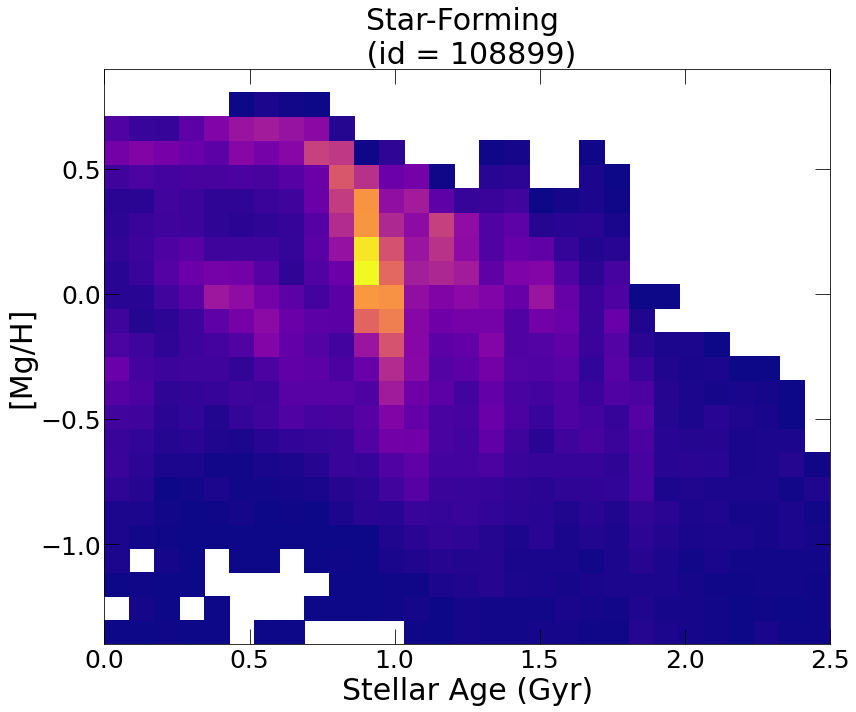

In [17]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(12, 10), constrained_layout=True)
ax1 = axes
f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(0.2, 25, 30)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
agebins = np.linspace(0, 2.5, 30)
metalbins = np.linspace(-1.4, 0.9, 25)
# densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(agebins)-1, len(metalbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
for id in np.random.choice(ids[starforming_selection], 1, replace=False):
    logFeH, age = metals_profile(id=id, redshift=redshift, num='magnesium', den='hydrogen', axis='age', only_particles=True)
    h, _, _ = np.histogram2d(age, logFeH, bins=[agebins, metalbins], density=False)#, len(percentiles))
#     h2, _, _ = np.histogram2d(R, logFeH, bins=[xbins, metalbins], density=False)
#     h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
#     big_h3 += h3
#     big_h2 += h2
    big_h += h 
    number = id
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(agebins, metalbins, big_h.T, cmap='plasma', color=color, edgecolor=None)
ax1.set_title('Star-Forming \n (id = '+str(number)+')', fontsize=fts) #
ax1.set_ylim(-1.4, 0.9)
ax1.set_xlim(0.0, 2.5)
ax1.set_ylabel("[Mg/H]", fontsize=fts)
ax1.set_xlabel('Stellar Age (Gyr)', fontsize=fts)
# ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

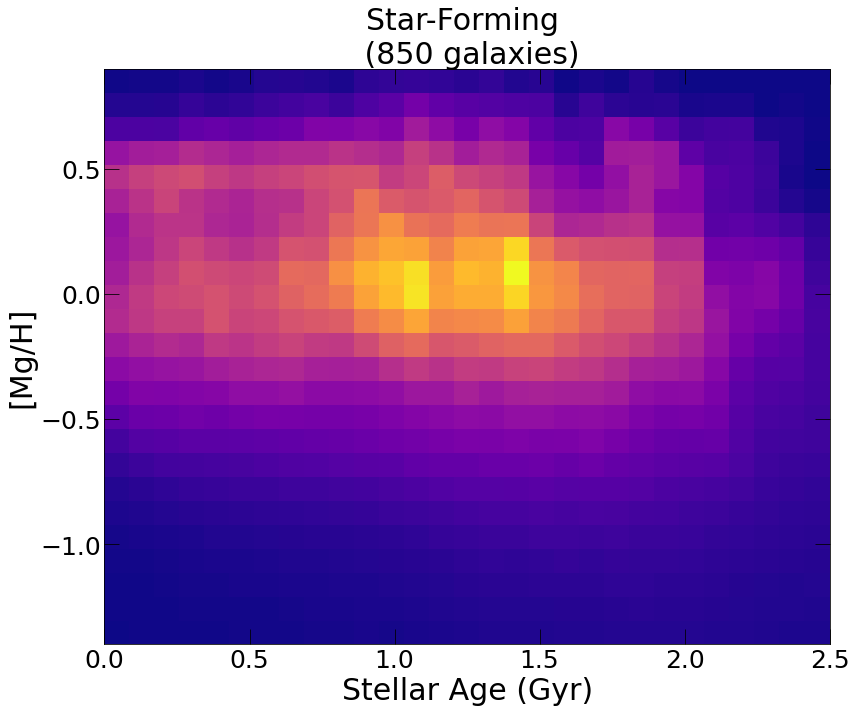

In [18]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(12, 10), constrained_layout=True)
ax1 = axes
f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(0.2, 25, 30)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
agebins = np.linspace(0, 2.5, 30)
metalbins = np.linspace(-1.4, 0.9, 25)
# densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(agebins)-1, len(metalbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    logFeH, age = metals_profile(id=id, redshift=redshift, num='magnesium', den='hydrogen', axis='age', only_particles=True)
    h, _, _ = np.histogram2d(age, logFeH, bins=[agebins, metalbins], density=False)#, len(percentiles))
#     h2, _, _ = np.histogram2d(R, logFeH, bins=[xbins, metalbins], density=False)
#     h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
#     big_h3 += h3
#     big_h2 += h2
    big_h += h 
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(agebins, metalbins, big_h.T, cmap='plasma', color=color, edgecolor=None)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_ylim(-1.4, 0.9)
ax1.set_xlim(0.0, 2.5)
ax1.set_ylabel("[Mg/H]", fontsize=fts)
ax1.set_xlabel('Stellar Age (Gyr)', fontsize=fts)
# ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

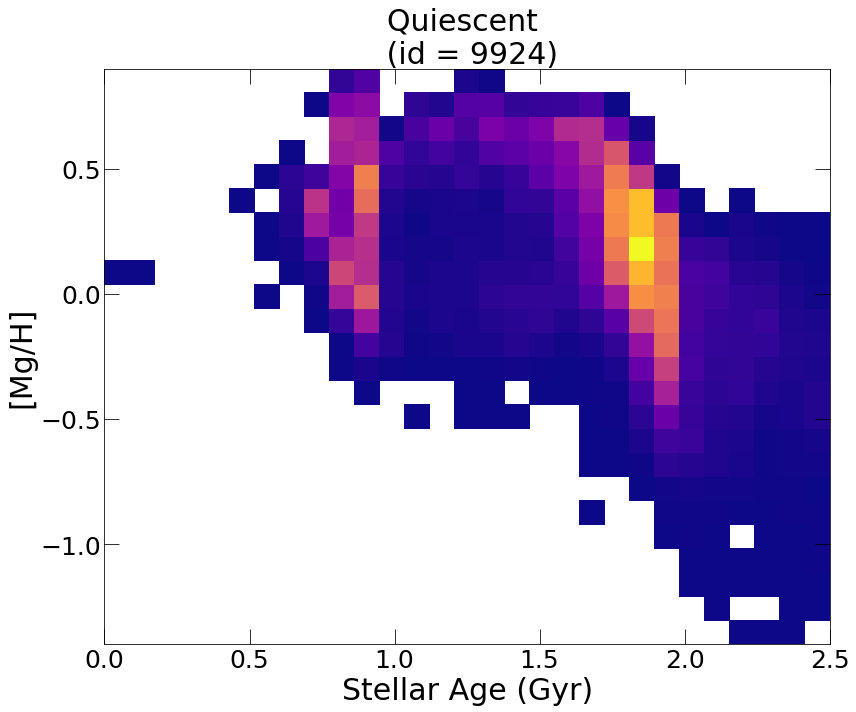

In [19]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(12, 10), constrained_layout=True)
ax1 = axes
f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(0.2, 25, 30)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
agebins = np.linspace(0, 2.5, 30)
metalbins = np.linspace(-1.4, 0.9, 25)
# densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(agebins)-1, len(metalbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
for id in np.random.choice(ids[quiescent_selection], 1, replace=False):
    logFeH, age = metals_profile(id=id, redshift=redshift, num='magnesium', den='hydrogen', axis='age', only_particles=True)
    h, _, _ = np.histogram2d(age, logFeH, bins=[agebins, metalbins], density=False)#, len(percentiles))
#     h2, _, _ = np.histogram2d(R, logFeH, bins=[xbins, metalbins], density=False)
#     h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
#     big_h3 += h3
#     big_h2 += h2
    big_h += h 
    number = id
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(agebins, metalbins, big_h.T, cmap='plasma', color=color, edgecolor=None)
ax1.set_title('Quiescent \n (id = '+str(number)+')', fontsize=fts) #
ax1.set_ylim(-1.4, 0.9)
ax1.set_xlim(0.0, 2.5)
ax1.set_ylabel("[Mg/H]", fontsize=fts)
ax1.set_xlabel('Stellar Age (Gyr)', fontsize=fts)
# ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

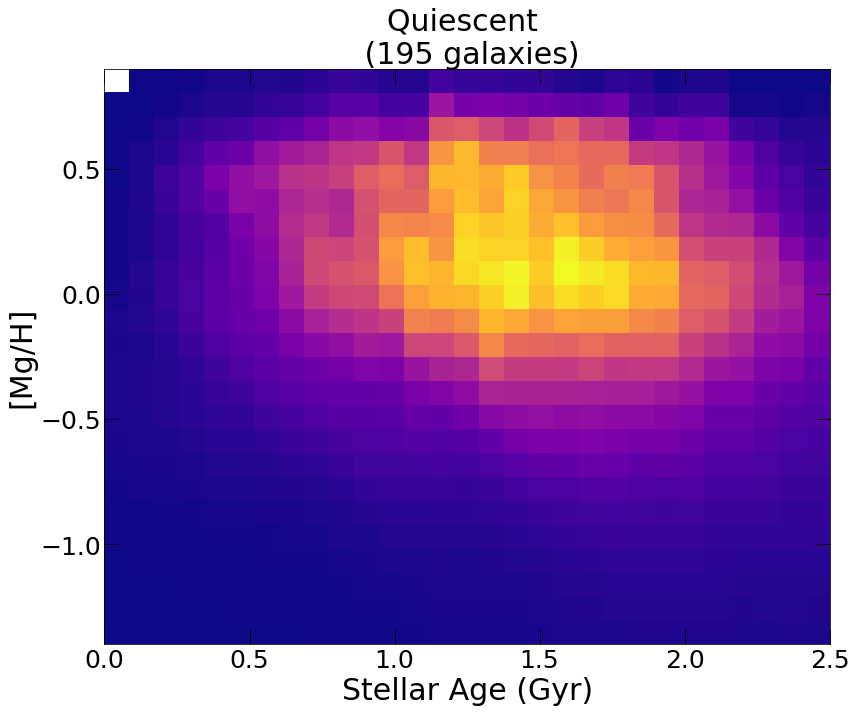

In [20]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(12, 10), constrained_layout=True)
ax1 = axes
f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(0.2, 25, 30)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
agebins = np.linspace(0, 2.5, 30)
metalbins = np.linspace(-1.4, 0.9, 25)
# densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(agebins)-1, len(metalbins)-1))
# big_h2 = np.zeros((len(xbins)-1, len(metalbins)-1))
# big_h3 = np.zeros((len(densitybins2)-1, len(metalbins)-1))
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    logFeH, age = metals_profile(id=id, redshift=redshift, num='magnesium', den='hydrogen', axis='age', only_particles=True)
    h, _, _ = np.histogram2d(age, logFeH, bins=[agebins, metalbins], density=False)#, len(percentiles))
#     h2, _, _ = np.histogram2d(R, logFeH, bins=[xbins, metalbins], density=False)
#     h3, _, _ = np.histogram2d(np.log10(density), logFeH, bins=[densitybins2, metalbins], density=False)
#     big_h3 += h3
#     big_h2 += h2
    big_h += h 
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(agebins, metalbins, big_h.T, cmap='plasma', color=color, edgecolor=None)
ax1.set_title('Quiescent \n ('+str(len(ids[quiescent_selection]))+' galaxies)', fontsize=fts) #
ax1.set_ylim(-1.4, 0.9)
ax1.set_xlim(0.0, 2.5)
ax1.set_ylabel("[Mg/H]", fontsize=fts)
ax1.set_xlabel('Stellar Age (Gyr)', fontsize=fts)
# ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

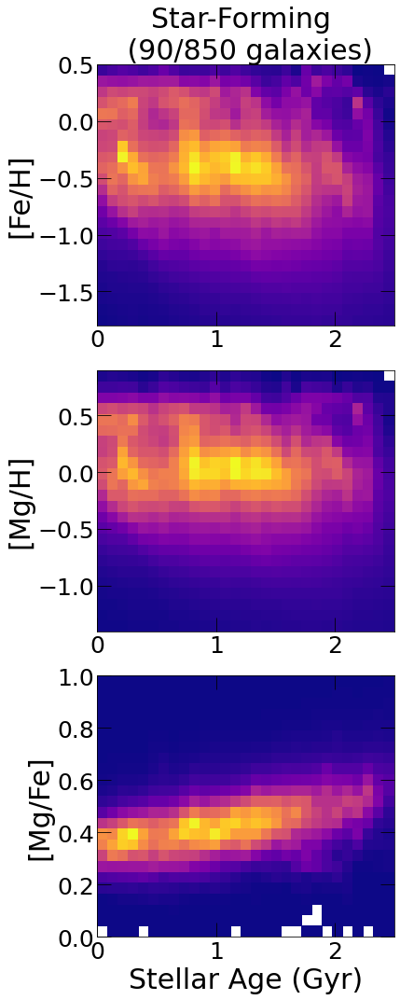

In [9]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(3, 1, sharex='none', sharey='none', figsize=(6, 15), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]
ax3 = axes[2]
f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(0.2, 25, 30)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
agebins = np.linspace(0, 2.5, 30)
metalbins = np.linspace(-1.8, 0.5, 25)
MgHbins = np.linspace(-1.4, 0.9, 25)
MgFebins = np.linspace(0, 1, 25)
# densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(agebins)-1, len(metalbins)-1))
big_h2 = np.zeros((len(agebins)-1, len(metalbins)-1))
big_h3 = np.zeros((len(agebins)-1, len(metalbins)-1))
for id in np.random.choice(ids[starforming_selection], 90, replace=False):
    logFeH, age = metals_profile(id=id, redshift=redshift, num='iron', den='hydrogen', axis='age', only_particles=True)
    logMgH, age = metals_profile(id=id, redshift=redshift, num='magnesium', den='hydrogen', axis='age', only_particles=True)
    logMgFe, age = metals_profile(id=id, redshift=redshift, num='magnesium', den='iron', axis='age', only_particles=True)
    h, _, _ = np.histogram2d(age, logFeH, bins=[agebins, metalbins], density=False)#, len(percentiles))
    h2, _, _ = np.histogram2d(age, logMgH, bins=[agebins, MgHbins], density=False)
    h3, _, _ = np.histogram2d(age, logMgFe, bins=[agebins, MgFebins], density=False)
    big_h3 += h3
    big_h2 += h2
    big_h += h 
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(agebins, metalbins, big_h.T, cmap='plasma', color=color, edgecolor=None)
ax1.set_title('Star-Forming \n (90/'+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_ylim(-1.8, 0.5)
# ax1.set_xlim(0.0, 7)
ax1.set_ylabel("[Fe/H]", fontsize=fts)
# ax1.set_xlabel('Stellar Age (Gyr)', fontsize=fts)
# ax1.set_xscale('log')
# ax1.tick_params(which='major', length=15)
# ax1.tick_params(which='minor', length=8)
# ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(agebins, MgHbins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
ax2.set_ylim(-1.4, 0.9)
ax2.set_ylabel("[Mg/H]", fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(agebins, MgFebins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
ax3.set_ylim(0, 1)
ax3.set_ylabel("[Mg/Fe]", fontsize=fts)
ax3.set_xlabel('Stellar Age (Gyr)', fontsize=fts)

for ax in axes:
    ax.set_xlim(0.0, 2.5)
    ax.tick_params(which='major', length=15)
    ax.tick_params(which='minor', length=8)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

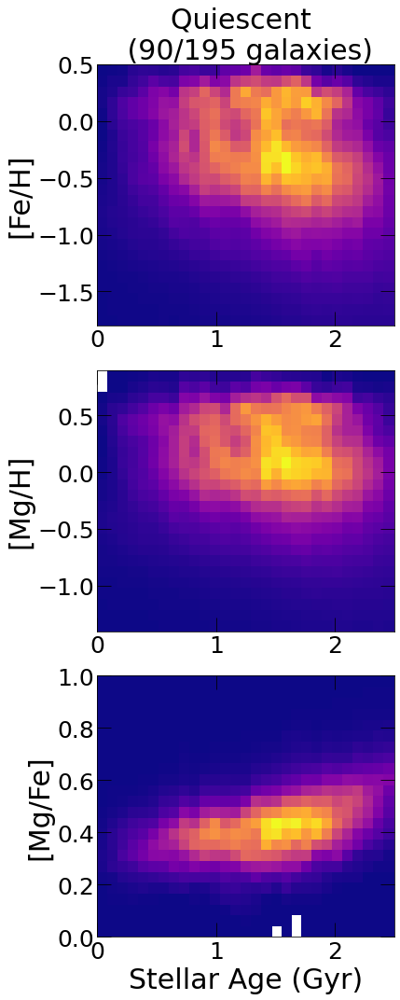

In [10]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(3, 1, sharex='none', sharey='none', figsize=(6, 15), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]
ax3 = axes[2]
f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(0.2, 25, 30)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
agebins = np.linspace(0, 2.5, 30)
metalbins = np.linspace(-1.8, 0.5, 25)
MgHbins = np.linspace(-1.4, 0.9, 25)
MgFebins = np.linspace(0, 1, 25)
# densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(agebins)-1, len(metalbins)-1))
big_h2 = np.zeros((len(agebins)-1, len(metalbins)-1))
big_h3 = np.zeros((len(agebins)-1, len(metalbins)-1))
for id in np.random.choice(ids[quiescent_selection], 90, replace=False):
    logFeH, age = metals_profile(id=id, redshift=redshift, num='iron', den='hydrogen', axis='age', only_particles=True)
    logMgH, age = metals_profile(id=id, redshift=redshift, num='magnesium', den='hydrogen', axis='age', only_particles=True)
    logMgFe, age = metals_profile(id=id, redshift=redshift, num='magnesium', den='iron', axis='age', only_particles=True)
    h, _, _ = np.histogram2d(age, logFeH, bins=[agebins, metalbins], density=False)#, len(percentiles))
    h2, _, _ = np.histogram2d(age, logMgH, bins=[agebins, MgHbins], density=False)
    h3, _, _ = np.histogram2d(age, logMgFe, bins=[agebins, MgFebins], density=False)
    big_h3 += h3
    big_h2 += h2
    big_h += h 
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(agebins, metalbins, big_h.T, cmap='plasma', color=color, edgecolor=None)
ax1.set_title('Quiescent \n (90/'+str(len(ids[quiescent_selection]))+' galaxies)', fontsize=fts) #
ax1.set_ylim(-1.8, 0.5)
# ax1.set_xlim(0.0, 7)
ax1.set_ylabel("[Fe/H]", fontsize=fts)
# ax1.set_xlabel('Stellar Age (Gyr)', fontsize=fts)
# ax1.set_xscale('log')
# ax1.tick_params(which='major', length=15)
# ax1.tick_params(which='minor', length=8)
# ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(agebins, MgHbins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
ax2.set_ylim(-1.4, 0.9)
ax2.set_ylabel("[Mg/H]", fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(agebins, MgFebins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
ax3.set_ylim(0, 1)
ax3.set_ylabel("[Mg/Fe]", fontsize=fts)
ax3.set_xlabel('Stellar Age (Gyr)', fontsize=fts)

for ax in axes:
    ax.set_xlim(0.0, 2.5)
    ax.tick_params(which='major', length=15)
    ax.tick_params(which='minor', length=8)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

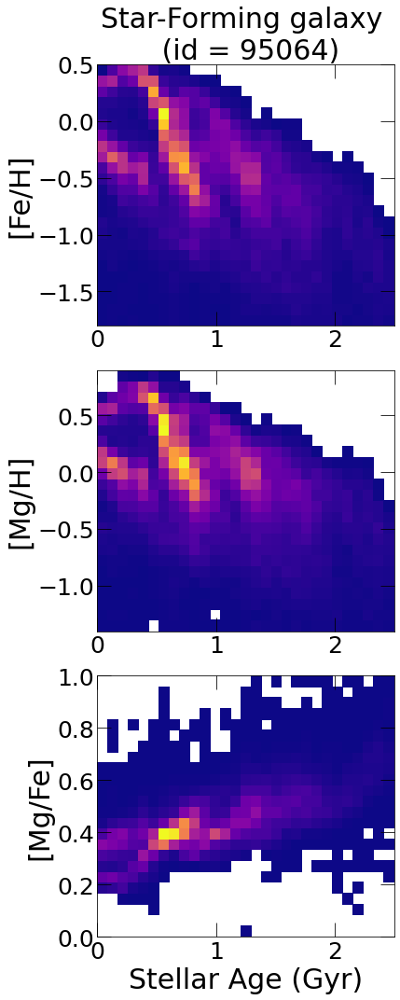

In [11]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(3, 1, sharex='none', sharey='none', figsize=(6, 15), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]
ax3 = axes[2]
f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(0.2, 25, 30)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
agebins = np.linspace(0, 2.5, 30)
metalbins = np.linspace(-1.8, 0.5, 25)
MgHbins = np.linspace(-1.4, 0.9, 25)
MgFebins = np.linspace(0, 1, 25)
# densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(agebins)-1, len(metalbins)-1))
big_h2 = np.zeros((len(agebins)-1, len(metalbins)-1))
big_h3 = np.zeros((len(agebins)-1, len(metalbins)-1))
for id in np.random.choice(ids[starforming_selection], 1, replace=False):
    logFeH, age = metals_profile(id=id, redshift=redshift, num='iron', den='hydrogen', axis='age', only_particles=True)
    logMgH, age = metals_profile(id=id, redshift=redshift, num='magnesium', den='hydrogen', axis='age', only_particles=True)
    logMgFe, age = metals_profile(id=id, redshift=redshift, num='magnesium', den='iron', axis='age', only_particles=True)
    h, _, _ = np.histogram2d(age, logFeH, bins=[agebins, metalbins], density=False)#, len(percentiles))
    h2, _, _ = np.histogram2d(age, logMgH, bins=[agebins, MgHbins], density=False)
    h3, _, _ = np.histogram2d(age, logMgFe, bins=[agebins, MgFebins], density=False)
    big_h3 += h3
    big_h2 += h2
    big_h += h 
    number = id
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(agebins, metalbins, big_h.T, cmap='plasma', color=color, edgecolor=None)
ax1.set_title('Star-Forming galaxy \n (id = '+str(number)+')', fontsize=fts) #
ax1.set_ylim(-1.8, 0.5)
# ax1.set_xlim(0.0, 7)
ax1.set_ylabel("[Fe/H]", fontsize=fts)
# ax1.set_xlabel('Stellar Age (Gyr)', fontsize=fts)
# ax1.set_xscale('log')
# ax1.tick_params(which='major', length=15)
# ax1.tick_params(which='minor', length=8)
# ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(agebins, MgHbins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
ax2.set_ylim(-1.4, 0.9)
ax2.set_ylabel("[Mg/H]", fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(agebins, MgFebins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
ax3.set_ylim(0, 1)
ax3.set_ylabel("[Mg/Fe]", fontsize=fts)
ax3.set_xlabel('Stellar Age (Gyr)', fontsize=fts)

for ax in axes:
    ax.set_xlim(0.0, 2.5)
    ax.tick_params(which='major', length=15)
    ax.tick_params(which='minor', length=8)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

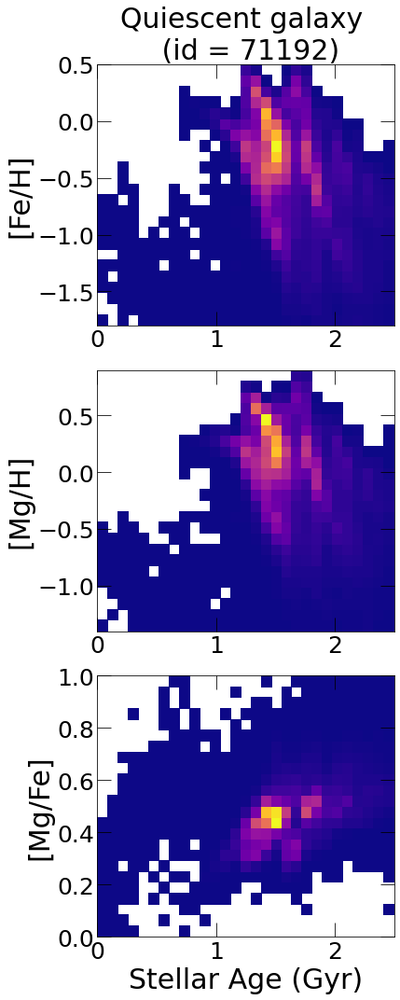

In [12]:
from matplotlib import colors

#metallicity profiles
f, (axes) = plt.subplots(3, 1, sharex='none', sharey='none', figsize=(6, 15), constrained_layout=True)
ax1 = axes[0]
ax2 = axes[1]
ax3 = axes[2]
f.set_facecolor('w')
n_bins = 50
fts = 30
ftss = 25
vmin = 1.0

colormap = plt.get_cmap('plasma')
norm = colors.Normalize(vmin=vmin, vmax=230)

# xbins = np.linspace(0.2, 25, 30)
# xbins = np.logspace(np.log10(0.2), np.log10(25), 20)
agebins = np.linspace(0, 2.5, 30)
metalbins = np.linspace(-1.8, 0.5, 25)
MgHbins = np.linspace(-1.4, 0.9, 25)
MgFebins = np.linspace(0, 1, 25)
# densitybins2 = np.linspace(1.5, 12, 20)

#z=2 star-forming galaxies
big_h = np.zeros((len(agebins)-1, len(metalbins)-1))
big_h2 = np.zeros((len(agebins)-1, len(metalbins)-1))
big_h3 = np.zeros((len(agebins)-1, len(metalbins)-1))
for id in np.random.choice(ids[quiescent_selection], 1, replace=False):
    logFeH, age = metals_profile(id=id, redshift=redshift, num='iron', den='hydrogen', axis='age', only_particles=True)
    logMgH, age = metals_profile(id=id, redshift=redshift, num='magnesium', den='hydrogen', axis='age', only_particles=True)
    logMgFe, age = metals_profile(id=id, redshift=redshift, num='magnesium', den='iron', axis='age', only_particles=True)
    h, _, _ = np.histogram2d(age, logFeH, bins=[agebins, metalbins], density=False)#, len(percentiles))
    h2, _, _ = np.histogram2d(age, logMgH, bins=[agebins, MgHbins], density=False)
    h3, _, _ = np.histogram2d(age, logMgFe, bins=[agebins, MgFebins], density=False)
    big_h3 += h3
    big_h2 += h2
    big_h += h 
    number = id
big_h[big_h==0] = np.nan
color=colormap(norm(big_h)).tolist()
color = tuple(color[0][:])
ax1.pcolormesh(agebins, metalbins, big_h.T, cmap='plasma', color=color, edgecolor=None)
ax1.set_title('Quiescent galaxy \n (id = '+str(number)+')', fontsize=fts) #
ax1.set_ylim(-1.8, 0.5)
# ax1.set_xlim(0.0, 7)
ax1.set_ylabel("[Fe/H]", fontsize=fts)
# ax1.set_xlabel('Stellar Age (Gyr)', fontsize=fts)
# ax1.set_xscale('log')
# ax1.tick_params(which='major', length=15)
# ax1.tick_params(which='minor', length=8)
# ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

big_h2[big_h2==0] = np.nan
color=colormap(norm(big_h2)).tolist()
color = tuple(color[0][:])
ax2.pcolormesh(agebins, MgHbins, big_h2.T, cmap='plasma', color=color, edgecolor=None)
ax2.set_ylim(-1.4, 0.9)
ax2.set_ylabel("[Mg/H]", fontsize=fts)

big_h3[big_h3==0] = np.nan
color=colormap(norm(big_h3)).tolist()
color = tuple(color[0][:])
ax3.pcolormesh(agebins, MgFebins, big_h3.T, cmap='plasma', color=color, edgecolor=None)
ax3.set_ylim(0, 1)
ax3.set_ylabel("[Mg/Fe]", fontsize=fts)
ax3.set_xlabel('Stellar Age (Gyr)', fontsize=fts)

for ax in axes:
    ax.set_xlim(0.0, 2.5)
    ax.tick_params(which='major', length=15)
    ax.tick_params(which='minor', length=8)
    ax.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)

f.tight_layout()

# In-situ formation

In [7]:
with h5py.File('stars_033.hdf5', 'r') as f:
    print(f.keys())
    stars_ParticleID = f['ParticleID'][:]
    insitu = f['InSitu'][:]
    SubfindID = f['SubfindID'][:]

<KeysViewHDF5 ['AccretionOrigin', 'AfterInfall', 'DistanceAtFormation', 'InSitu', 'MergerMassRatio', 'ParticleID', 'SnapNumAtFormation', 'SubfindID', 'SubfindIDAtFormation']>


In [ ]:
len(SubfindID)

In [7]:
id = ids[100]
id

20651

In [8]:
stellar_data = get_galaxy_particle_data(id=id, redshift=2, populate_dict=True)

In [9]:
ParticleIDs = stellar_data['ParticleIDs']

In [10]:
star_file_indices = np.where(np.in1d(stars_ParticleID, ParticleIDs))[0]

In [11]:
insitu_flag = insitu[star_file_indices]

In [12]:
ParticleIDs = ParticleIDs[insitu_flag==1]

In [13]:
len(ParticleIDs)

193053

In [19]:
ParticleIDs

array([108431136717, 108427860809, 108427699608, ..., 111343312757,
       111286780676, 111506305911], dtype=uint64)

In [18]:
insitu[stars_ParticleID in ParticleIDs]

array([], shape=(0, 143951082), dtype=int8)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268 269 270 271 272 273 274 275 

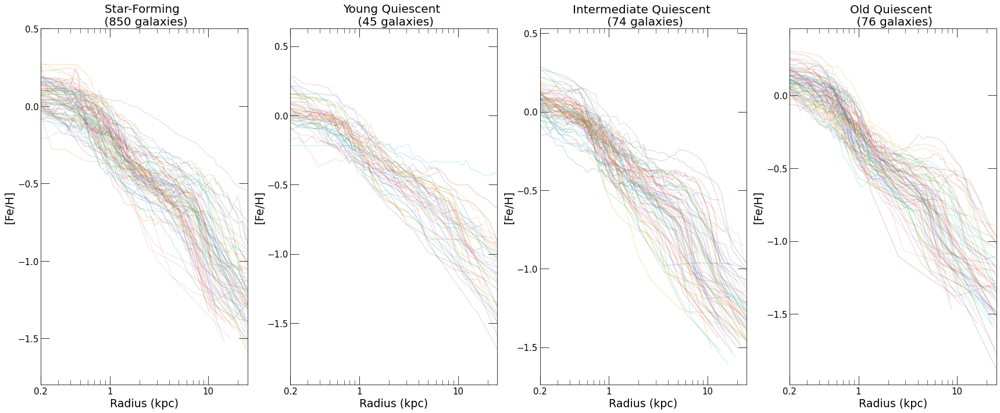

In [4]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
count = 0

#z=2 star-forming galaxies
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    insitu = get_insitu(id=id, redshift=redshift)
    count += 1
    print(count, end=' ')
    if np.count_nonzero(insitu) < 2:
        pass
    else:
        yy, logFeH, xx, R = metals_particle_profile(id=id, redshift=redshift, n_bins=n_bins, particles=insitu, num='iron', den='hydrogen')
        ax1.plot(xx, yy, alpha = 0.2)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=20) #
ax1.set_ylim(-1.8, 0.5)
ax1.set_xlim(0.2, 25)
ax1.set_ylabel("[Fe/H]", fontsize=19)
ax1.set_xlabel('Radius (kpc)', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

# #z=2 young quiescent galaxies
for id in ids[PSB_selection]:
    insitu = get_insitu(id=id, redshift=redshift)
    count += 1
    print(count, end=' ')
    if np.count_nonzero(insitu) < 2:
        pass
    else:
        yy, logFeH, xx, R = metals_particle_profile(id=id, redshift=redshift, n_bins=n_bins, particles=insitu, num='iron', den='hydrogen')
        ax2.plot(xx, yy, alpha = 0.2)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=20) #
ax1.set_ylim(-1.8, 0.5)
ax2.set_xlim(0.2, 25)
ax2.set_ylabel("[Fe/H]", fontsize=19)
ax2.set_xlabel('Radius (kpc)', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

# #z=2 intermediate quiescent galaxies
for id in ids[intermediate_quiescent_selection]:
    insitu = get_insitu(id=id, redshift=redshift)
    count += 1
    print(count, end=' ')
    if np.count_nonzero(insitu) < 2:
        pass
    else:
        yy, logFeH, xx, R = metals_particle_profile(id=id, redshift=redshift, n_bins=n_bins, particles=insitu, num='iron', den='hydrogen')
        ax3.plot(xx, yy, alpha = 0.2)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=20) #
ax1.set_ylim(-1.8, 0.5)
ax3.set_xlim(0.2, 25)
ax3.set_ylabel("[Fe/H]", fontsize=19)
ax3.set_xlabel('Radius (kpc)', fontsize=19)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
for id in ids[old_quiescent_selection]:
    insitu = get_insitu(id=id, redshift=redshift)
    count += 1
    print(count, end=' ')
    if np.count_nonzero(insitu) < 2:
        pass
    else:
        yy, logFeH, xx, R = metals_particle_profile(id=id, redshift=redshift, n_bins=n_bins, particles=insitu, num='iron', den='hydrogen')
        ax4.plot(xx, yy, alpha = 0.2)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=20)
ax1.set_ylim(-1.8, 0.5)
ax4.set_xlim(0.2, 25)
ax4.set_ylabel("[Fe/H]", fontsize=19)
ax4.set_xlabel('Radius (kpc)', fontsize=19)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()